### Importing libraries

In [1]:
#Importing audio file paths
import os

#For managing dataframe
import pandas as pd
import numpy as np

#PyTorch
import torchaudio
import torch
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset
from torch import nn

#Metrics
import seaborn as sb
import matplotlib.pyplot as plt
from torchmetrics.classification import MulticlassF1Score
from torchmetrics.classification import ConfusionMatrix

# Misc.
import warnings
import librosa
import torchvision
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler
from tqdm.notebook import tqdm_notebook
from IPython.display import Audio

warnings.filterwarnings("ignore")

#Selecting device
device="cuda" if torch.cuda.is_available() else "cpu"

print(f"Using {device}")

Using cuda


### Dataset Loading

In [2]:
def add_noise(data,alpha=0.015):
    noise_value = alpha * np.random.uniform() * np.amax(data)
    data = data + noise_value * np.random.normal(size=data.shape[0])
    return data

def stretch_process(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=0.8)

def pitch_process(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)


def extract_process(data, sample_rate):
    output_result = np.array([])

    mean_zero = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    output_result = np.hstack((output_result, mean_zero))

    
    stft_out = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft_out, sr=sample_rate).T, axis=0)
    output_result = np.hstack((output_result, chroma_stft))

    mfcc_out = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40).T, axis=0)
    output_result = np.hstack((output_result, mfcc_out))

    root_mean_out = np.mean(librosa.feature.rms(y=data).T, axis=0)
    output_result = np.hstack((output_result, root_mean_out))

    mel_spectogram = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    output_result = np.hstack((output_result, mel_spectogram))
    

    return output_result


def extract_features(file_name):
    
    """
    This function takes in the path for an audio file as a string, loads it,
    and extracts several audio features including mean values of MFCC, Zero Crossing Rate,
    Chromagram, Root Mean Square Energy, and Mel Spectrogram from the original and its augmented versions.
    """
    
    try:
        # Load the original audio file
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast', duration=42, offset=0.6)

        # Extract features from the original audio data
        extracted_features = extract_process(audio, sample_rate)
        result = np.array(extracted_features)

        # Add noise and extract features
        noise_out = add_noise(audio)
        output_2 = extract_process(noise_out, sample_rate)
        result = np.vstack((result, output_2))

        # Time-stretch and then pitch-shift before extracting features
        new_out = stretch_process(audio,0.8)
        stretch_pitch = pitch_process(new_out, sample_rate,pitch_factor=0.7)
        output_3 = extract_process(stretch_pitch, sample_rate)
        result = np.vstack((result, output_3))

    except Exception as e:
        print("Error encountered while parsing file: ", file_name)
        print("Error Details:", e)
        return None

    return result

In [3]:
def class_fetch(df: pd.DataFrame())->(list,dict):
    s=list(sorted(df["target"].unique()))
    d={}
    
    count=0
    for i in s:
        d[i]=count
        count+=1
        
    return s,d

### Dataset Class

In [4]:
t=-1
type(t)==int

True

In [5]:
class audio_dataset(Dataset):
    def __init__(self,
                 audio_df_path=-1,
                 audio_df=-1,
                 transform=False) -> None:
        

        if(type(audio_df_path)==int and type(audio_df)==int):
            raise Exception("Both can't be empty at the same time (audio_df_path or audio_df)")

        if(type(audio_df_path)!=int):
            self.audio_df_path=audio_df_path
            self.df=pd.read_csv(self.audio_df_path)
        else:
            self.df=audio_df
            
        self.classes,self.class_to_idx=class_fetch(self.df)
        self.transform=transform
        self.scaler=StandardScaler()
    
    def apply_transform(self,x,sr):
        n=torch.randint(low=0,high=2,size=(1,))
        x=add_noise(x,0.015*n.item())
        x=stretch_process(x,0.8*n.item())
        x=pitch_process(x,sr,0.7*n.item())
        return x

    def get_all_class_idx(self):
        y=[]
        for i in range(len(self.df)):
            y.append(self.class_to_idx[self.df.iloc[i]["target"]])

        return y
    
    def __len__(self) -> int:
        return len(self.df)


    def __getitem__(self, index: int) -> torch.Tensor():
        
        self.val=self.df.iloc[index]["file_save_path"]
        self.class_val=self.class_to_idx[self.df.iloc[index]["target"]]

        self.signal, self.sr = librosa.load(self.val)
        
        if(self.transform!=False):
            self.signal=self.apply_transform(self.signal,self.sr)
            
        self.signal = torch.unsqueeze(torch.from_numpy(np.squeeze(self.scaler.fit_transform(np.reshape(extract_process(self.signal, self.sr),newshape=(-1,1))))),dim=0).type(torch.float32)
        
        return self.signal,self.class_val
            

### Train Test Split

In [6]:
path_df="../Sound_Classification/archive/processed_data.csv"
df=pd.read_csv("../Sound_Classification/archive/processed_data.csv")
test_size=0.25

cols=list(df.columns)
target=df["target"]

train_df,temp_df,temp1,temp2=train_test_split(df.values,target,test_size=test_size)

temp_df=pd.DataFrame(temp_df,columns=cols)
target=temp_df["target"]

test_df,val_df,temp1,temp2=train_test_split(temp_df.values,target,test_size=0.5)

train_df=pd.DataFrame(train_df,columns=cols)
val_df=pd.DataFrame(val_df,columns=cols)
test_df=pd.DataFrame(test_df,columns=cols)

In [7]:
train_df["target"].value_counts()

target
COPD              4307
Healthy            246
Pneumonia          222
URTI               184
Bronchiolitis      113
Bronchiectasis      73
Name: count, dtype: int64

In [8]:
test_df["target"].value_counts()

target
COPD              705
Healthy            41
Pneumonia          35
URTI               29
Bronchiolitis      27
Bronchiectasis     20
Name: count, dtype: int64

In [9]:
val_df["target"].value_counts()

target
COPD              734
Healthy            35
URTI               30
Pneumonia          28
Bronchiolitis      20
Bronchiectasis     11
Name: count, dtype: int64

In [10]:
1/train_df["target"].value_counts()

target
COPD              0.000232
Healthy           0.004065
Pneumonia         0.004505
URTI              0.005435
Bronchiolitis     0.008850
Bronchiectasis    0.013699
Name: count, dtype: float64

In [11]:
BATCH_SIZE=32

train_ds=audio_dataset(audio_df=train_df)
test_ds=audio_dataset(audio_df=test_df)
val_ds=audio_dataset(audio_df=val_df)

try:
    def get_class_weight_sampler(ds: audio_dataset) -> torch.Tensor():
        y=df["target"]
        class_weights = dict(1/pd.Series(y).value_counts())
        #print(class_weights)
        
        wt=[]
        for i in ds.classes:
            wt.append(class_weights[i])
        
        weight=[wt[i] for i in ds.get_all_class_idx()]
        
        return weight
    
    weights=get_class_weight_sampler(train_ds)
    sampler_train=torch.utils.data.WeightedRandomSampler(weights=weights, num_samples=len(train_ds), replacement=True)
    
    train_loader=torch.utils.data.DataLoader(train_ds,batch_size=BATCH_SIZE,sampler=sampler_train)
    test_loader=torch.utils.data.DataLoader(test_ds,batch_size=BATCH_SIZE,shuffle=True)
    val_loader=torch.utils.data.DataLoader(val_ds,batch_size=BATCH_SIZE,shuffle=True)
    
    print(f"\nData loaded with oversampling")

except Exception as e:
    print(f"\n{e}\n")
    train_loader=torch.utils.data.DataLoader(train_ds,batch_size=BATCH_SIZE,shuffle=True)
    test_loader=torch.utils.data.DataLoader(test_ds,batch_size=BATCH_SIZE,shuffle=True)
    val_loader=torch.utils.data.DataLoader(val_ds,batch_size=BATCH_SIZE,shuffle=True)
    print(f"\nData loaded without oversampling")


Data loaded with oversampling


#### Class imblanace and data loader check

In [12]:
def show_imbalance(dl: torch.utils.data.DataLoader, batches: int, train_ds: torch.utils.data.Dataset):
    for i in range(batches):
        data, label=next(iter(dl))
        data_qty={i:0 for i in range(len(train_ds.classes))}
        for i in label:
            data_qty[i.item()]+=1
        print(data_qty)

show_imbalance(train_loader,2,train_ds)

{0: 1, 1: 8, 2: 4, 3: 8, 4: 7, 5: 4}
{0: 7, 1: 5, 2: 1, 3: 4, 4: 5, 5: 10}


In [13]:
im=next(iter(train_loader))[0]
im.shape

torch.Size([32, 1, 182])

In [14]:
im[0].dtype

torch.float32

In [15]:
assert ((train_ds.classes==test_ds.classes and test_ds.classes==val_ds.classes))
train_ds.classes==test_ds.classes and test_ds.classes==val_ds.classes

True

### Setting up Tensorboard and performance metrics

In [16]:
log_dir = "../"+"performance"
writer = SummaryWriter(log_dir=log_dir)

def accuracy_fn(logits,true):
    return torch.eq(torch.argmax(torch.softmax(logits,dim=1),dim=1).squeeze(),true).sum().item()/len(logits)

f1_fn=MulticlassF1Score(num_classes=len(train_ds.classes)).to(device)
cf_matrix=ConfusionMatrix(num_classes=len(train_ds.classes),task="multiclass")

### Model 1 (Simple Conv1D Network)

In [17]:
class auditory_conv1d(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_embedding=nn.Sequential(nn.Conv1d(in_channels=1,out_channels=256,stride=1,kernel_size=5),
                                           nn.ReLU(),
                                           nn.MaxPool1d(kernel_size=5,stride=2,padding=1),
                                           nn.Conv1d(in_channels=256,out_channels=256,kernel_size=4),
                                           nn.ReLU(),
                                           nn.MaxPool1d(kernel_size=5,stride=1,padding=1),
                                           nn.Conv1d(in_channels=256,out_channels=128,kernel_size=4),
                                           nn.ReLU(),
                                           nn.MaxPool1d(kernel_size=5,stride=2,padding=1),
                                           nn.Conv1d(in_channels=128,out_channels=64,kernel_size=4),
                                           nn.ReLU(),
                                           nn.MaxPool1d(kernel_size=5,stride=2,padding=1),
                                           nn.Conv1d(in_channels=64,out_channels=32,kernel_size=5),
                                           nn.ReLU(),
                                           nn.MaxPool1d(kernel_size=5,stride=2,padding=1),
                                           nn.Dropout(p=0.2),
                                           nn.Flatten(),
                                           nn.ReLU(),
                                           nn.Linear(in_features=192,out_features=32,bias=True),
                                           nn.ReLU(),
                                           nn.Dropout(p=0.3),
                                           nn.Linear(in_features=32,out_features=len(train_ds.classes),bias=True))

    def forward(self,x):
        return self.input_embedding(x)

### Model 2 (LSTM)

In [18]:
class auditory_lstm(nn.Module):
    def __init__(self,input_size=182,hidden_size=32,num_layers=2,output=6):
        super().__init__()
        self.input_size=input_size
        self.hidden_size=hidden_size
        self.num_layers=num_layers
        self.output=output
        self.lstm1=nn.LSTM(self.input_size,self.hidden_size,self.num_layers, batch_first=True)
        self.lstm_dropout=nn.Dropout(p=0.3)
        self.classifcation_head=nn.Sequential(nn.Linear(in_features=64,out_features=128,bias=True),
                                              nn.ReLU(),
                                              nn.BatchNorm1d(num_features=128),
                                              nn.Dropout(p=0.4),
                                              nn.Linear(in_features=128,out_features=128,bias=True),
                                              nn.ReLU(),
                                              nn.BatchNorm1d(num_features=128),
                                              nn.Dropout(p=0.3),
                                              nn.Linear(in_features=128,out_features=64,bias=True),
                                              nn.ReLU(),
                                              nn.Dropout(p=0.2),
                                              nn.Linear(in_features=64,out_features=self.output,bias=True))
        
    def forward(self, x):
        self.output, (_x,_y)=self.lstm1(x)
        self.output=self.classifcation_head(torch.squeeze(self.lstm_dropout(self.output)))
        return torch.squeeze(self.output)


class AudioLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(AudioLSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        
        out, _ = self.lstm(x, (h0, c0))
        # Use output of the last time step for classification
        out = self.fc(out[:, -1, :])
        return out

### Model Training and Testing

In [19]:
input_size = 182  # Input size, for example, if using a spectrogram
hidden_size = 64
num_layers = 2
num_classes = len(train_ds.classes)  # Number of classes for classification

model1=auditory_conv1d().to(device)
model2 = AudioLSTM(input_size, hidden_size, num_layers, num_classes).to(device)
#model2=auditory_lstm().to(device)

test=next(iter(train_loader))[0].to(device)

with torch.inference_mode():
    print(model1(test).shape)
    print(model2(test).shape)

torch.Size([32, 6])
torch.Size([32, 6])


#### Training Function

In [20]:
def train_model(model,epochs):
    optimizer=torch.optim.Adam(params=model.parameters())
    loss_fn=nn.CrossEntropyLoss()
    
    for i in tqdm_notebook(range(epochs)):
        train_preds=torch.tensor([])
        val_preds=torch.tensor([])
        train_actual=torch.tensor([])
        val_actual=torch.tensor([])
        
        print("\nTraining:")
        model.train()
        
        #Defining accuracy and loss for train and val data
        temp_train_accuracy=[]
        temp_val_accuracy=[]
        temp_train_loss=[]
        temp_val_loss=[]
        temp_train_f1=[]
        temp_val_f1=[]
    
        net_train_accuracy=0
        net_val_accuracy=0
        net_train_loss=0
        net_val_loss=0
        net_train_f1=0
        net_val_f1=0
        
        with tqdm_notebook(total=len(train_loader)) as pbar:
            for x,y in train_loader:
                    x=x.to(device)
                    y=y.to(device)
        
                    #Calculating model output
                    logits=model(x)
        
                    #Reseting any old gradient values
                    optimizer.zero_grad()
                    loss=loss_fn(logits.squeeze(),y)
                
                    #Track of metrics
                    preds=torch.argmax(torch.softmax(logits,dim=1),dim=1).squeeze()
                    train_preds=torch.hstack((train_preds,preds.to("cpu")))
                    train_actual=torch.hstack((train_actual,y.to("cpu")))
                    accuracy_train=accuracy_fn(logits.type(torch.float32),y)
                    f1_train=f1_fn(preds,y)
                    temp_train_accuracy.append(accuracy_train)
                    temp_train_loss.append(loss.item())
                    temp_train_f1.append(f1_train.item())
                
                    #Back Propogation
                    loss.backward()
                
                    #Update Parameters
                    optimizer.step()
                
                    #Progress Bar Update
                    pbar.update(1)
            pbar.close()
        #Tensorboard & Metrics for the dataset
        net_train_accuracy=sum(temp_train_accuracy)/len(temp_train_accuracy)
        net_train_loss=sum(temp_train_loss)/len(temp_train_loss)
        net_train_f1=sum(temp_train_f1)/len(temp_train_f1)
        writer.add_scalar("Train Accuracy",net_train_accuracy,i)
        writer.add_scalar("Train Loss",net_train_loss,i)
        writer.add_scalar("Train F1 Score",net_train_f1,i)
    
        #Evaluation
        print("Testing:")
        model.eval()
    
        with tqdm_notebook(total=len(val_loader)) as pbar2:
            for x,y in val_loader:
                x=x.to(device)
                y=y.to(device)
                
                #Setting inference mode
                with torch.inference_mode():
                    logits=model(x)
                    loss=loss_fn(logits.squeeze().type(torch.float32),y)
    
                    #Track of metrics
                    preds=torch.argmax(torch.softmax(logits,dim=1),dim=1).squeeze()
                    val_preds=torch.hstack((val_preds,preds.to("cpu")))
                    val_actual=torch.hstack((val_actual,y.to("cpu")))
                    accuracy_val=accuracy_fn(logits,y)
                    f1_val=f1_fn(preds,y)
                    temp_val_accuracy.append(accuracy_val)
                    temp_val_loss.append(loss.item())
                    temp_val_f1.append(f1_val.item())
    
                    #Progress Bar Update
                    pbar2.update(1)
            pbar2.close()
    
        #Tensorboard & Metrics for the dataset
        net_val_accuracy=sum(temp_val_accuracy)/len(temp_val_accuracy)
        net_val_loss=sum(temp_val_loss)/len(temp_val_loss)
        net_val_f1=sum(temp_val_f1)/len(temp_val_f1)
        writer.add_scalar("Val Accuracy",net_val_accuracy,i)
        writer.add_scalar("Val Loss",net_val_loss,i)
        writer.add_scalar("Val F1 Score",net_val_f1,i)

        '''
        #Saving the model
        try:
            os.makedirs(f"./{model_name}_feature_extractor/")
        except Exception as e:
            pass
        torch.save(model.state_dict(),f"./{model_name}_feature_extractor/checkpoint-{i+1}.pth")
        '''
        
        print(f"\nEpoch {i+1}:\n\nTrain Accuracy: {net_train_accuracy}\n\nTrain Loss: {net_train_loss}\n\nTrain F1 Score: {net_train_f1}\n\nVal Accuracy: {net_val_accuracy}\n\nVal Loss: {net_val_loss}\n\nVal F1 Score: {net_val_f1}")

        #Plotting confusion matrix
        print("\n")
        plt.figure(figsize=(10,5))
        sb.heatmap(cf_matrix(train_preds,train_actual),annot=True,xticklabels=train_ds.classes,yticklabels=train_ds.classes)
        plt.title("Train confusion matrix")
        plt.xlabel("Predictions")
        plt.ylabel("True")
        plt.show()
        
        print("\n")
        plt.figure(figsize=(10,5))
        sb.heatmap(cf_matrix(val_preds,val_actual),annot=True,xticklabels=train_ds.classes,yticklabels=train_ds.classes)
        plt.title("Val confusion matrix")
        plt.xlabel("Predictions")
        plt.ylabel("True")
        plt.show()

#### Training

  0%|          | 0/100 [00:00<?, ?it/s]


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 1:

Train Accuracy: 0.2677406832298137

Train Loss: 1.6348039193183

Train F1 Score: 0.18957697588557043

Val Accuracy: 0.6655092592592593
\Val Loss: 0.9390556547376845

Val F1 Score: 0.24154365669797967




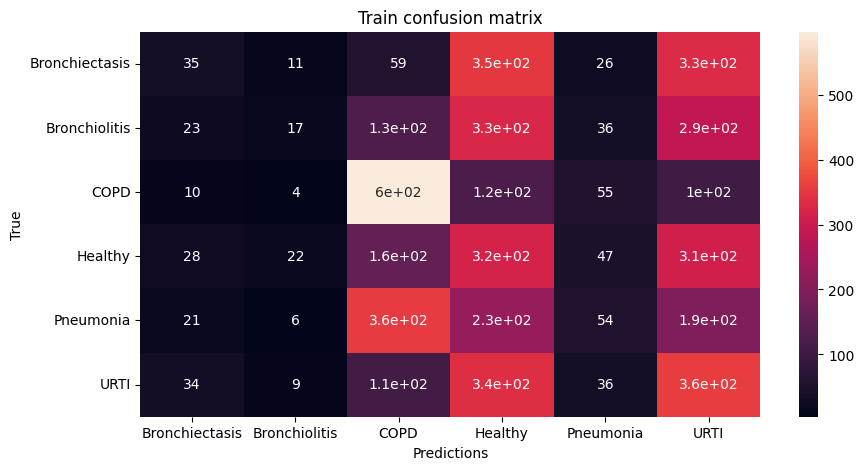

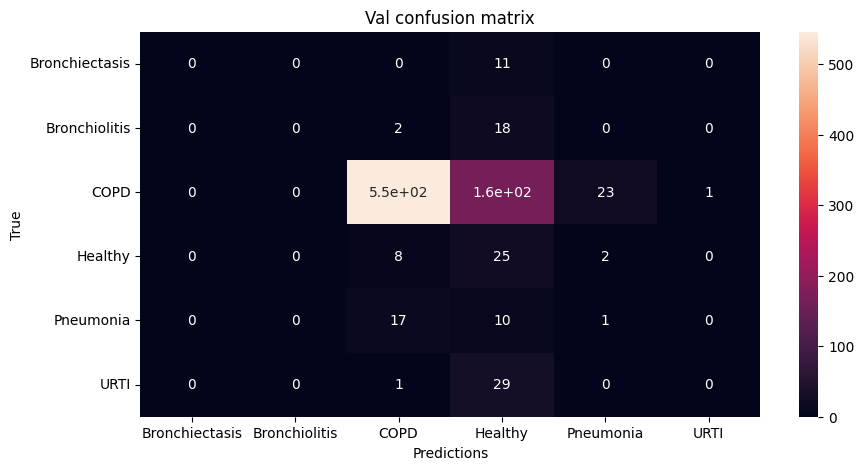


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 2:

Train Accuracy: 0.3627872670807453

Train Loss: 1.531843246140095

Train F1 Score: 0.3161584287881851

Val Accuracy: 0.5280448717948718
\Val Loss: 1.159728933263708

Val F1 Score: 0.22615134219328561




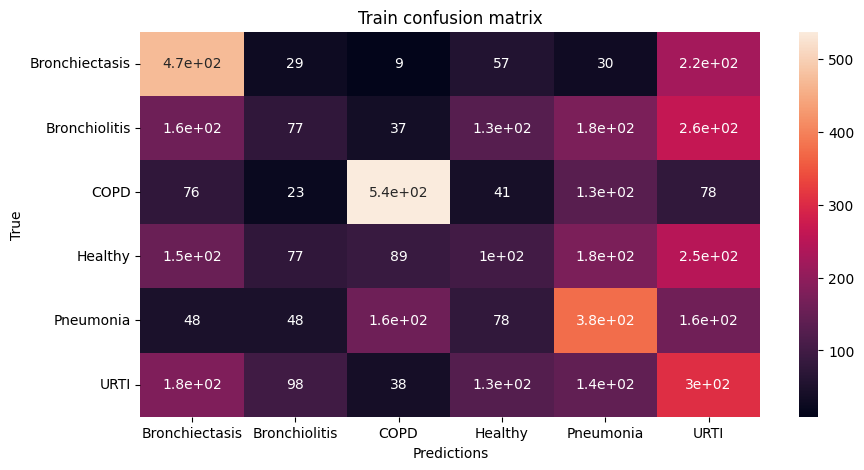

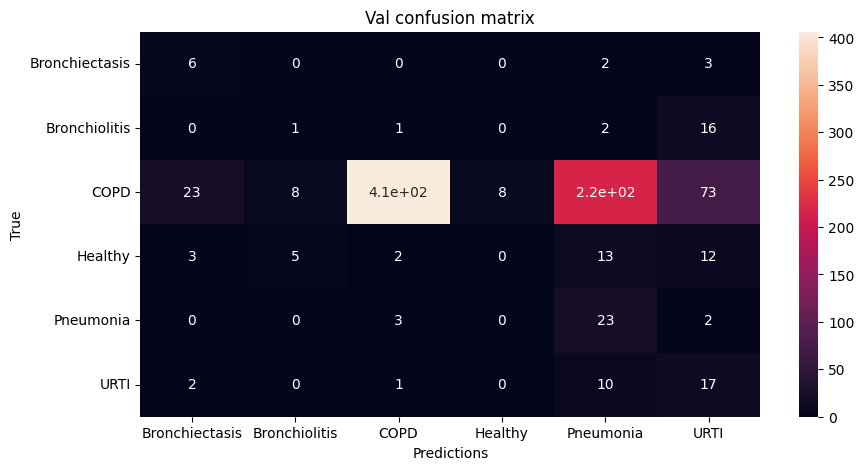


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 3:

Train Accuracy: 0.4788276397515528

Train Loss: 1.315980447005041

Train F1 Score: 0.4251404810025825

Val Accuracy: 0.5870726495726496
\Val Loss: 1.2402543778772708

Val F1 Score: 0.2575308492890111




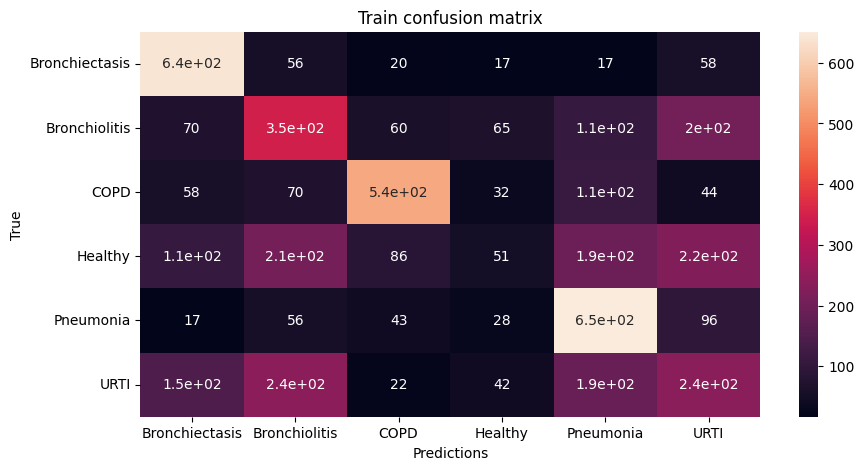

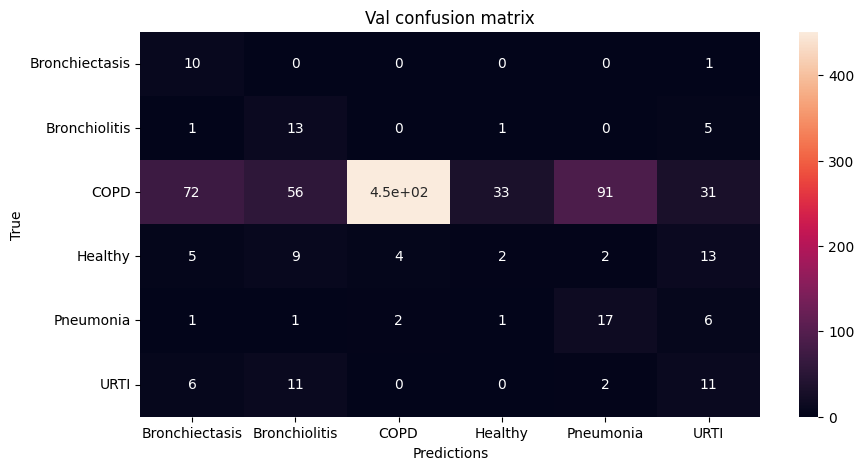


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 4:

Train Accuracy: 0.5046428571428572

Train Loss: 1.2301687975847944

Train F1 Score: 0.4472126575730602

Val Accuracy: 0.6766381766381767
\Val Loss: 0.9533272054460313

Val F1 Score: 0.294580947469782




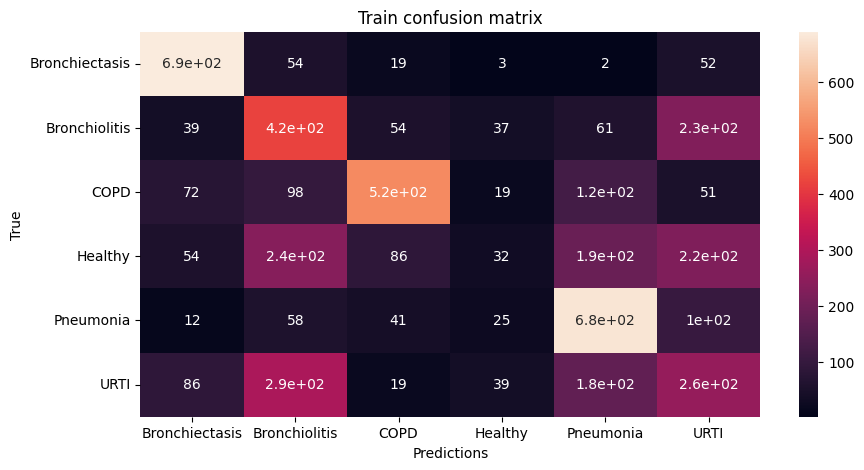

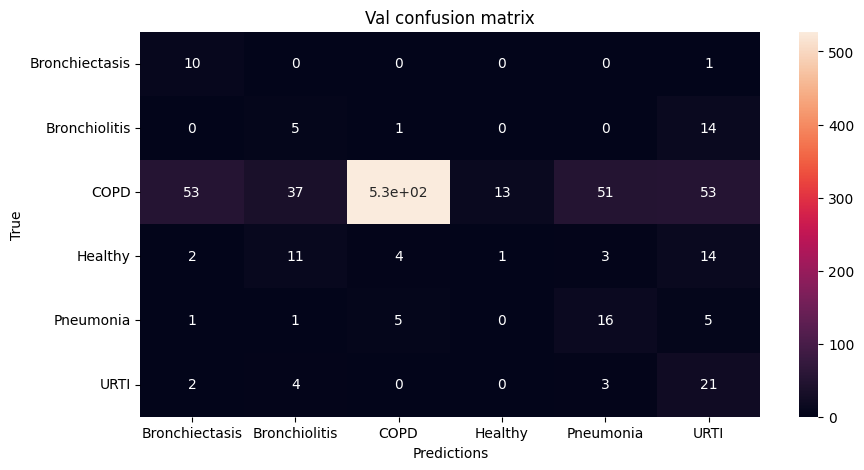


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 5:

Train Accuracy: 0.5354503105590062

Train Loss: 1.1322117355299293

Train F1 Score: 0.4947869857275708

Val Accuracy: 0.5603632478632479
\Val Loss: 1.226872691401729

Val F1 Score: 0.25550494618989805




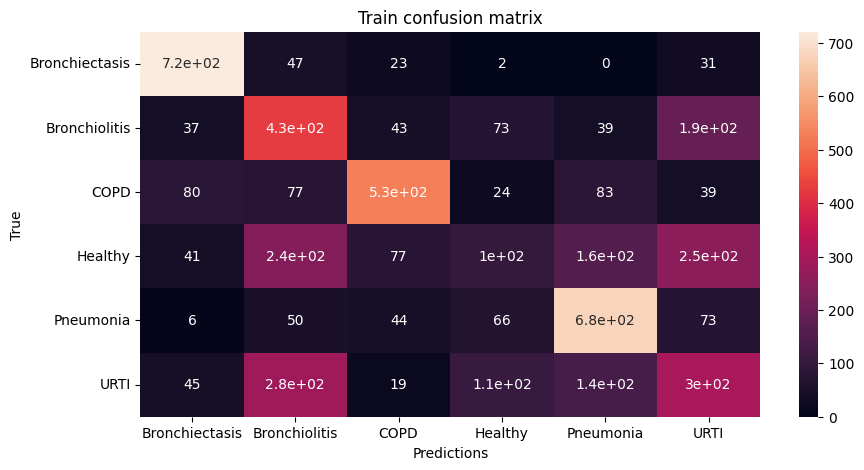

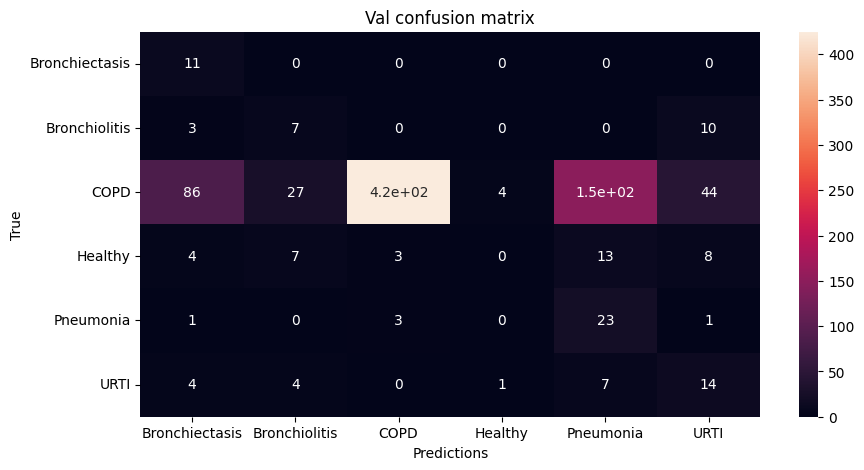


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 6:

Train Accuracy: 0.5816459627329192

Train Loss: 1.0284182836550364

Train F1 Score: 0.5551946165028566

Val Accuracy: 0.7470619658119658
\Val Loss: 0.6405188915906129

Val F1 Score: 0.31117449756021853




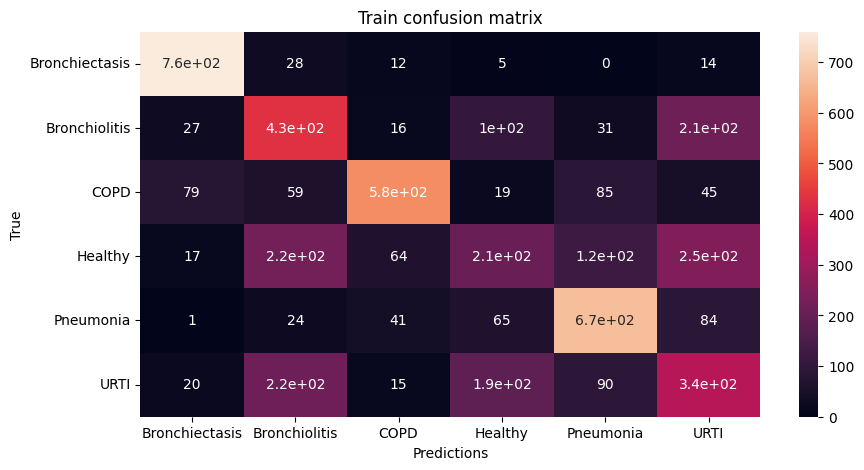

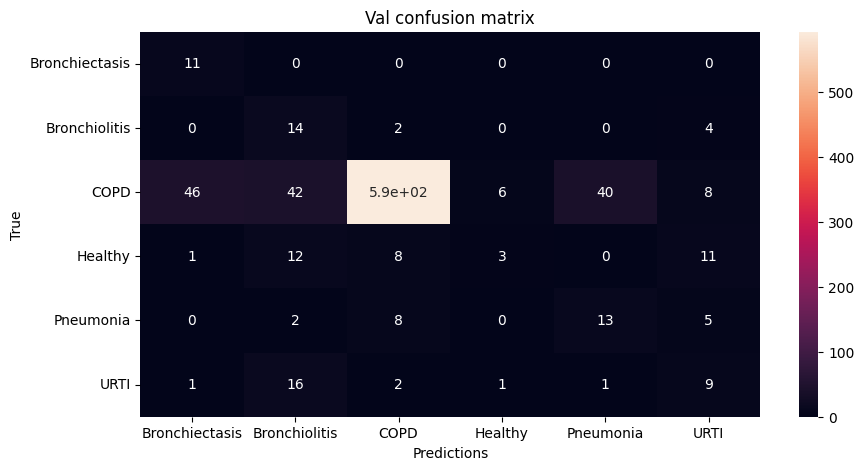


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 7:

Train Accuracy: 0.5934006211180124

Train Loss: 0.9910785174517898

Train F1 Score: 0.5708001202307873

Val Accuracy: 0.6920405982905983
\Val Loss: 0.8074623456707707

Val F1 Score: 0.3444419900576274




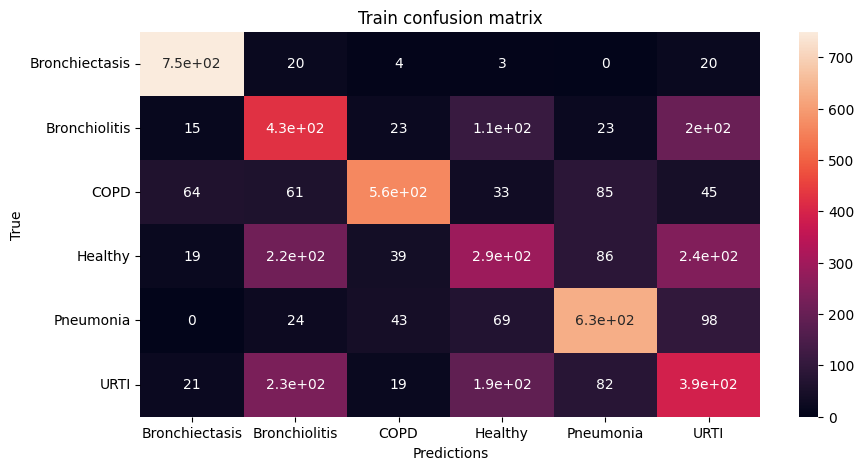

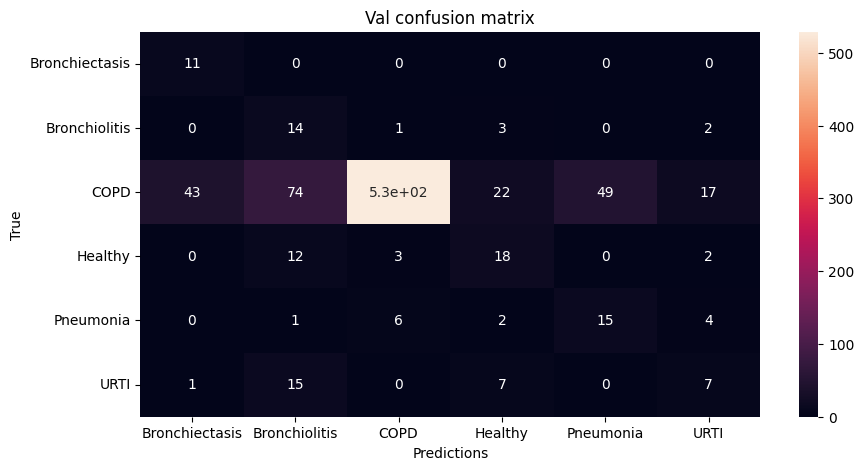


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 8:

Train Accuracy: 0.6250931677018634

Train Loss: 0.9374210419862167

Train F1 Score: 0.5910087797952734

Val Accuracy: 0.6810007122507122
\Val Loss: 0.6736075072376816

Val F1 Score: 0.33262960226447497




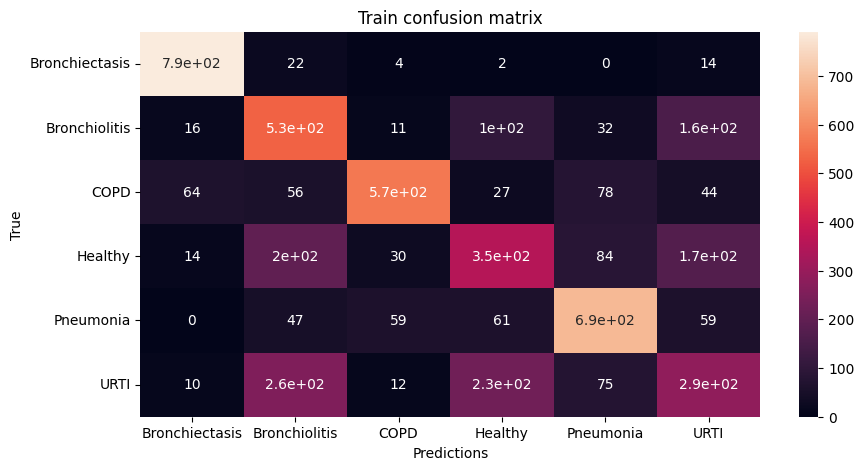

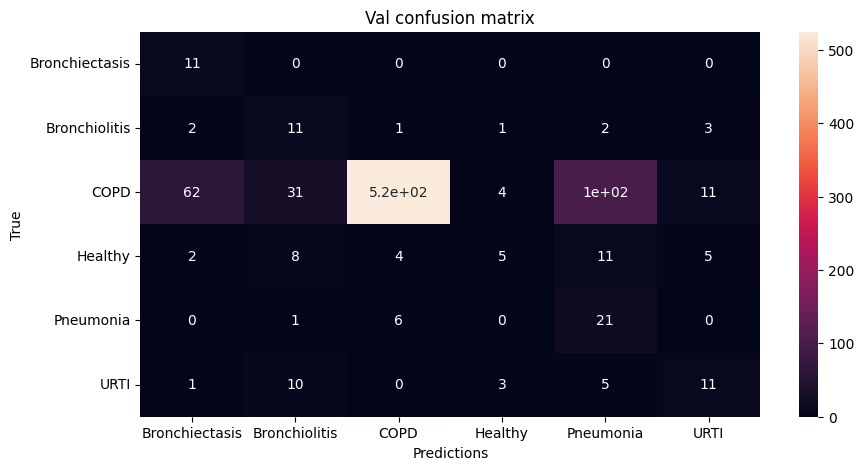


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 9:

Train Accuracy: 0.6581133540372671

Train Loss: 0.8474309044595091

Train F1 Score: 0.6325755306282399

Val Accuracy: 0.7435007122507122
\Val Loss: 0.6496575629269635

Val F1 Score: 0.4000303441727603




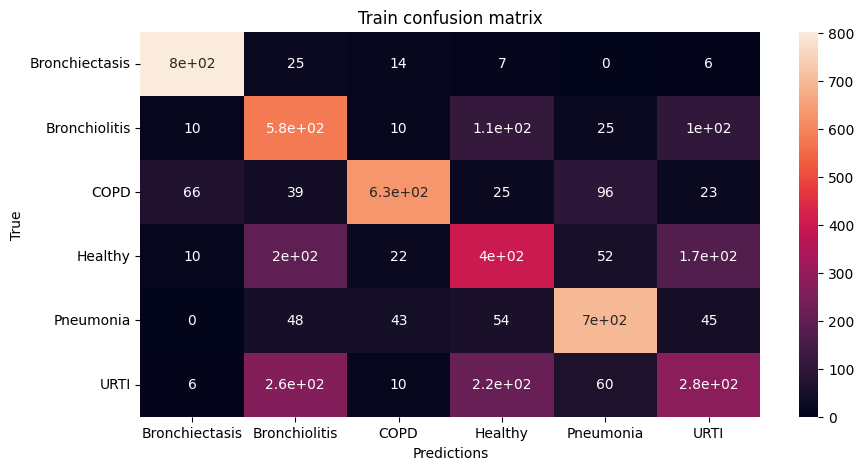

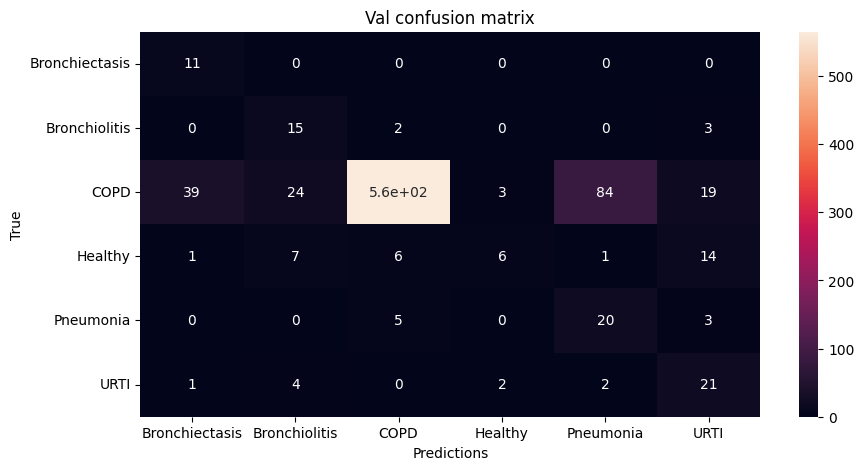


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 10:

Train Accuracy: 0.6620807453416149

Train Loss: 0.8473225010107763

Train F1 Score: 0.632615784310406

Val Accuracy: 0.7063746438746438
\Val Loss: 0.7305253103927329

Val F1 Score: 0.3821409455052129




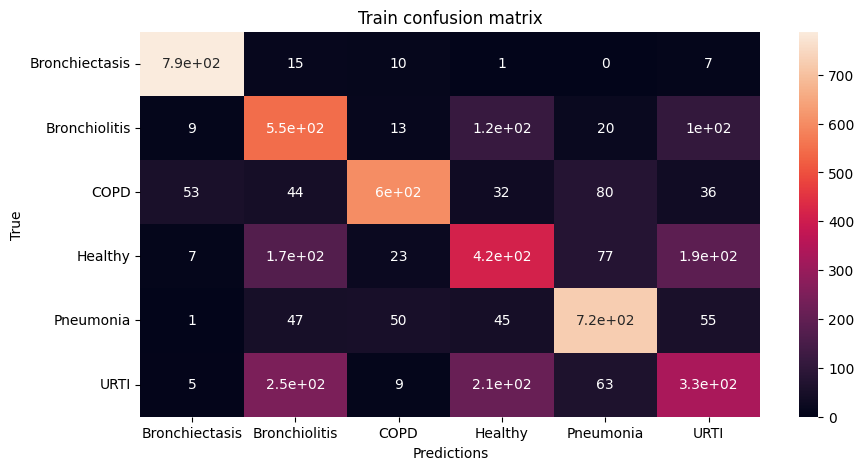

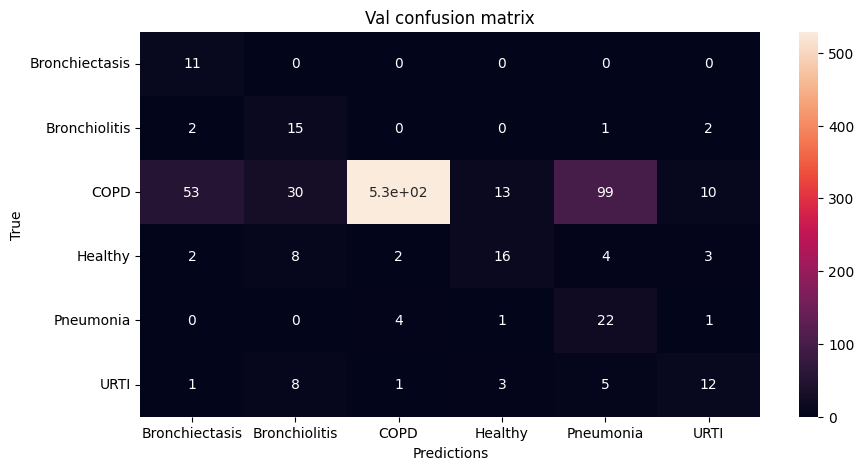


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 11:

Train Accuracy: 0.6854813664596273

Train Loss: 0.7917264187187882

Train F1 Score: 0.6622418640933422

Val Accuracy: 0.670940170940171
\Val Loss: 0.8924815147011368

Val F1 Score: 0.35256692711953763




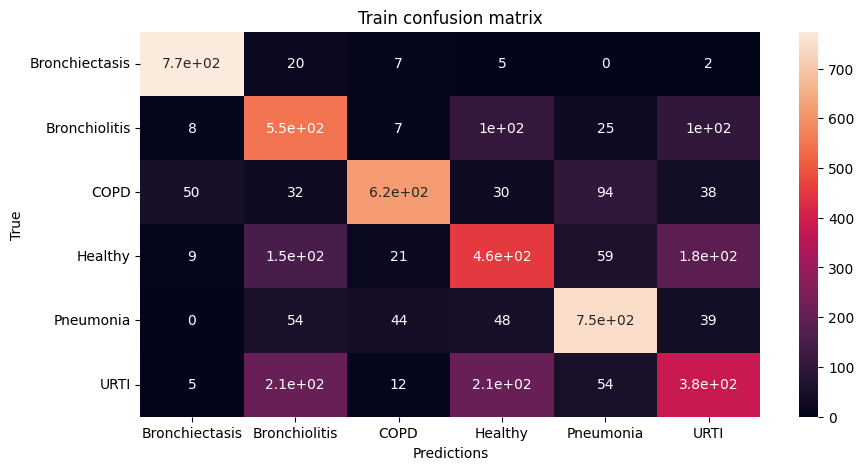

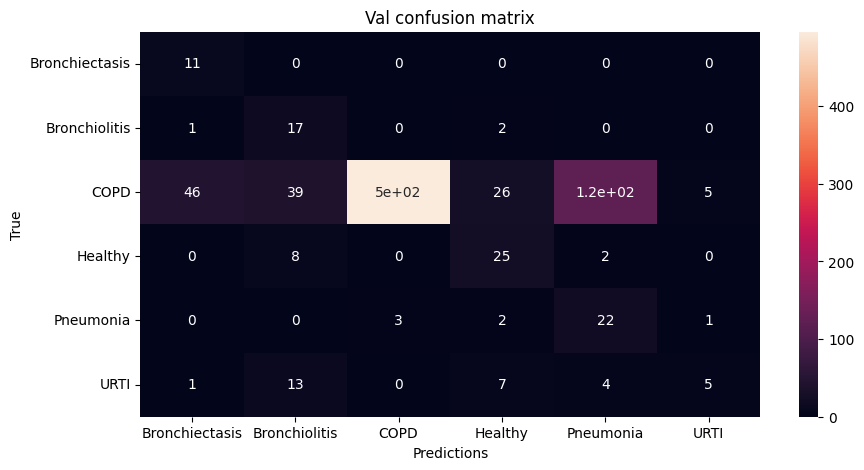


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 12:

Train Accuracy: 0.7128804347826088

Train Loss: 0.7379819373166339

Train F1 Score: 0.6835281532373487

Val Accuracy: 0.7880163817663818
\Val Loss: 0.558108267960725

Val F1 Score: 0.454779005712933




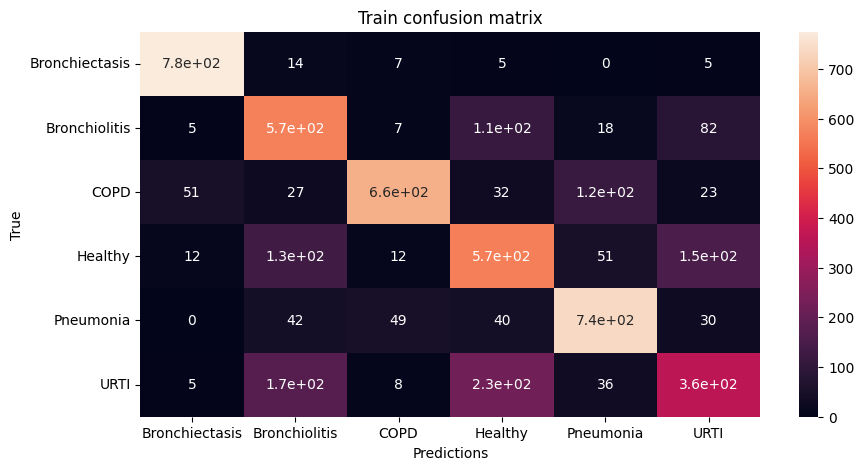

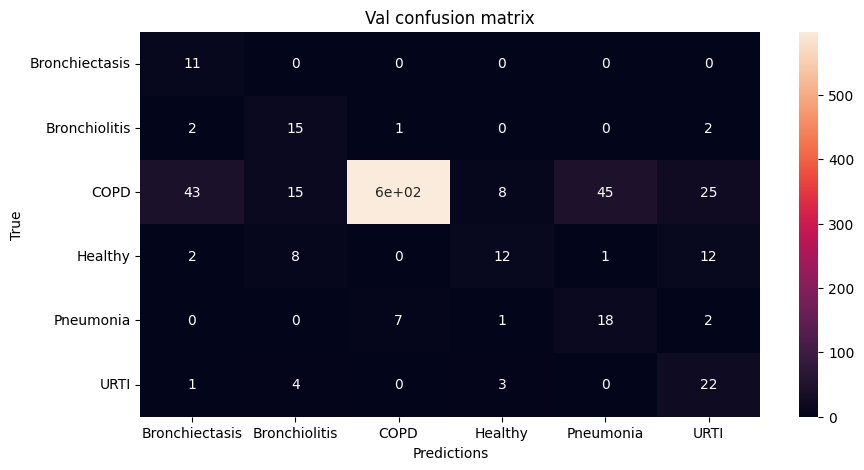


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 13:

Train Accuracy: 0.7216459627329193

Train Loss: 0.6970073371570303

Train F1 Score: 0.6995082082955734

Val Accuracy: 0.7839209401709402
\Val Loss: 0.5154277218712701

Val F1 Score: 0.5103610858873084




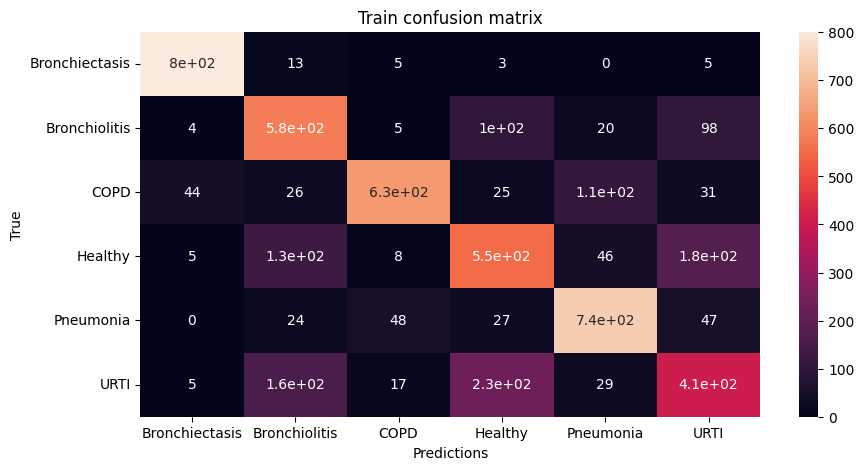

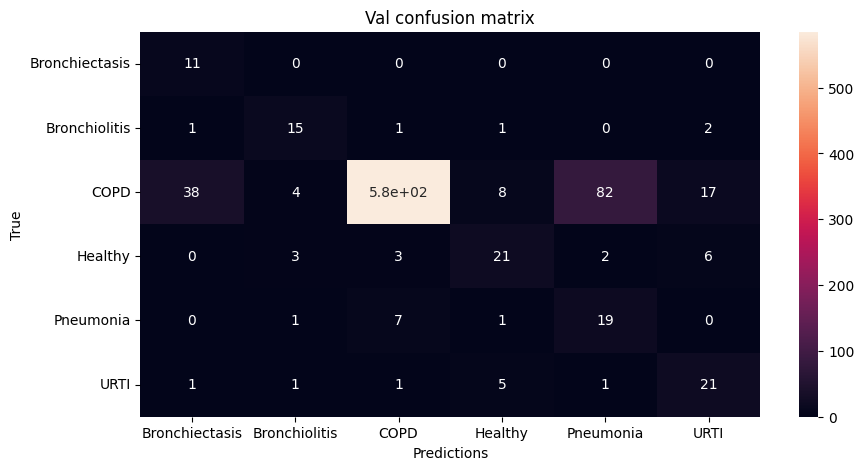


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 14:

Train Accuracy: 0.7342313664596274

Train Loss: 0.6782222577133534

Train F1 Score: 0.710417150895788

Val Accuracy: 0.753650284900285
\Val Loss: 0.6834191105983876

Val F1 Score: 0.4734779508025558




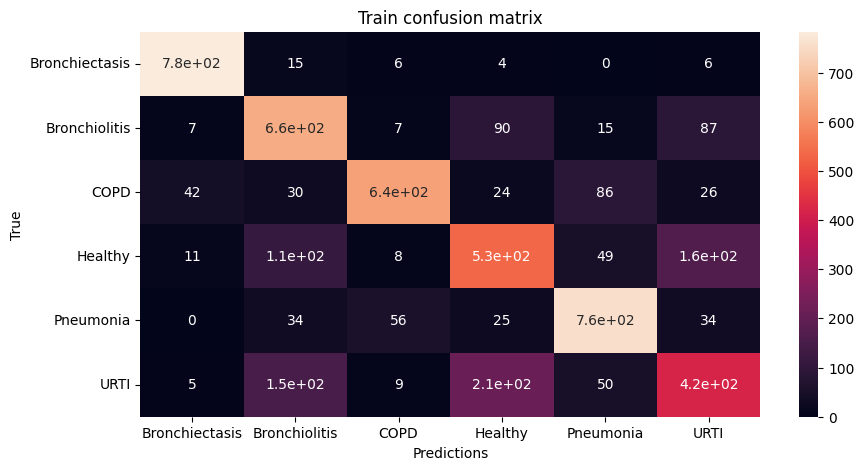

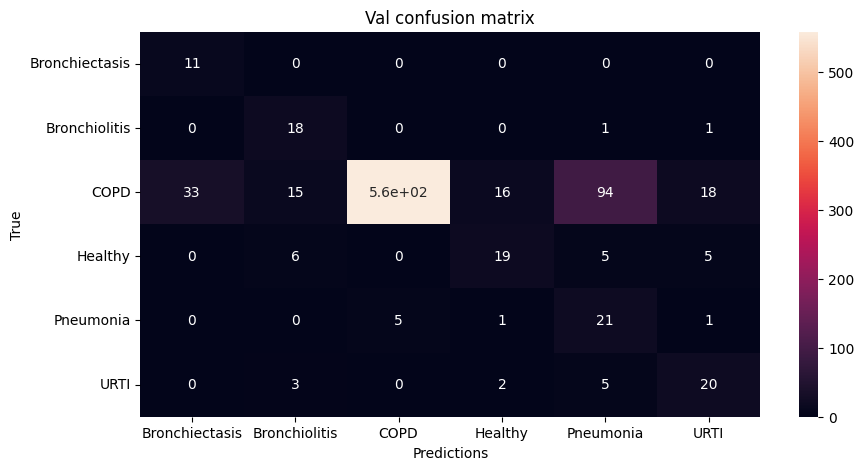


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 15:

Train Accuracy: 0.752445652173913

Train Loss: 0.6418278767085224

Train F1 Score: 0.7301685891536452

Val Accuracy: 0.7319266381766382
\Val Loss: 0.6789648996459113

Val F1 Score: 0.42256746137583695




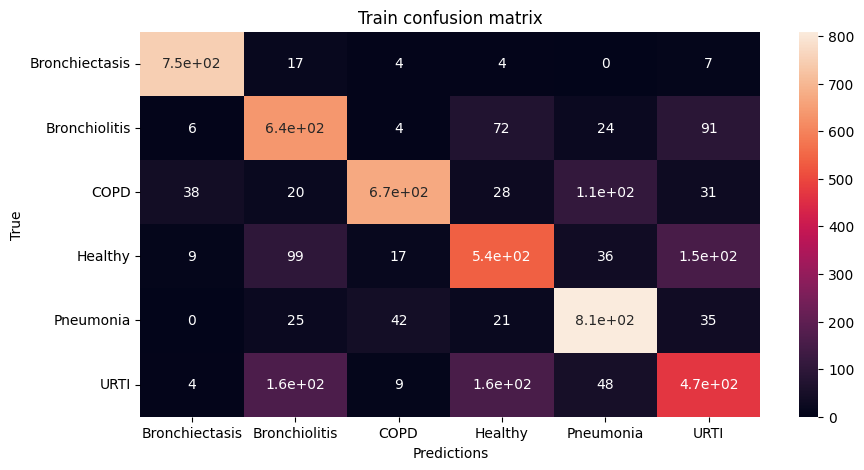

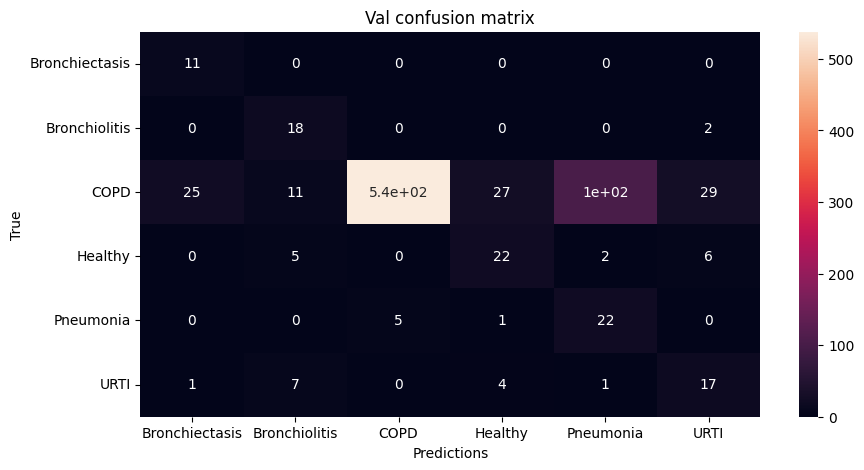


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 16:

Train Accuracy: 0.7651164596273292

Train Loss: 0.6161544226711582

Train F1 Score: 0.7441031858787773

Val Accuracy: 0.7526709401709402
\Val Loss: 0.7093172128553744

Val F1 Score: 0.4266530617519661




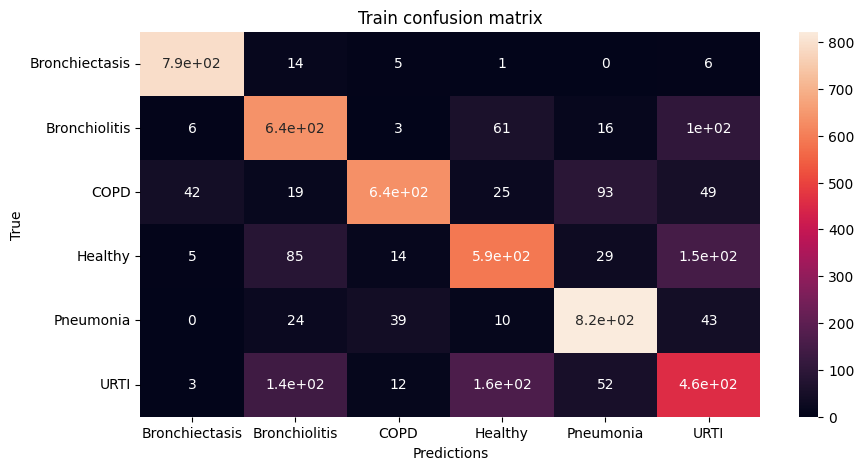

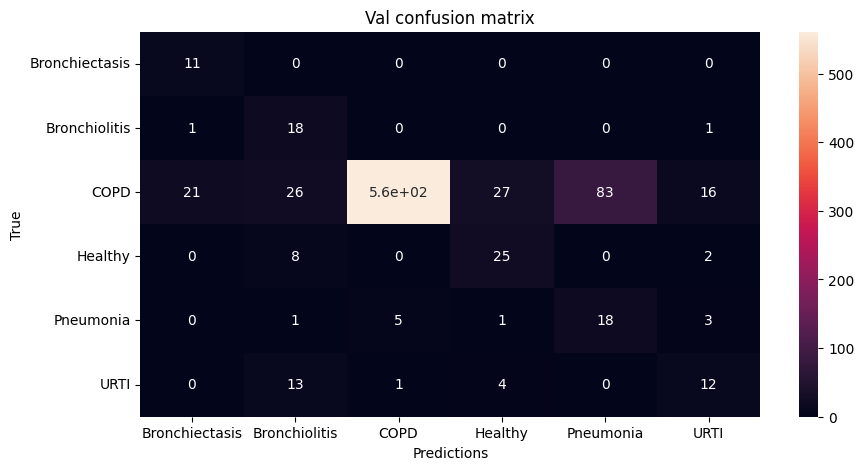


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 17:

Train Accuracy: 0.7774534161490684

Train Loss: 0.587457820680571

Train F1 Score: 0.7496181661668031

Val Accuracy: 0.7537393162393163
\Val Loss: 0.5794530742698245

Val F1 Score: 0.4935322453578313




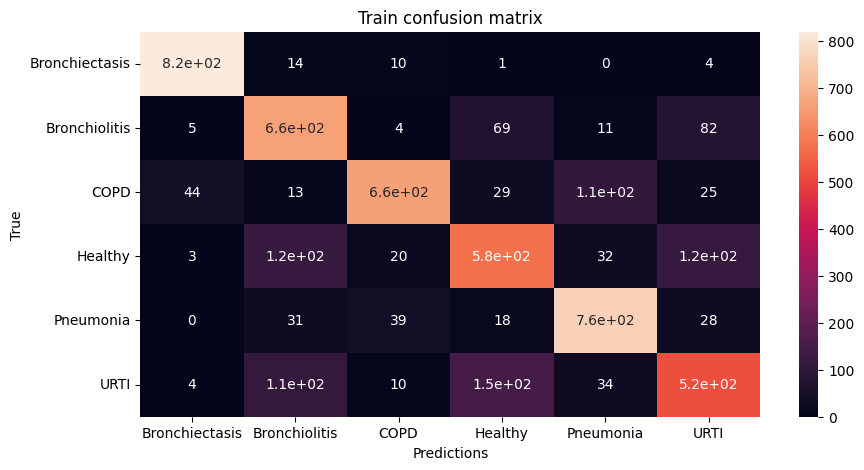

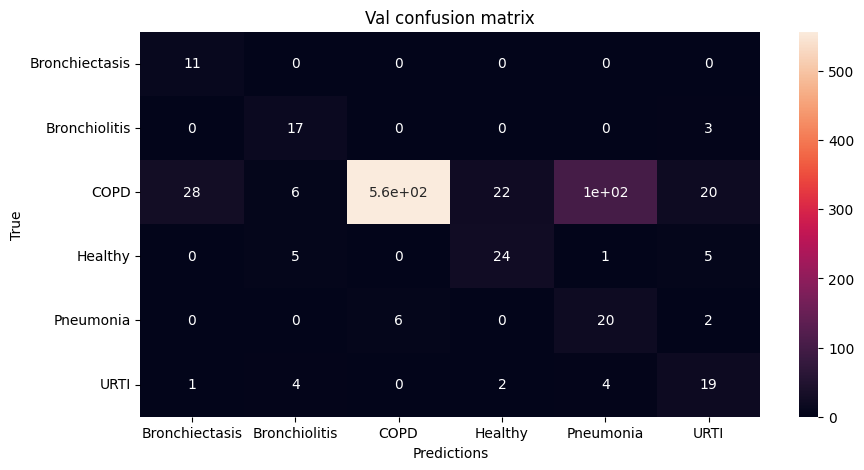


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 18:

Train Accuracy: 0.796863354037267

Train Loss: 0.5290896324267299

Train F1 Score: 0.7824310279040603

Val Accuracy: 0.7949608262108262
\Val Loss: 0.5206089439215483

Val F1 Score: 0.48008045112645187




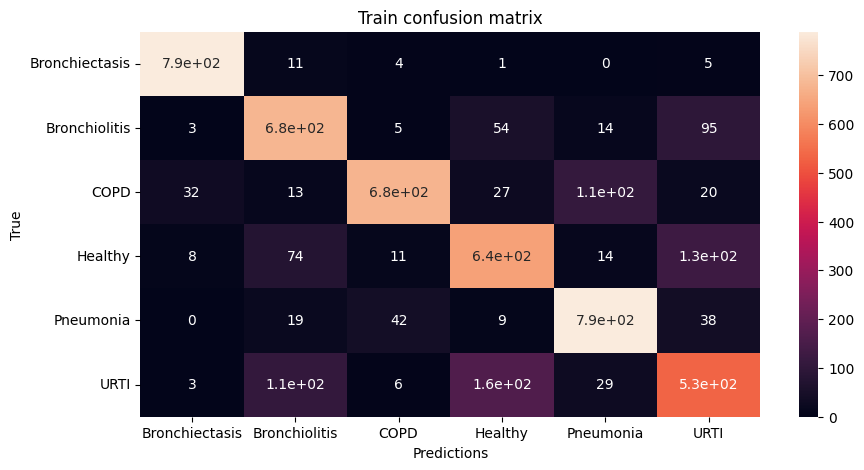

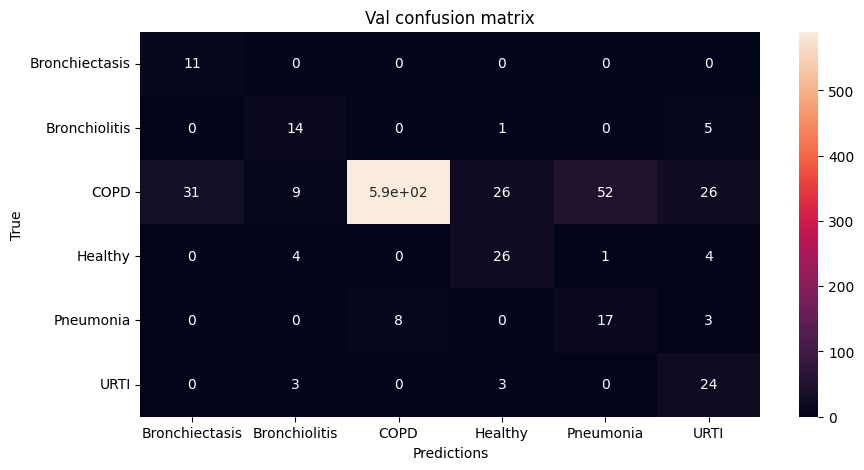


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 19:

Train Accuracy: 0.785582298136646

Train Loss: 0.554779917557047

Train F1 Score: 0.7672013396061725

Val Accuracy: 0.8076923076923076
\Val Loss: 0.5567085163460838

Val F1 Score: 0.5151502854294248




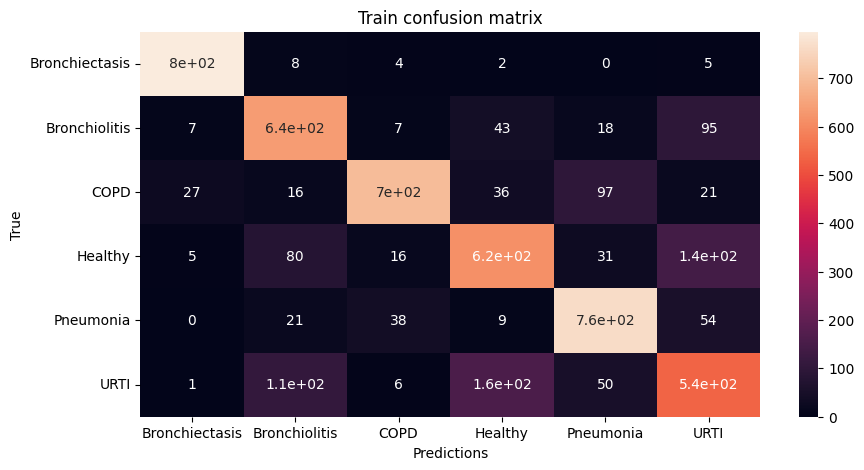

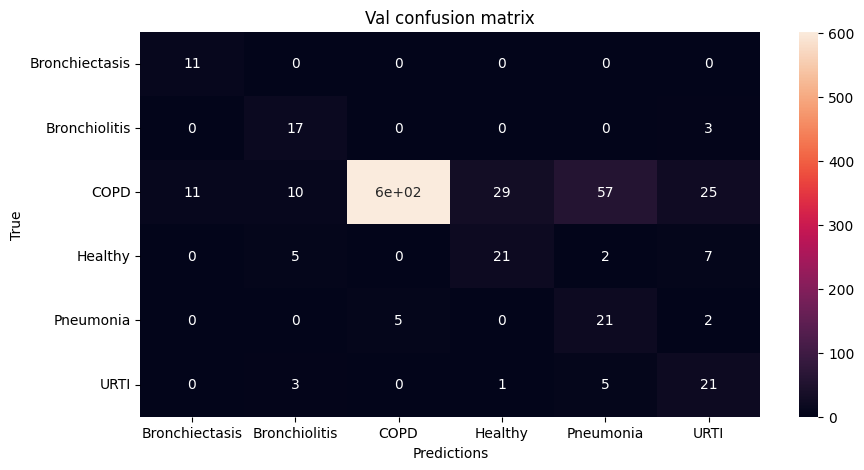


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 20:

Train Accuracy: 0.8210170807453416

Train Loss: 0.477530654450381

Train F1 Score: 0.8054766203305737

Val Accuracy: 0.8236289173789174
\Val Loss: 0.45405729446146226

Val F1 Score: 0.5409208839690244




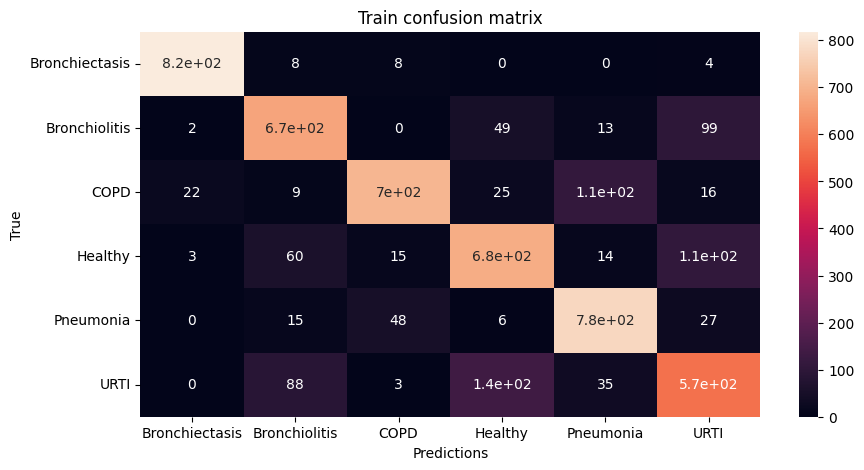

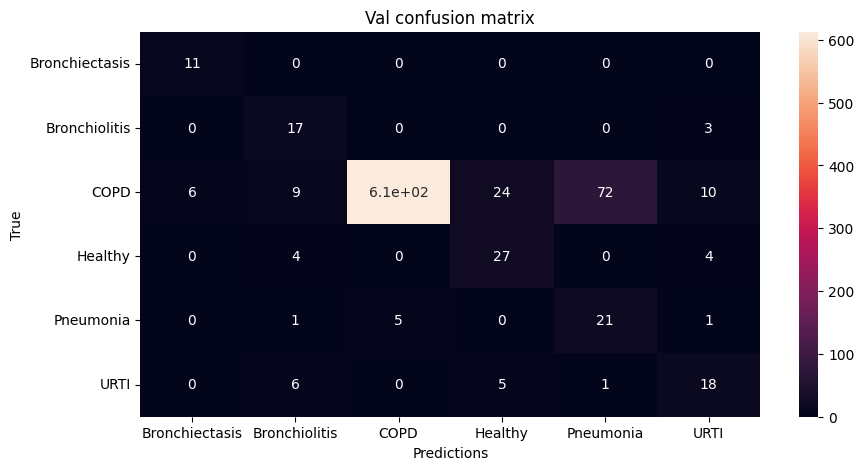


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 21:

Train Accuracy: 0.8079658385093168

Train Loss: 0.4984872586423566

Train F1 Score: 0.7934535018035344

Val Accuracy: 0.7946937321937322
\Val Loss: 0.5225288923139926

Val F1 Score: 0.5494800066506421




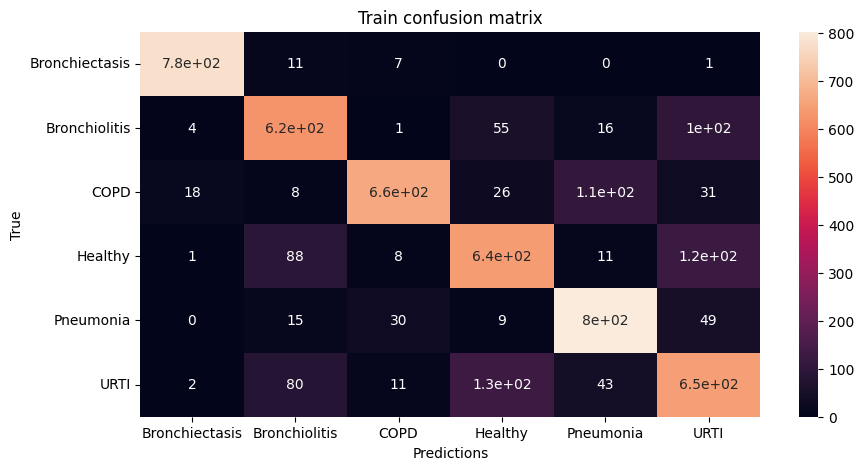

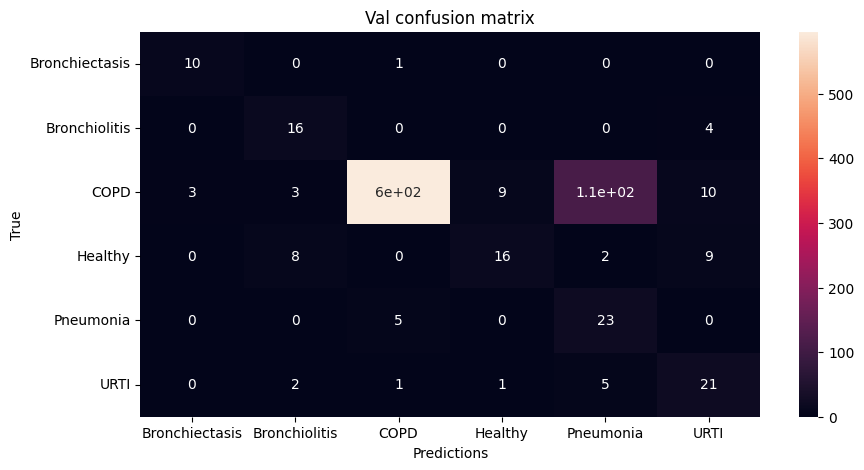


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 22:

Train Accuracy: 0.83

Train Loss: 0.4626808592251369

Train F1 Score: 0.815676404452472

Val Accuracy: 0.8246972934472935
\Val Loss: 0.5301662059845748

Val F1 Score: 0.5344093640645345




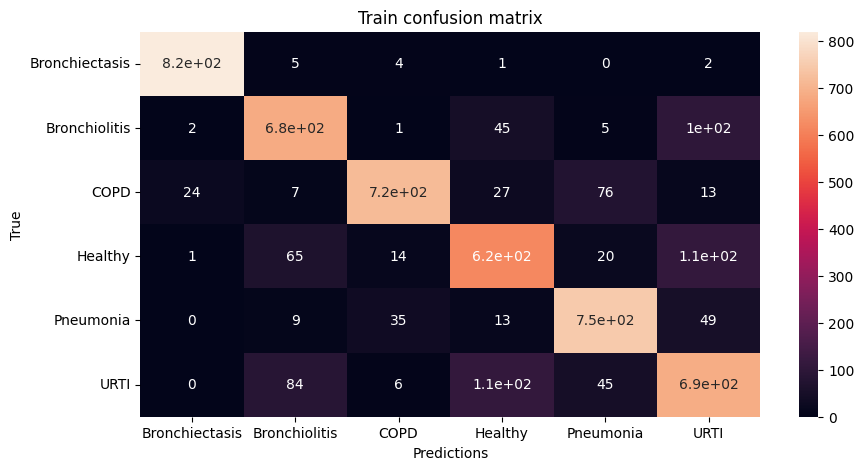

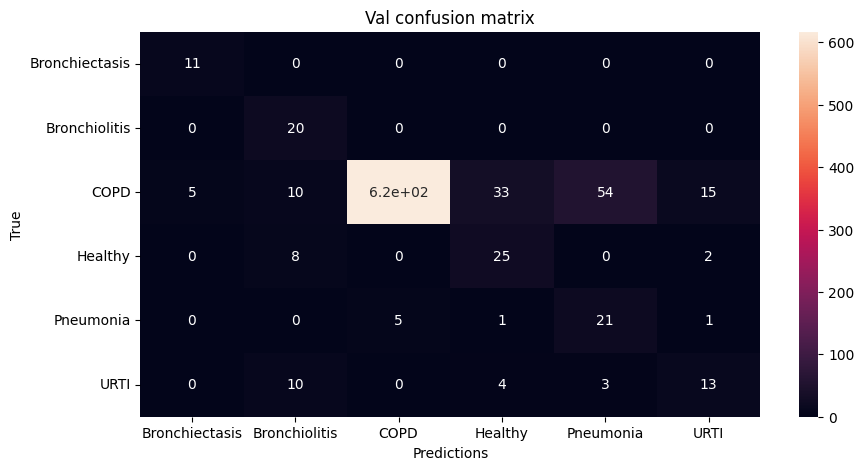


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 23:

Train Accuracy: 0.8257298136645962

Train Loss: 0.4786720750679881

Train F1 Score: 0.8113017837453332

Val Accuracy: 0.8776709401709402
\Val Loss: 0.4070886759846299

Val F1 Score: 0.6220437188943228




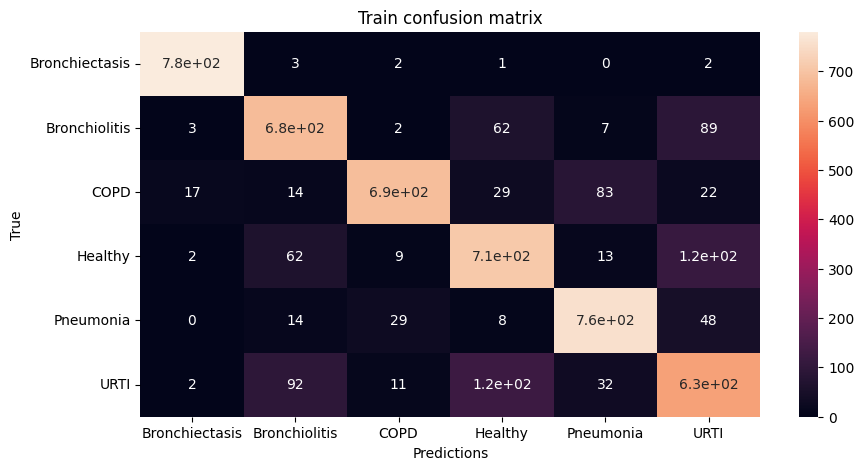

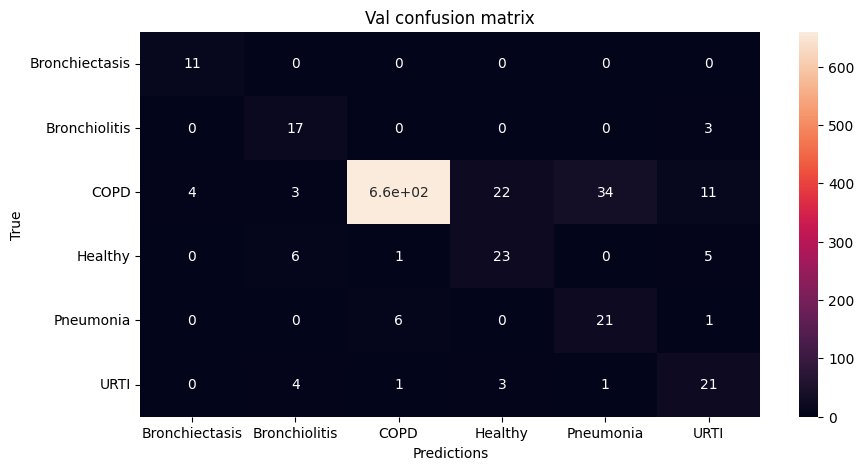


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 24:

Train Accuracy: 0.8459704968944098

Train Loss: 0.42662706332547323

Train F1 Score: 0.8350652293388888

Val Accuracy: 0.8598646723646723
\Val Loss: 0.4300175612723386

Val F1 Score: 0.6455971245412473




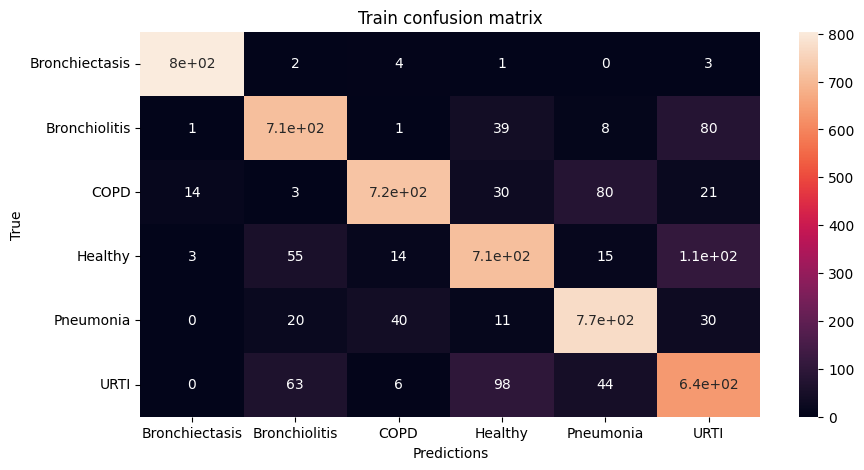

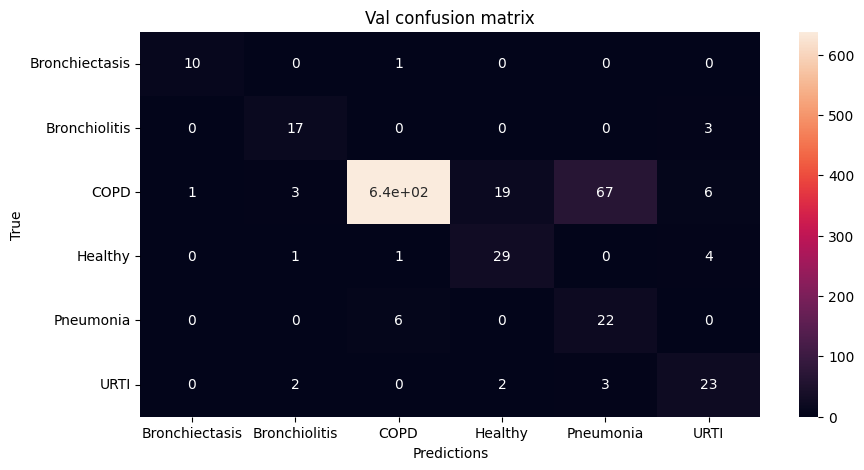


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 25:

Train Accuracy: 0.8589751552795031

Train Loss: 0.37173069180538937

Train F1 Score: 0.8452252756734813

Val Accuracy: 0.8631588319088318
\Val Loss: 0.43029897273690615

Val F1 Score: 0.6050869243012534




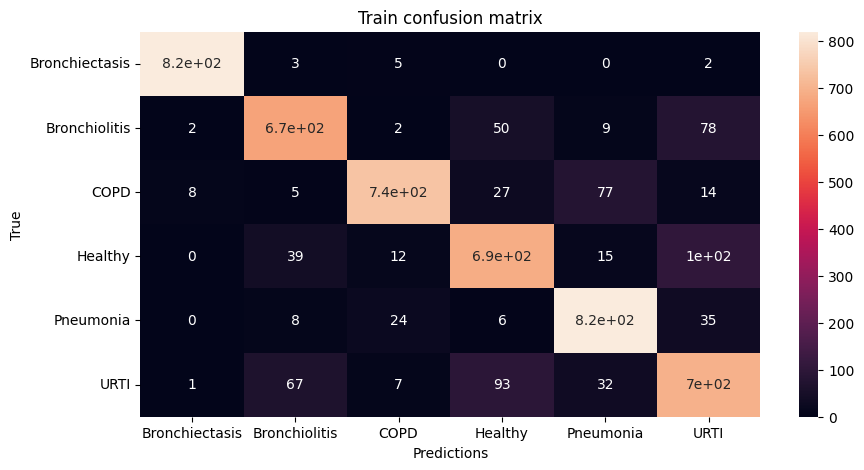

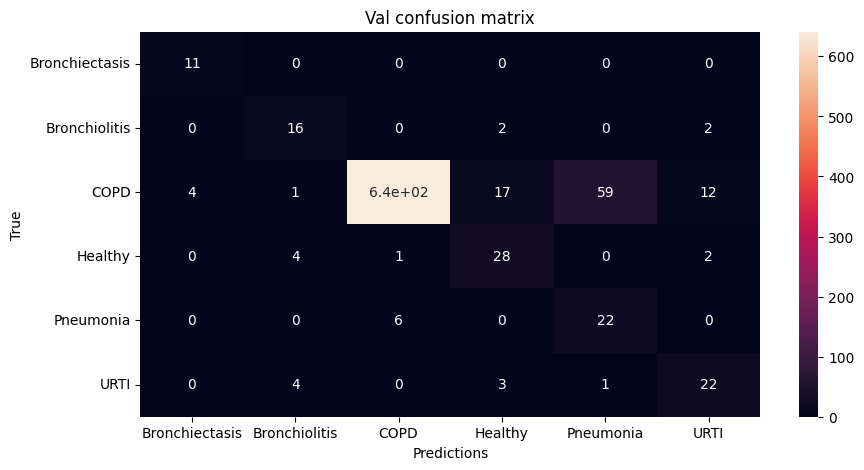


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 26:

Train Accuracy: 0.8552329192546584

Train Loss: 0.39522002827121605

Train F1 Score: 0.842469752945515

Val Accuracy: 0.8897792022792023
\Val Loss: 0.3826488446858194

Val F1 Score: 0.6692020297050476




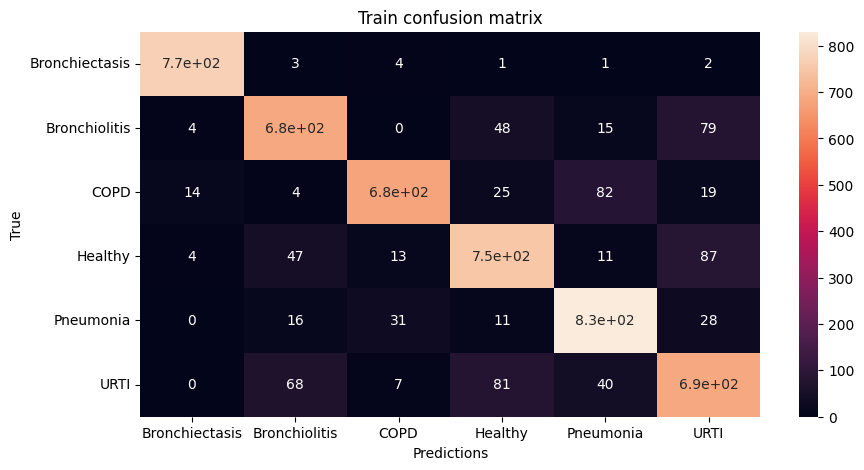

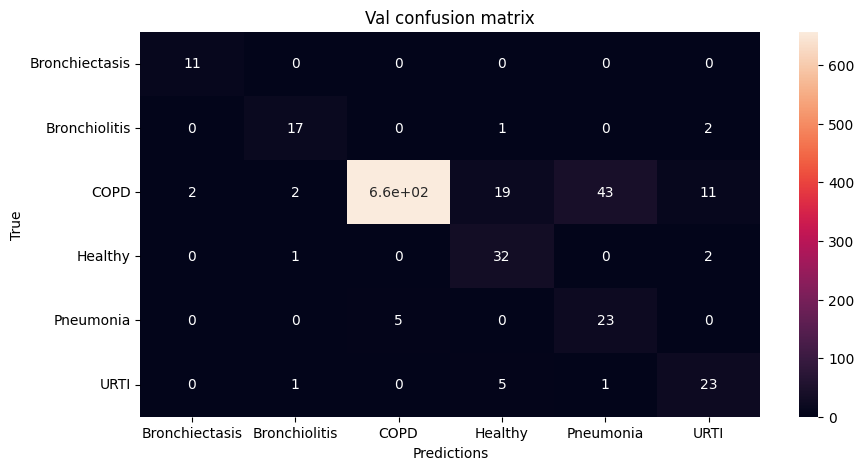


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 27:

Train Accuracy: 0.8616925465838509

Train Loss: 0.3778952536005411

Train F1 Score: 0.8501287136018646

Val Accuracy: 0.8782941595441595
\Val Loss: 0.3805323599113358

Val F1 Score: 0.5936780682316533




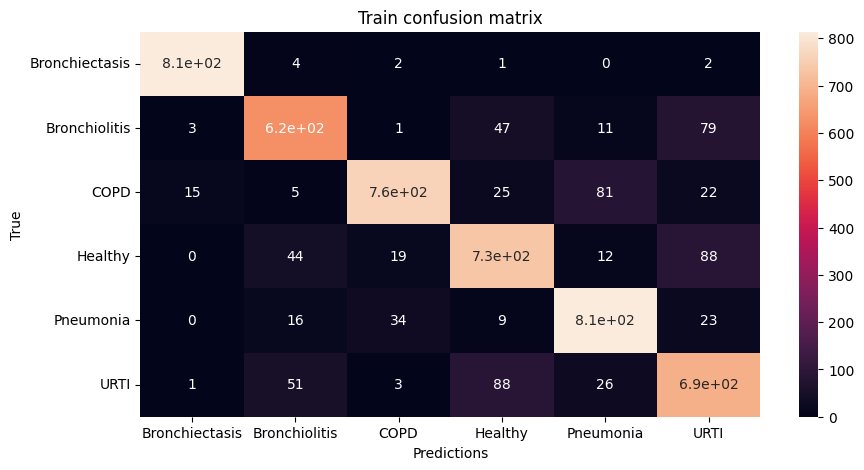

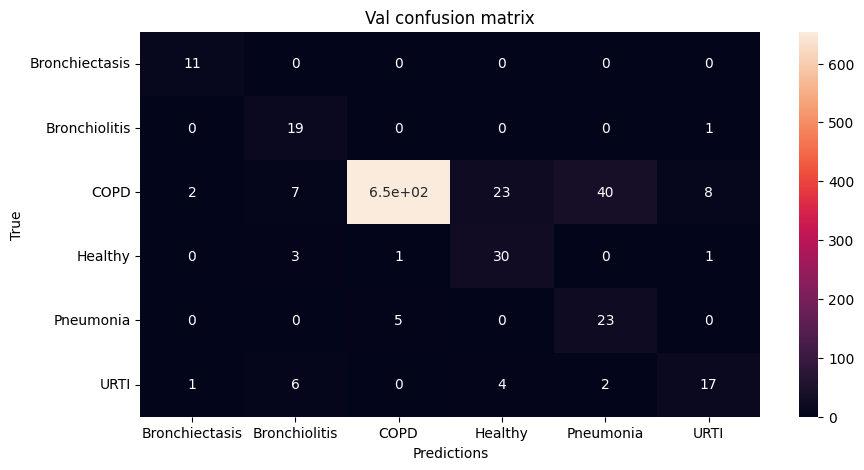


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 28:

Train Accuracy: 0.8741459627329193

Train Loss: 0.3471185957885677

Train F1 Score: 0.8594114406508688

Val Accuracy: 0.8898682336182335
\Val Loss: 0.35962050518503896

Val F1 Score: 0.665225632764675




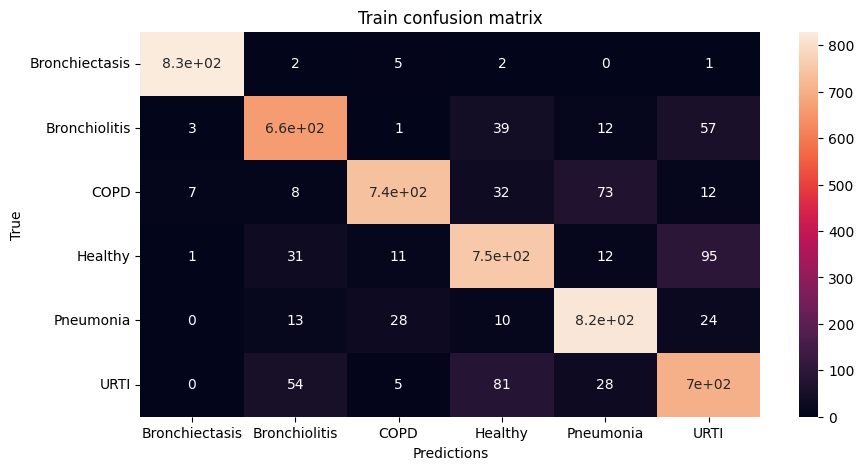

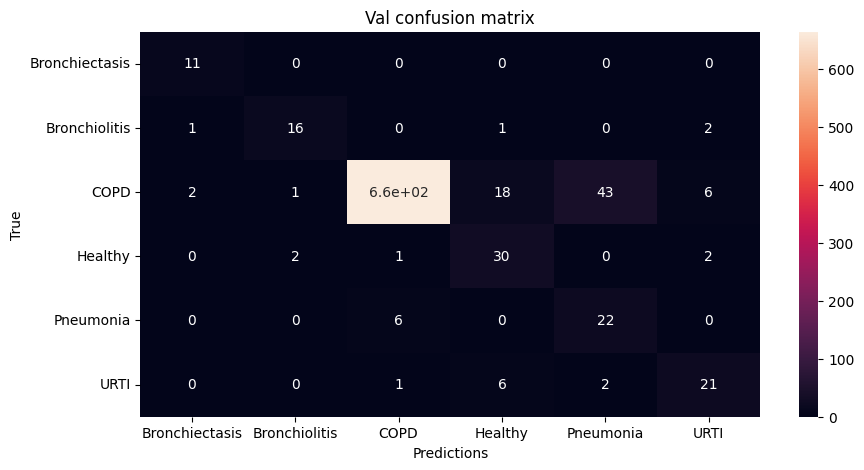


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 29:

Train Accuracy: 0.8684860248447204

Train Loss: 0.368634046466084

Train F1 Score: 0.8585640965781597

Val Accuracy: 0.8887108262108262
\Val Loss: 0.354553387120918

Val F1 Score: 0.6290138109966561




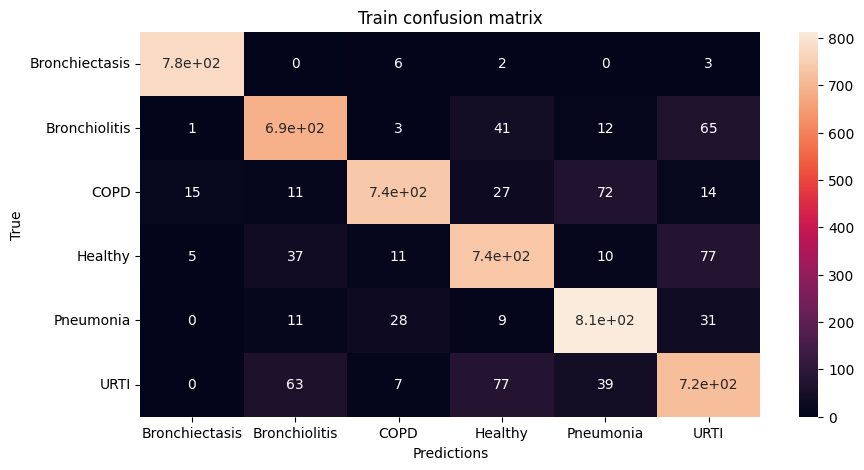

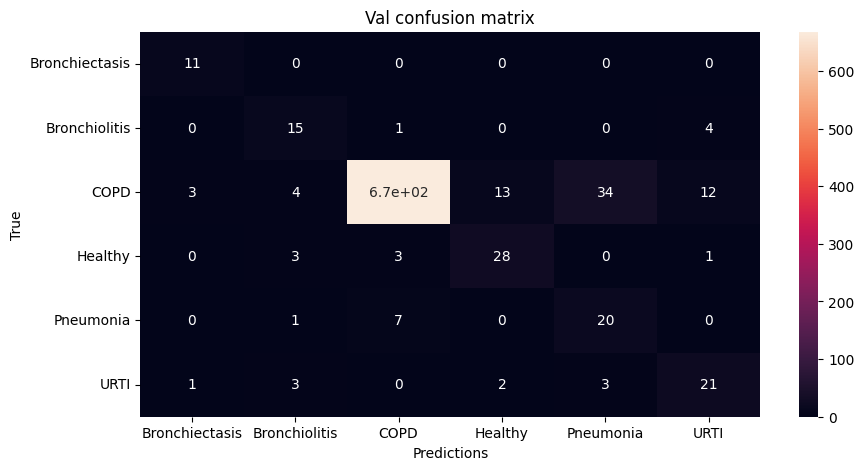


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 30:

Train Accuracy: 0.8644953416149068

Train Loss: 0.37839648872613907

Train F1 Score: 0.8536946621740827

Val Accuracy: 0.8704594017094017
\Val Loss: 0.4069627255753235

Val F1 Score: 0.6476947941161968




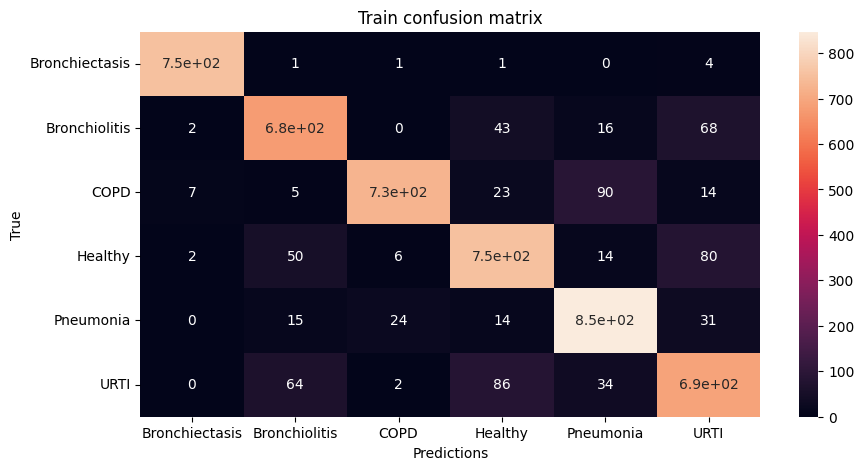

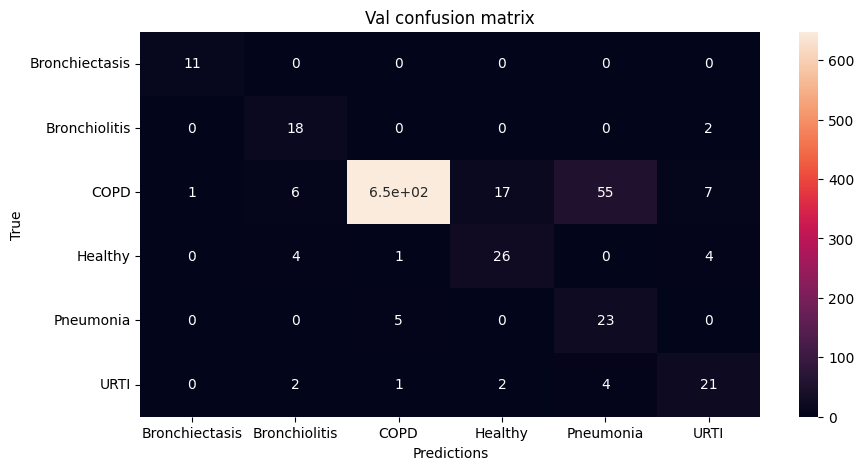


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 31:

Train Accuracy: 0.8740605590062112

Train Loss: 0.3565927202472035

Train F1 Score: 0.8641637397108611

Val Accuracy: 0.8816773504273504
\Val Loss: 0.35879724859087553

Val F1 Score: 0.6463886951958692




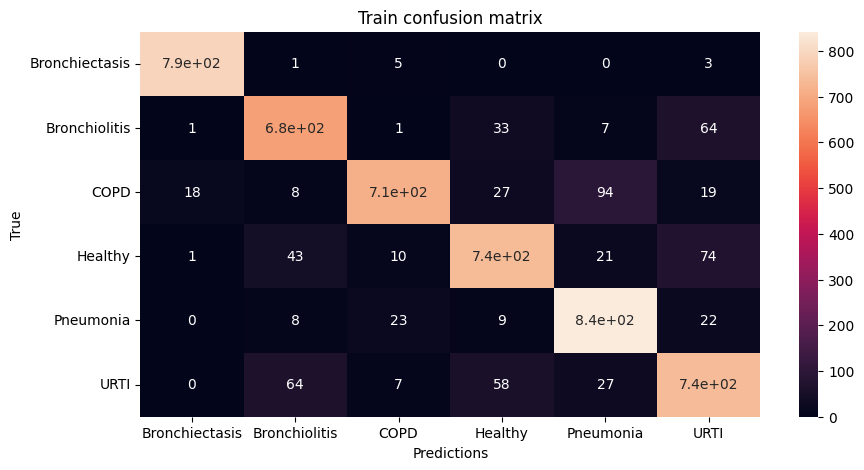

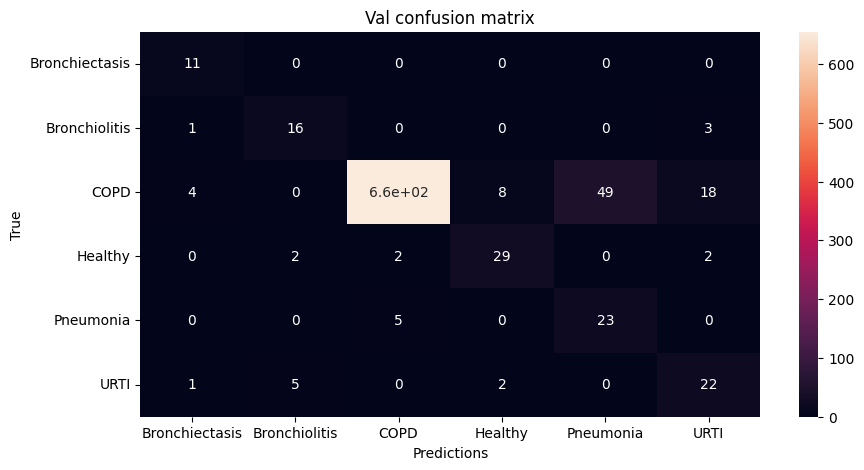


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 32:

Train Accuracy: 0.893082298136646

Train Loss: 0.31219118449443617

Train F1 Score: 0.8852749559449853

Val Accuracy: 0.79122150997151
\Val Loss: 0.5215112771149035

Val F1 Score: 0.5958944150695095




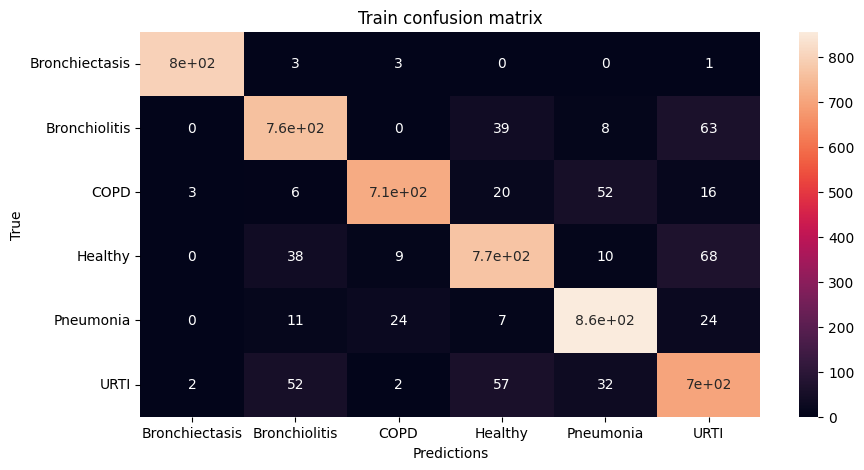

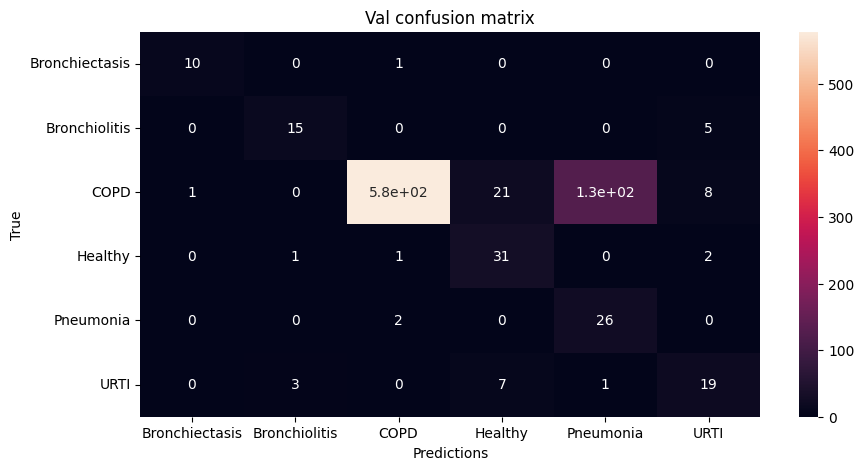


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 33:

Train Accuracy: 0.8966304347826086

Train Loss: 0.2987428973457828

Train F1 Score: 0.8839746410061854

Val Accuracy: 0.892094017094017
\Val Loss: 0.3270011891921361

Val F1 Score: 0.6839268295853226




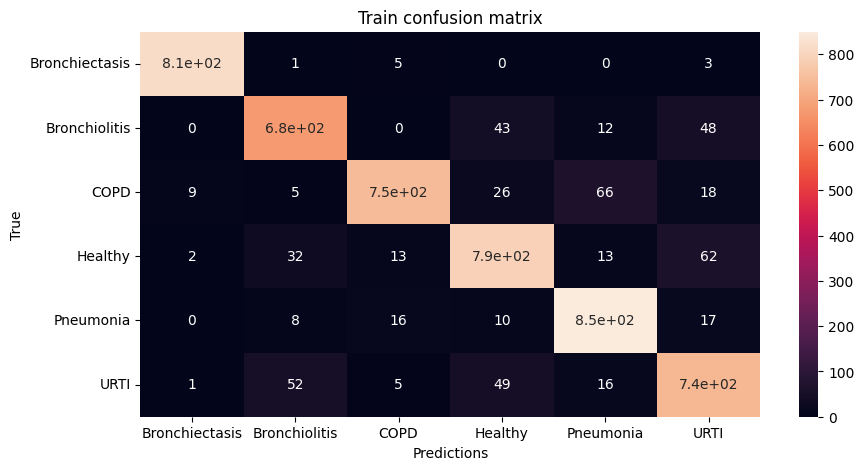

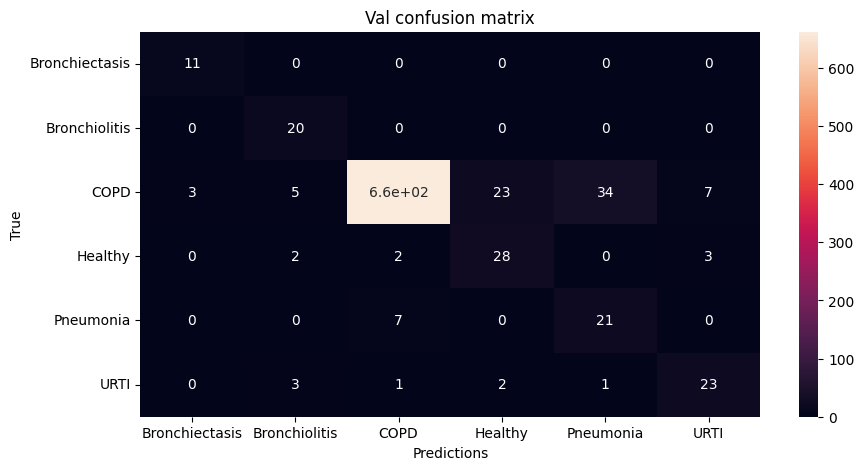


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 34:

Train Accuracy: 0.892414596273292

Train Loss: 0.3096234636925022

Train F1 Score: 0.8816519024209206

Val Accuracy: 0.8447293447293447
\Val Loss: 0.39716273159892473

Val F1 Score: 0.5974294046560923




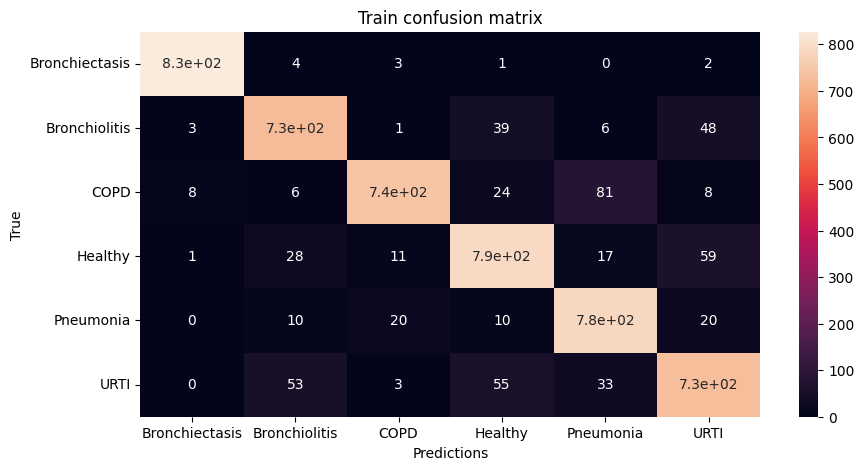

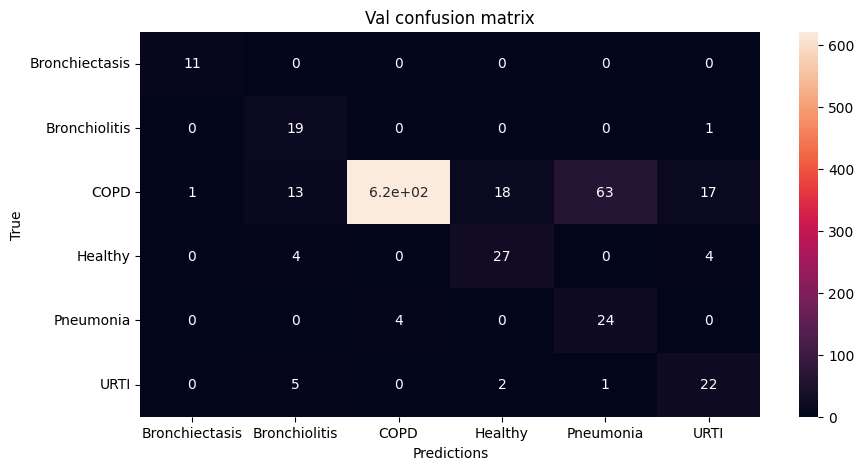


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 35:

Train Accuracy: 0.9199223602484471

Train Loss: 0.24044568690916765

Train F1 Score: 0.9127991932519475

Val Accuracy: 0.8942307692307693
\Val Loss: 0.31159416806918605

Val F1 Score: 0.666646894481447




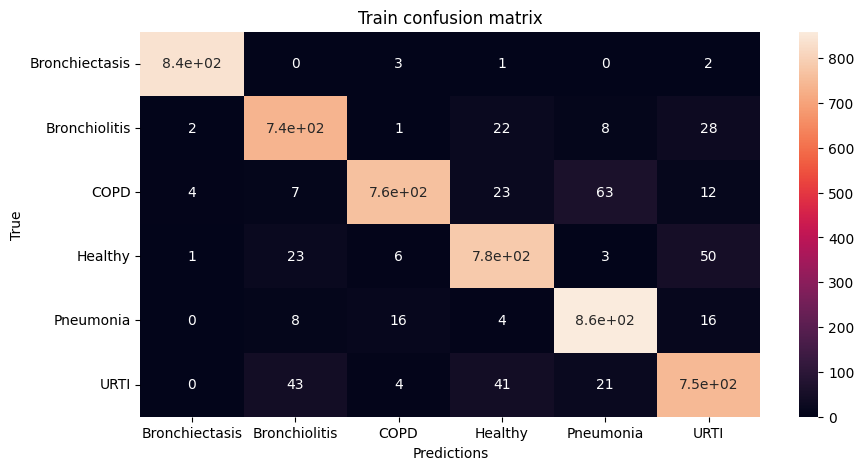

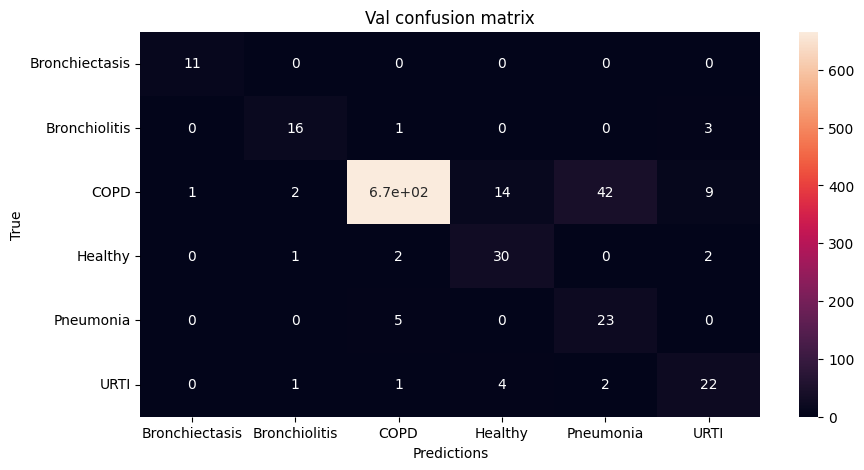


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 36:

Train Accuracy: 0.8999301242236024

Train Loss: 0.294709852520631

Train F1 Score: 0.891778079989534

Val Accuracy: 0.8863960113960113
\Val Loss: 0.37061108345234833

Val F1 Score: 0.6708740018032215




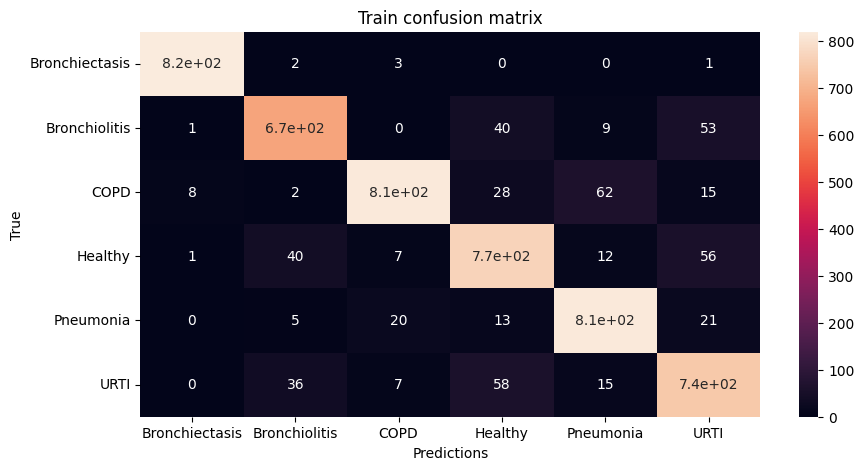

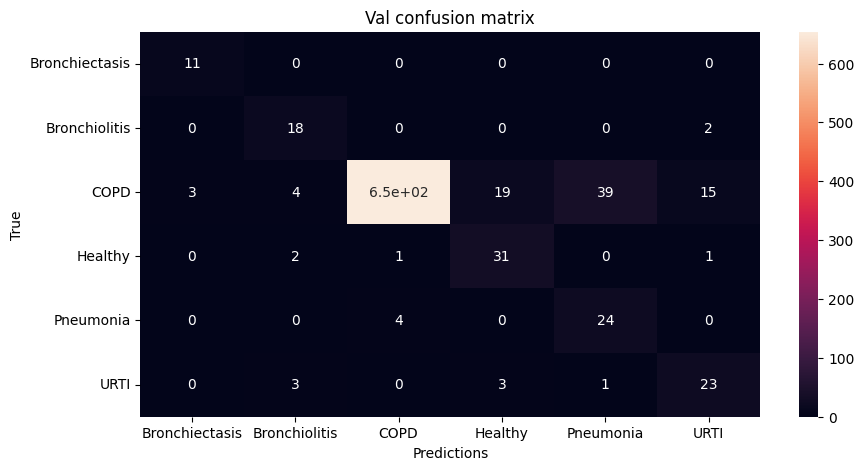


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 37:

Train Accuracy: 0.9080279503105589

Train Loss: 0.26436543691417447

Train F1 Score: 0.8990905251562226

Val Accuracy: 0.8721509971509972
\Val Loss: 0.3933811888650612

Val F1 Score: 0.6525269095544461




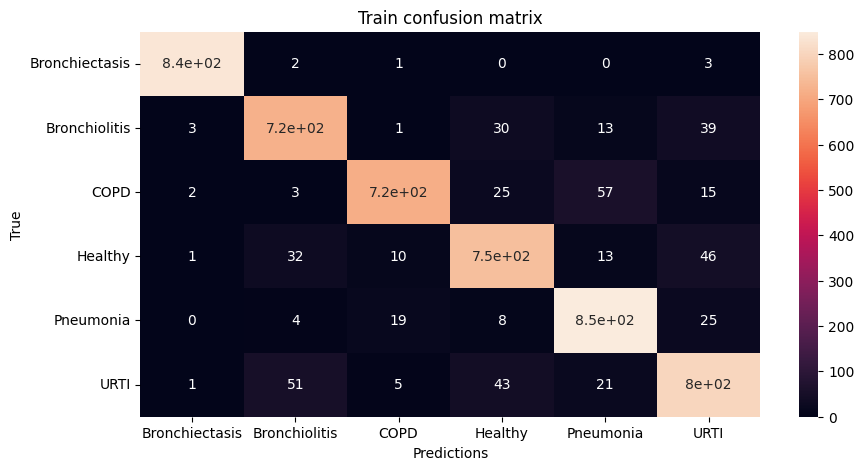

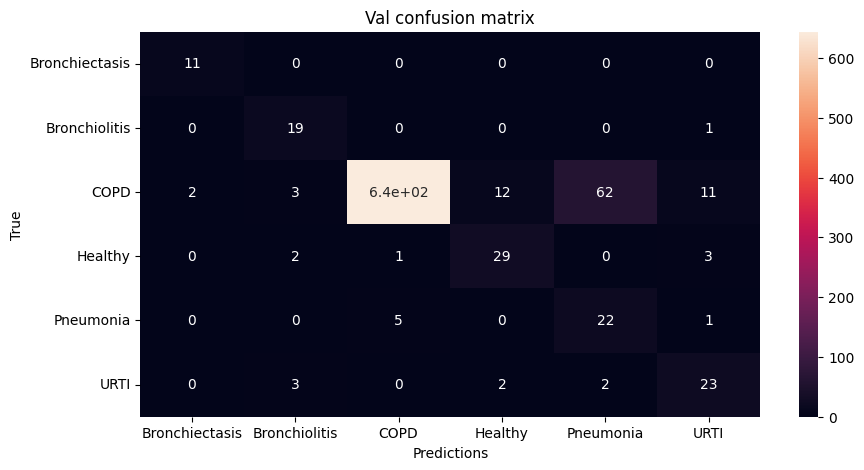


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 38:

Train Accuracy: 0.9130745341614906

Train Loss: 0.2639633788501624

Train F1 Score: 0.9082075635098522

Val Accuracy: 0.9086538461538461
\Val Loss: 0.3553726859304502

Val F1 Score: 0.7084600572232846




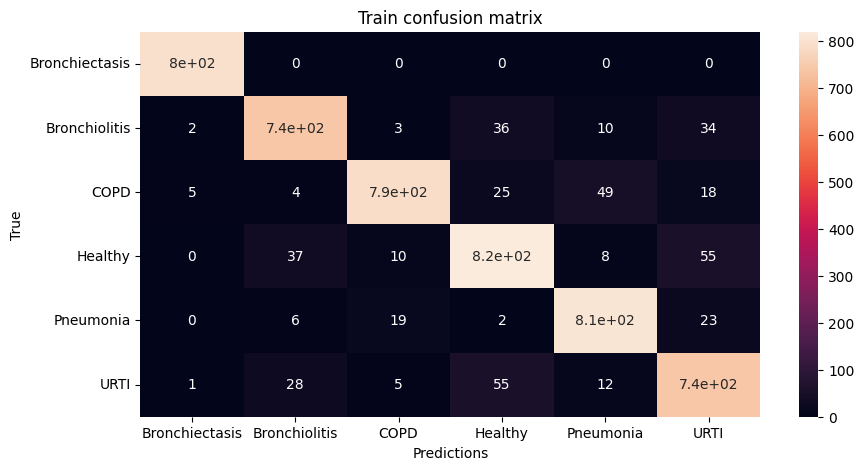

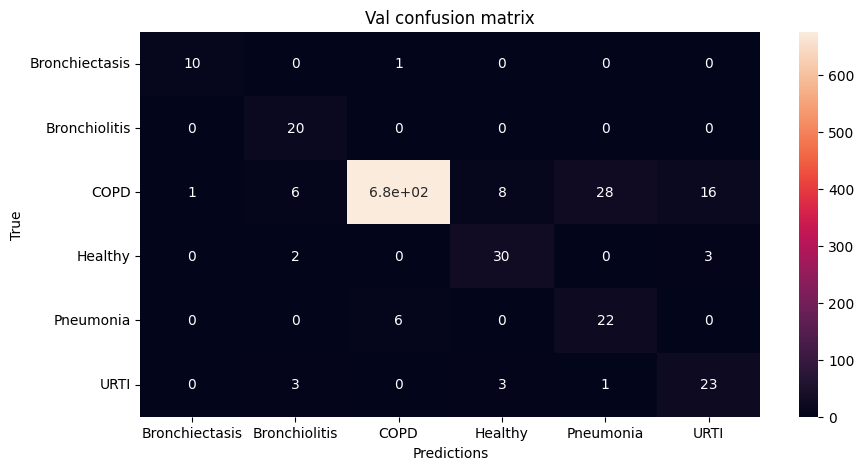


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 39:

Train Accuracy: 0.9114363354037267

Train Loss: 0.27176389595644074

Train F1 Score: 0.9022107975823539

Val Accuracy: 0.9036680911680911
\Val Loss: 0.3378988730686682

Val F1 Score: 0.7009965413146548




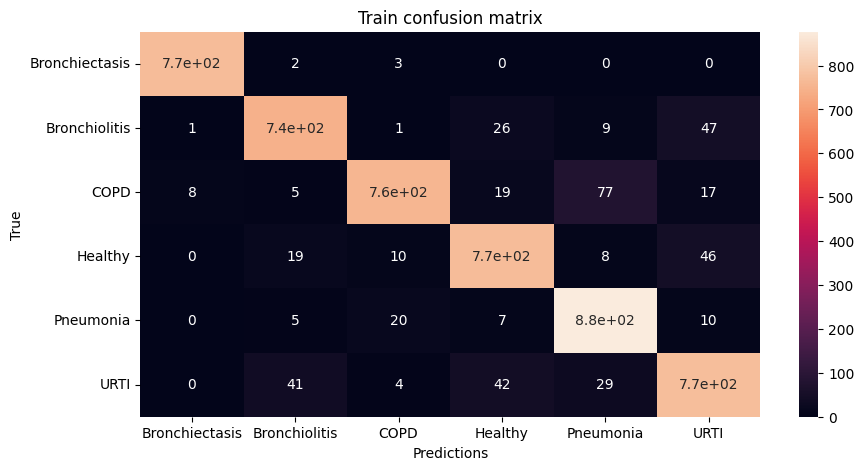

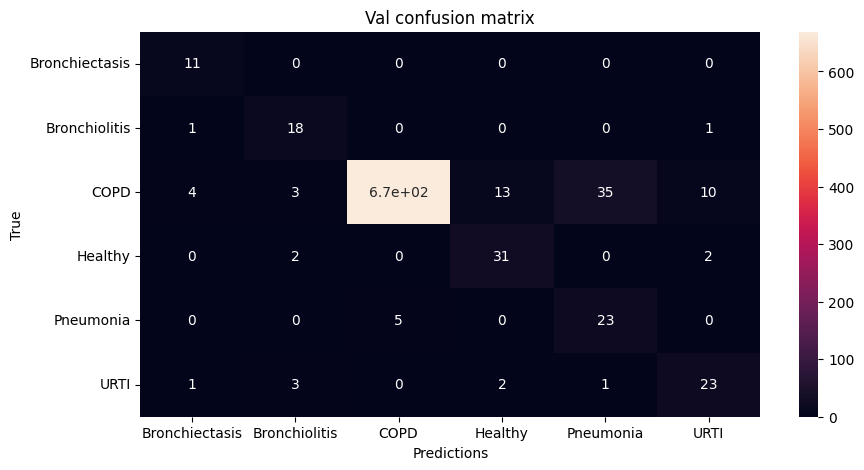


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 40:

Train Accuracy: 0.9160403726708074

Train Loss: 0.25733338680511675

Train F1 Score: 0.9076573226762854

Val Accuracy: 0.836894586894587
\Val Loss: 0.4952601144711177

Val F1 Score: 0.5780987474653456




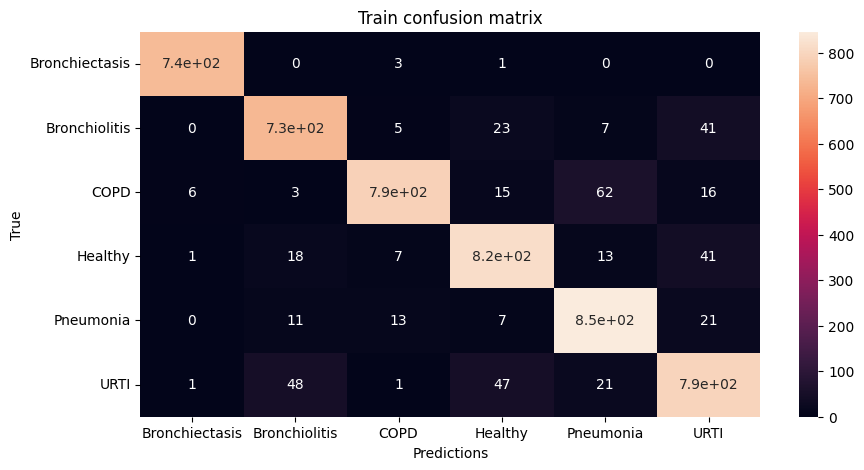

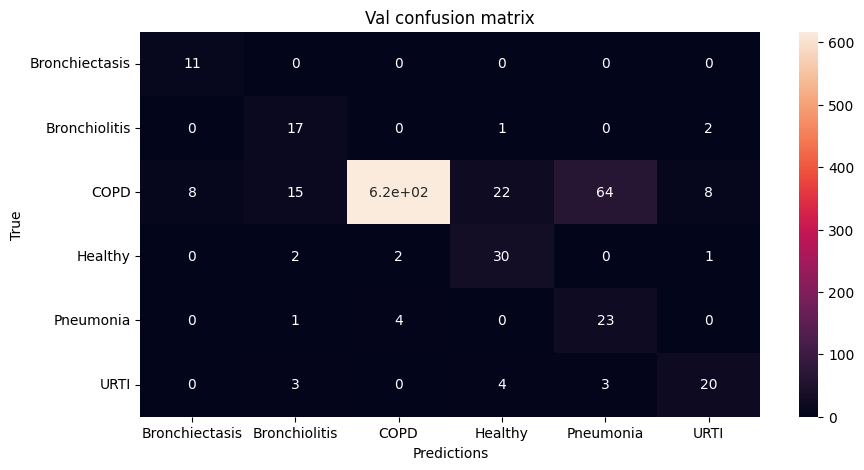


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 41:

Train Accuracy: 0.9163742236024844

Train Loss: 0.24080172377806272

Train F1 Score: 0.9077872863467435

Val Accuracy: 0.8793625356125355
\Val Loss: 0.40974902152083814

Val F1 Score: 0.636438399553299




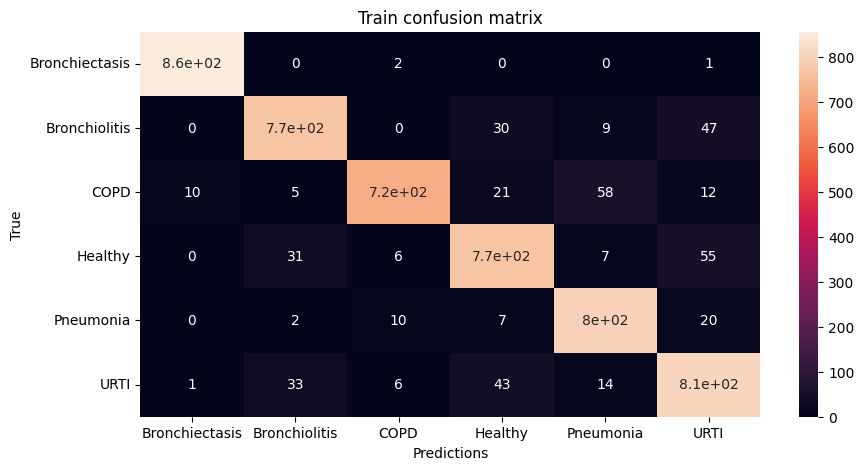

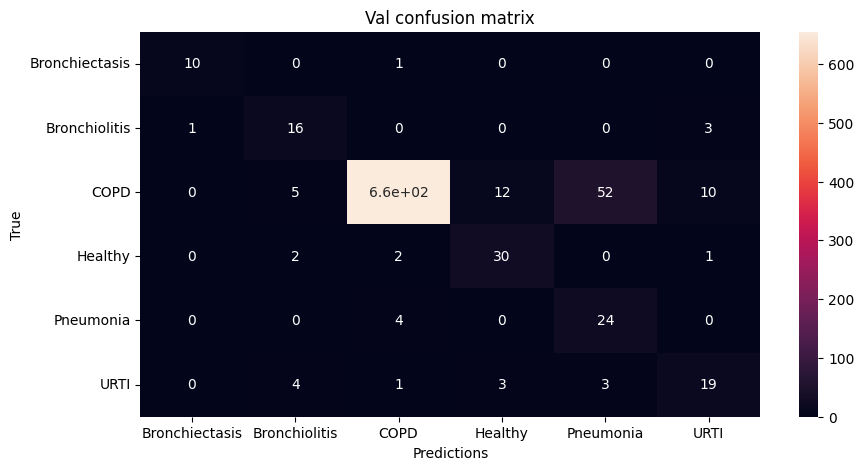


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 42:

Train Accuracy: 0.9034239130434781

Train Loss: 0.2845624514294337

Train F1 Score: 0.8884008456461178

Val Accuracy: 0.8794515669515669
\Val Loss: 0.3437598549105503

Val F1 Score: 0.6188065669050923




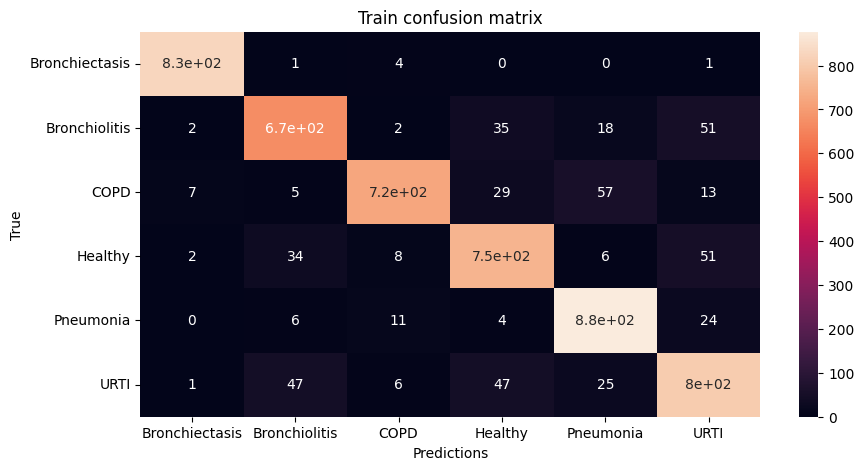

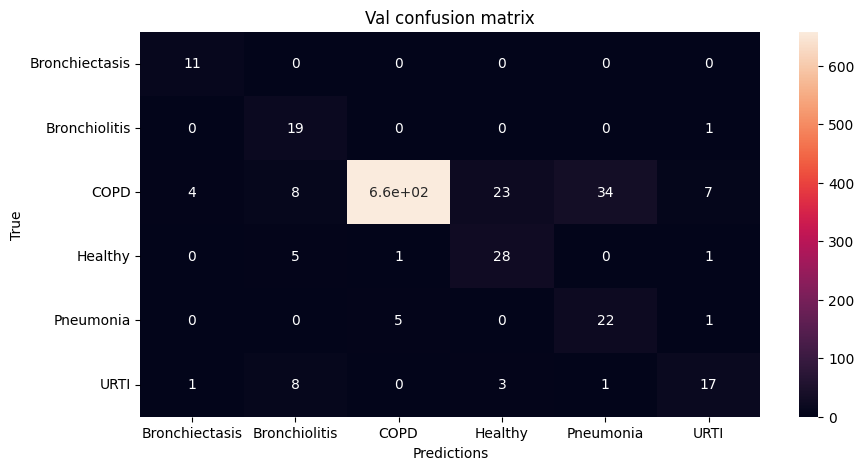


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 43:

Train Accuracy: 0.9186723602484472

Train Loss: 0.2390457153181482

Train F1 Score: 0.9082498054326691

Val Accuracy: 0.9131944444444444
\Val Loss: 0.3424864695579917

Val F1 Score: 0.6629826371316556




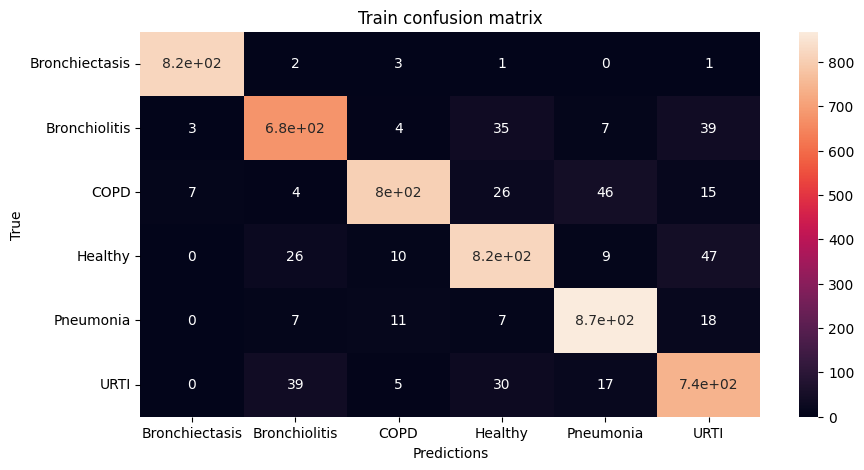

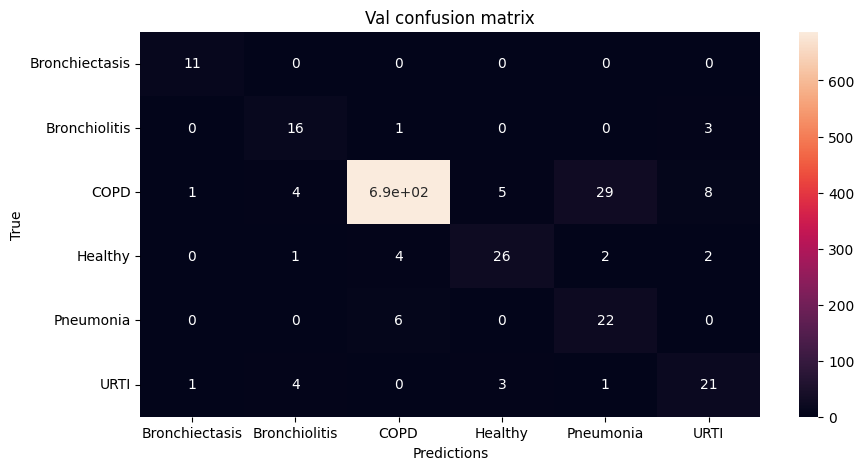


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 44:

Train Accuracy: 0.9117701863354036

Train Loss: 0.2687013523410196

Train F1 Score: 0.9019441434315273

Val Accuracy: 0.8672542735042734
\Val Loss: 0.3640399815307723

Val F1 Score: 0.5975418046668723




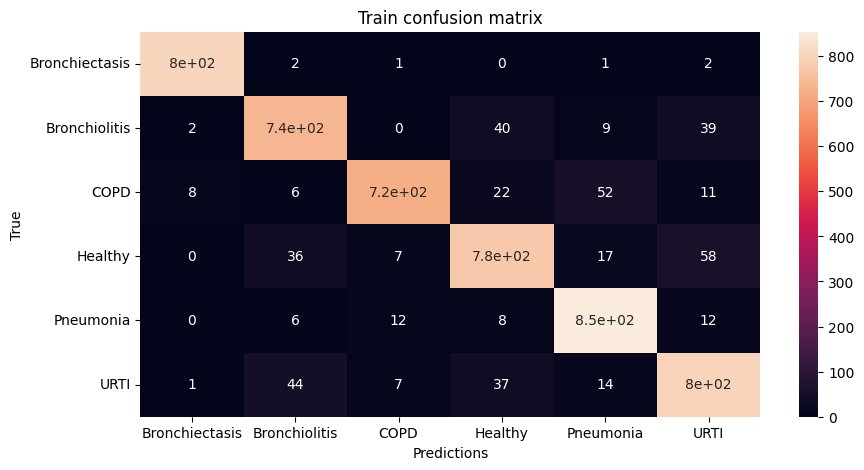

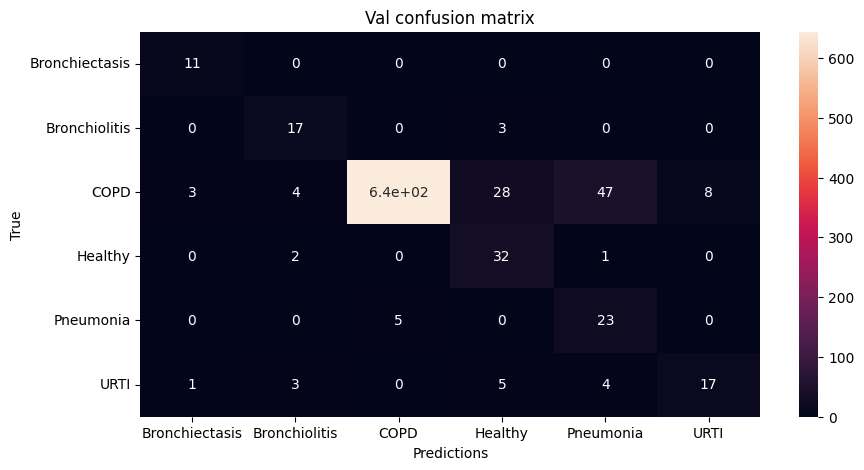


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 45:

Train Accuracy: 0.9307919254658384

Train Loss: 0.21694817630030352

Train F1 Score: 0.920929767700456

Val Accuracy: 0.8976139601139601
\Val Loss: 0.3402597479246281

Val F1 Score: 0.6656383750615297




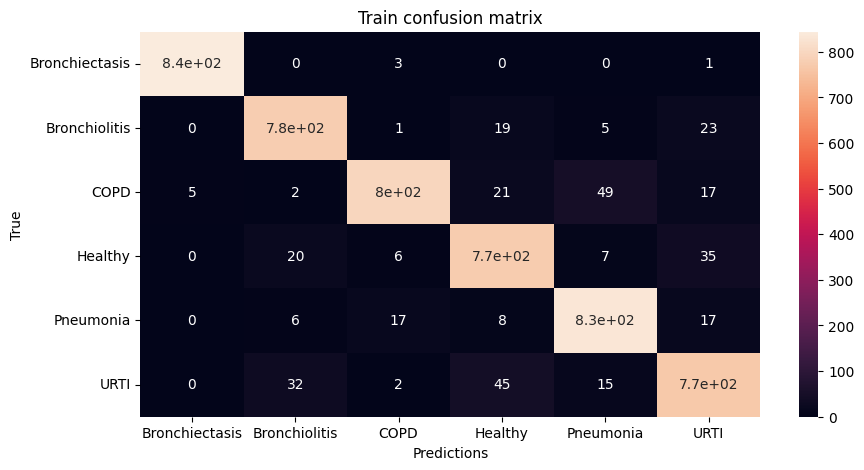

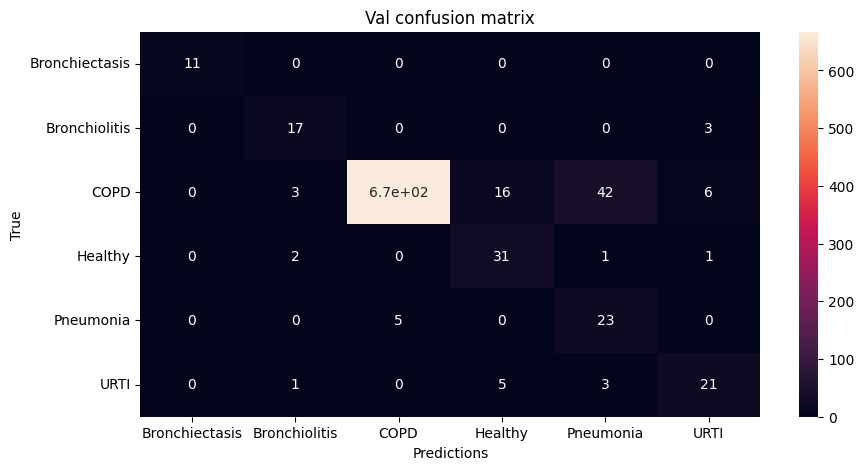


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 46:

Train Accuracy: 0.9366149068322981

Train Loss: 0.18953480989157412

Train F1 Score: 0.9314205035659837

Val Accuracy: 0.8854166666666666
\Val Loss: 0.41901547206496753

Val F1 Score: 0.6425079118322443




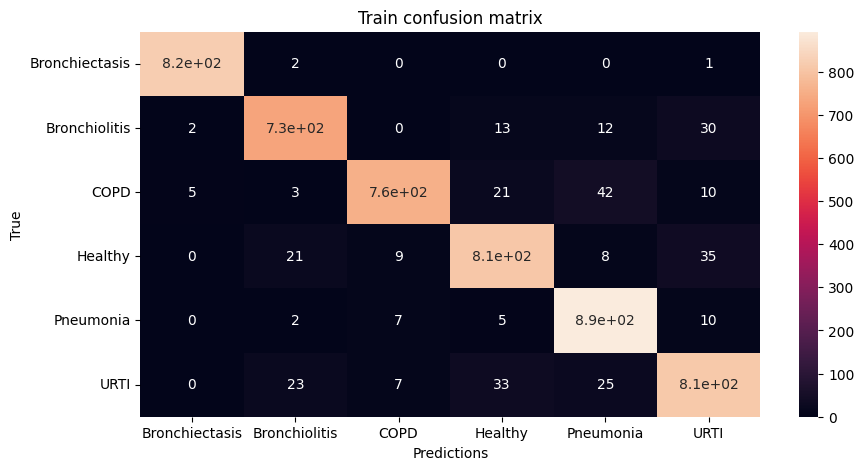

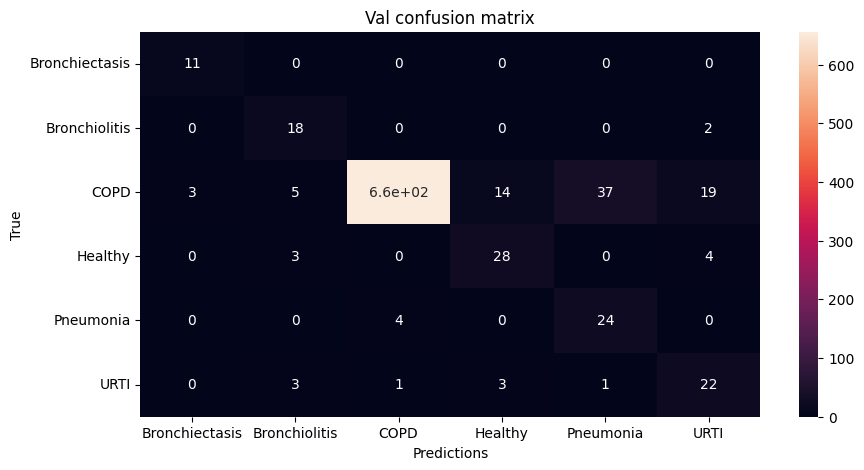


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 47:

Train Accuracy: 0.9223059006211181

Train Loss: 0.22452525644684615

Train F1 Score: 0.914877010058172

Val Accuracy: 0.8929843304843305
\Val Loss: 0.3454240301141032

Val F1 Score: 0.6722825268904368




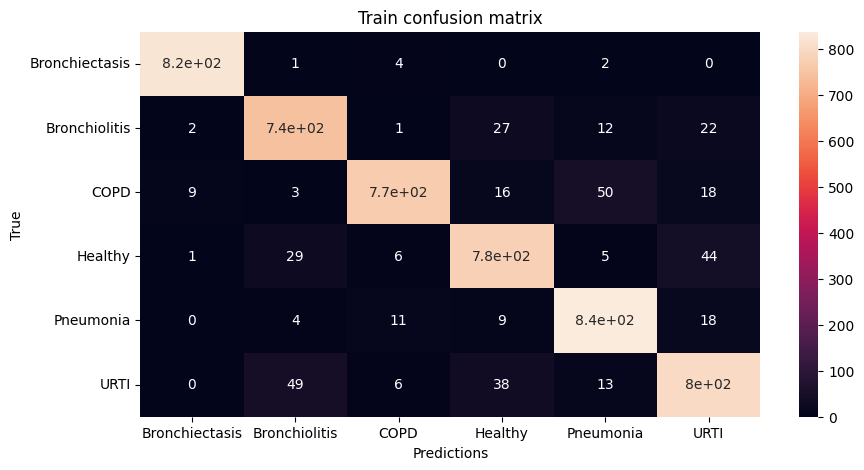

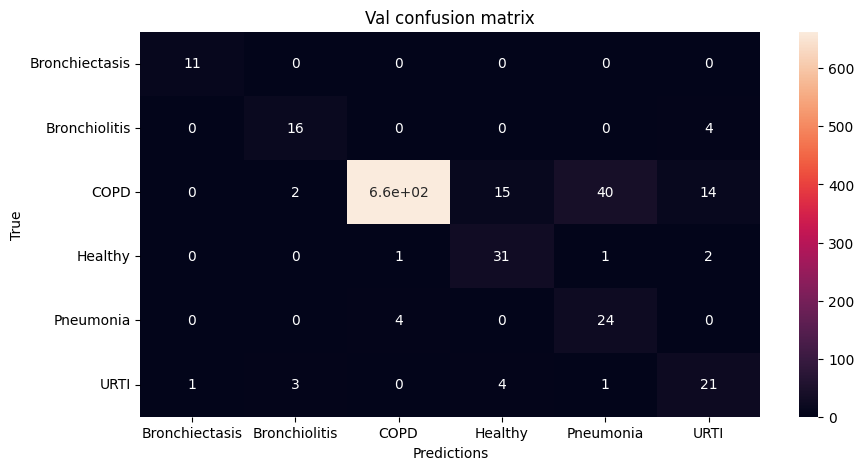


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 48:

Train Accuracy: 0.9330667701863353

Train Loss: 0.19214686713765683

Train F1 Score: 0.9268180305913368

Val Accuracy: 0.8955662393162392
\Val Loss: 0.34292919050764153

Val F1 Score: 0.6902508437633514




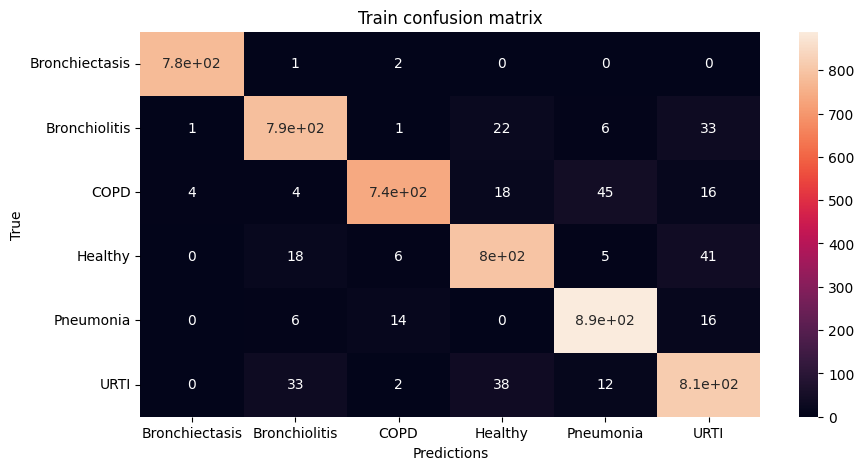

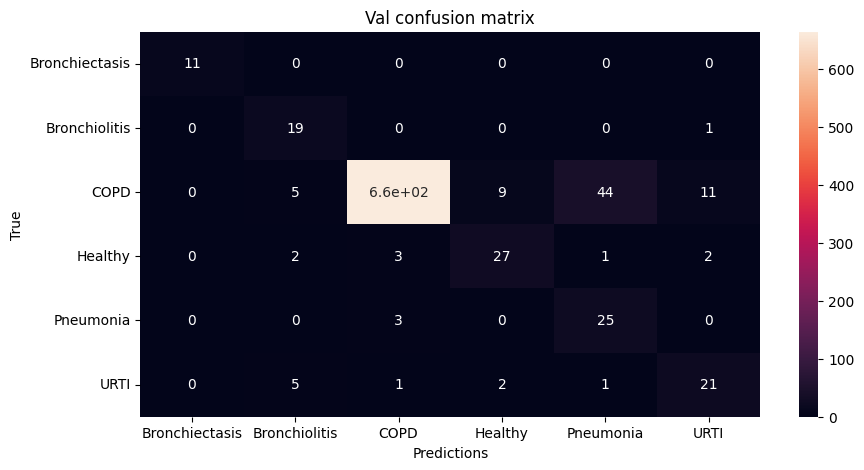


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 49:

Train Accuracy: 0.9333695652173913

Train Loss: 0.2081627907428127

Train F1 Score: 0.9281806316434967

Val Accuracy: 0.8924501424501424
\Val Loss: 0.37021990561926804

Val F1 Score: 0.6279864167725598




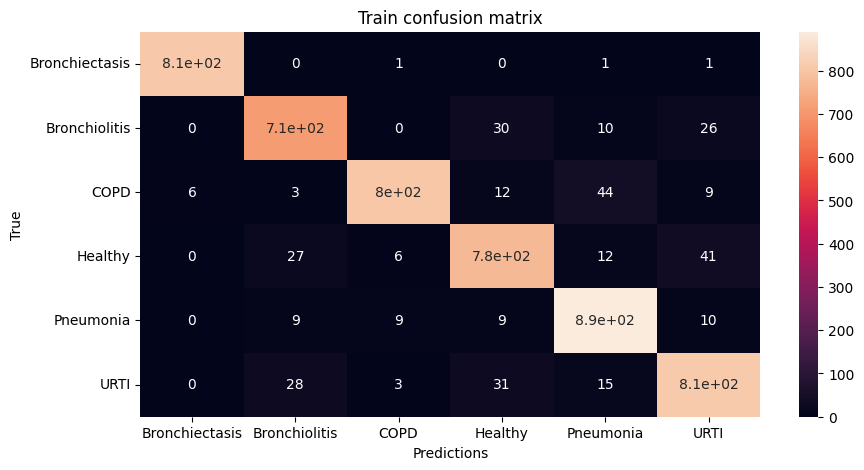

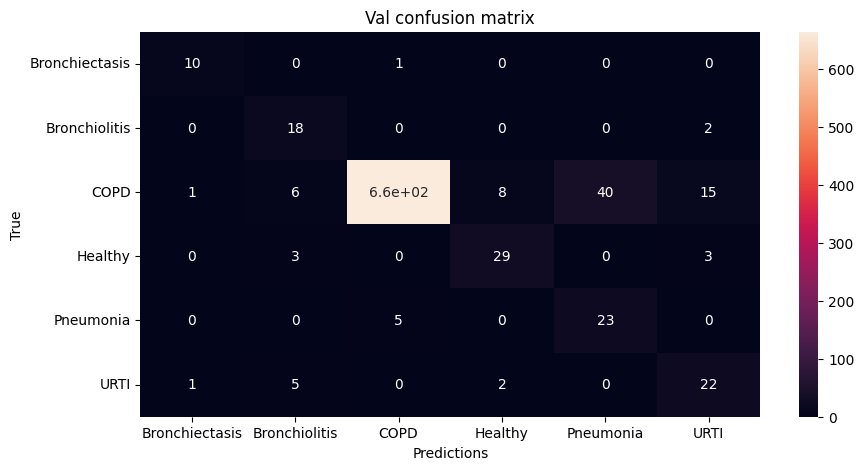


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 50:

Train Accuracy: 0.9407453416149069

Train Loss: 0.19427788478571065

Train F1 Score: 0.9366025084294147

Val Accuracy: 0.8745548433048433
\Val Loss: 0.49672526288432656

Val F1 Score: 0.6231251800501788




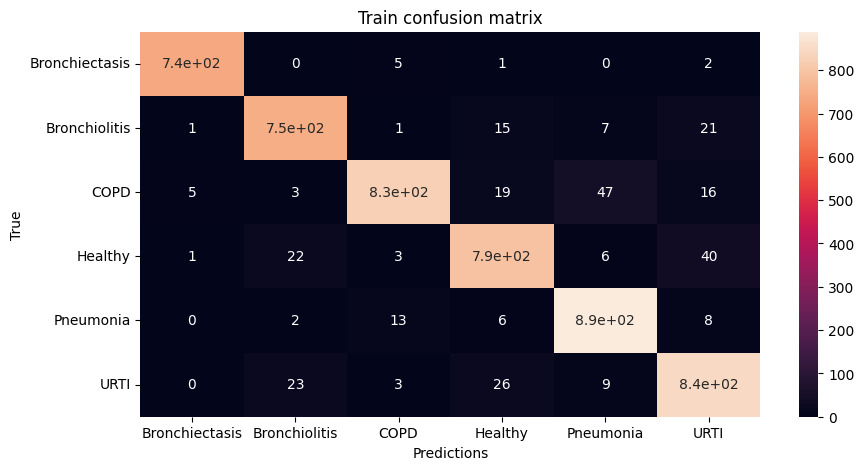

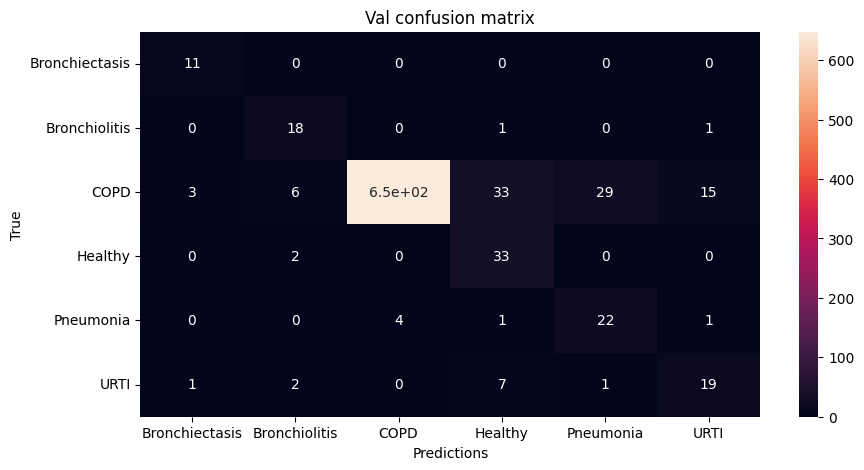


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 51:

Train Accuracy: 0.9369487577639751

Train Loss: 0.2054675471801195

Train F1 Score: 0.9276467150782947

Val Accuracy: 0.9113247863247863
\Val Loss: 0.31826673192834415

Val F1 Score: 0.6772294828185329




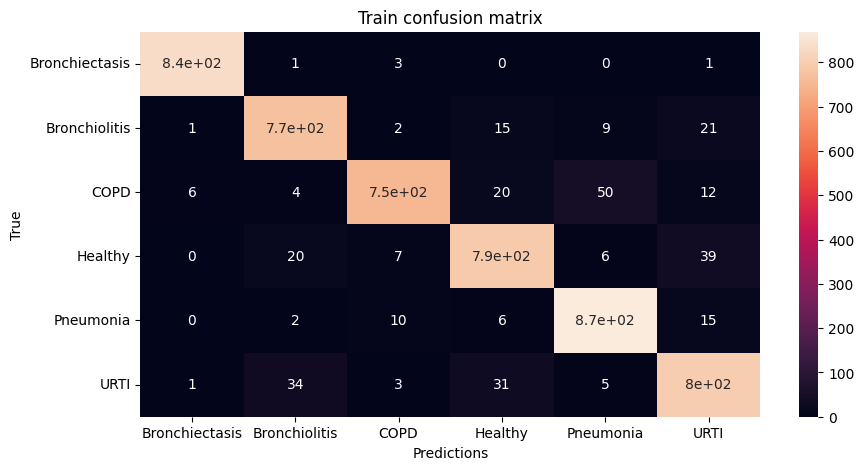

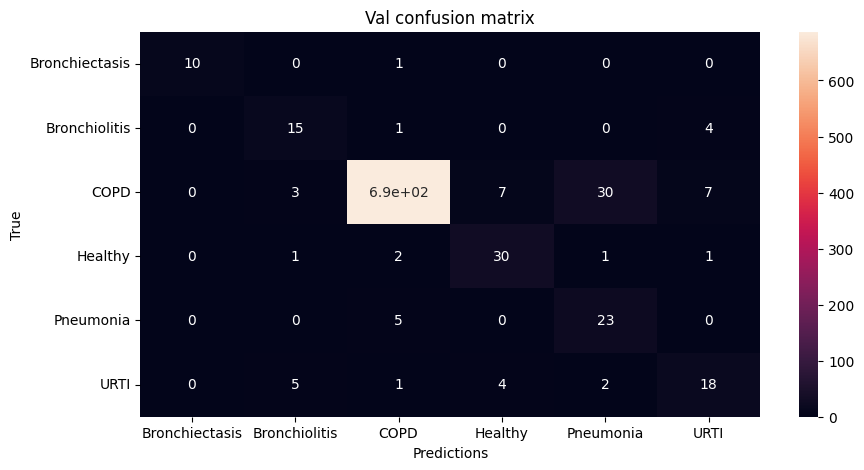


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 52:

Train Accuracy: 0.9342934782608695

Train Loss: 0.2040458328165808

Train F1 Score: 0.9280360515073219

Val Accuracy: 0.8923611111111112
\Val Loss: 0.387863889336586

Val F1 Score: 0.6850336834236428




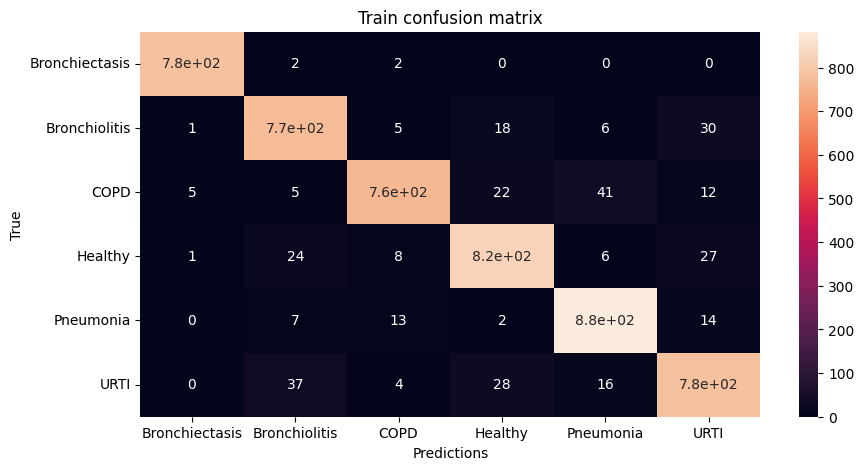

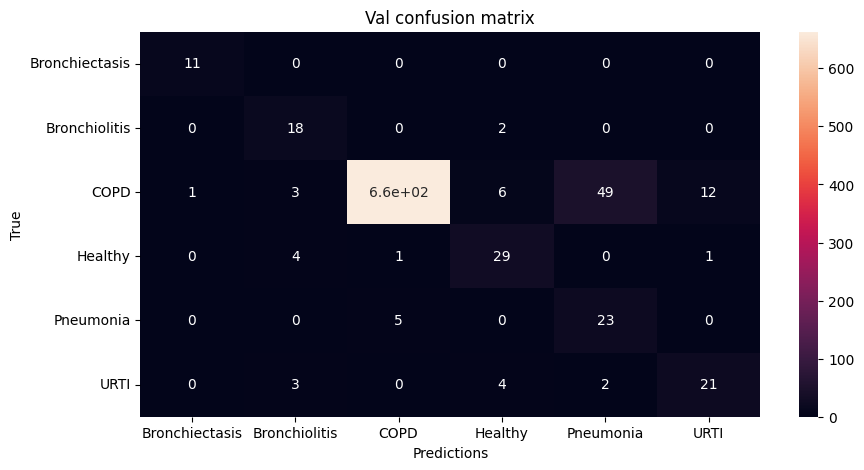


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 53:

Train Accuracy: 0.9172593167701864

Train Loss: 0.2485082889473216

Train F1 Score: 0.9102477116614395

Val Accuracy: 0.9091880341880342
\Val Loss: 0.26546244309456263

Val F1 Score: 0.6817988046893367




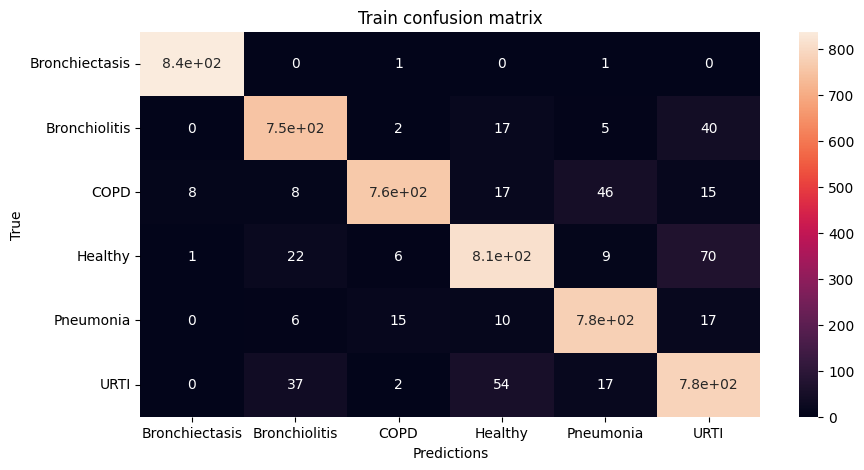

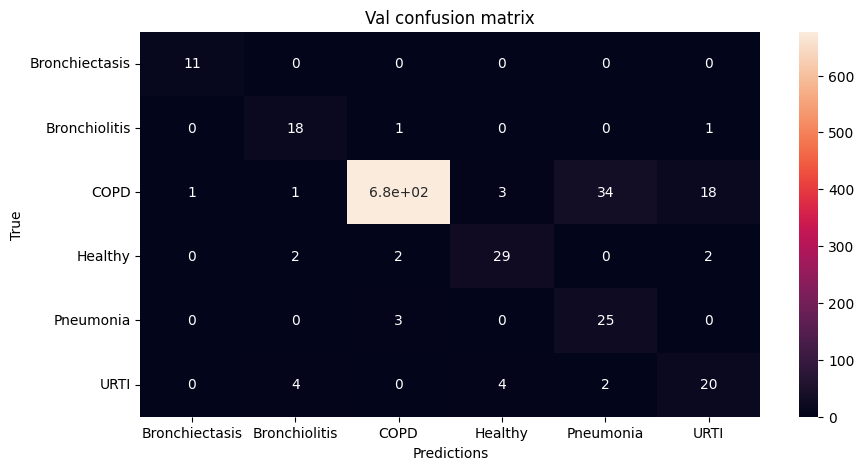


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 54:

Train Accuracy: 0.9417158385093168

Train Loss: 0.18009464958717364

Train F1 Score: 0.9365078251554358

Val Accuracy: 0.9187143874643874
\Val Loss: 0.3003617523720971

Val F1 Score: 0.7003303589644255




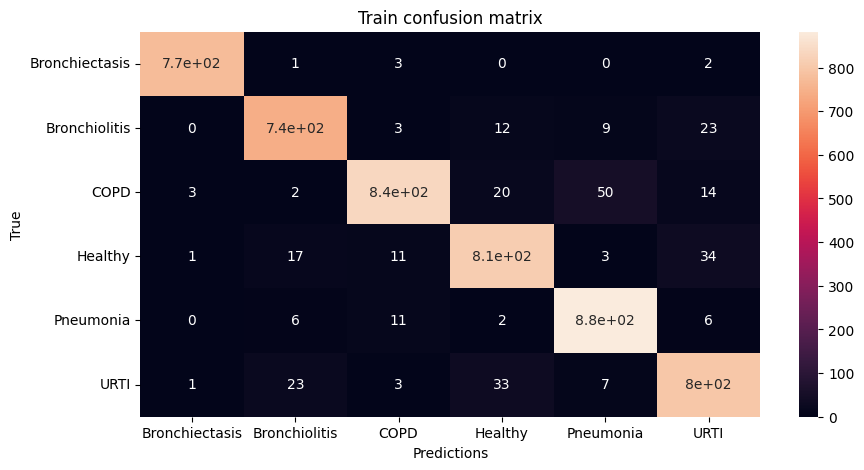

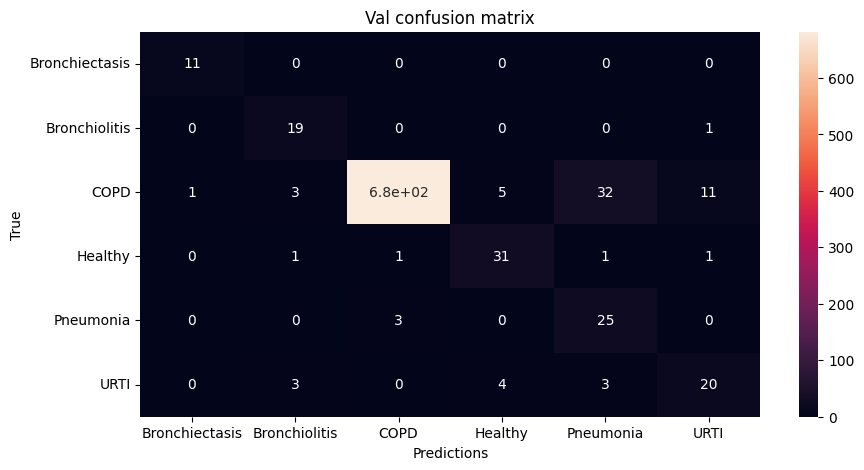


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 55:

Train Accuracy: 0.9440450310559007

Train Loss: 0.1834554279870961

Train F1 Score: 0.9360212620741092

Val Accuracy: 0.916755698005698
\Val Loss: 0.30340655868941985

Val F1 Score: 0.7258453181496373




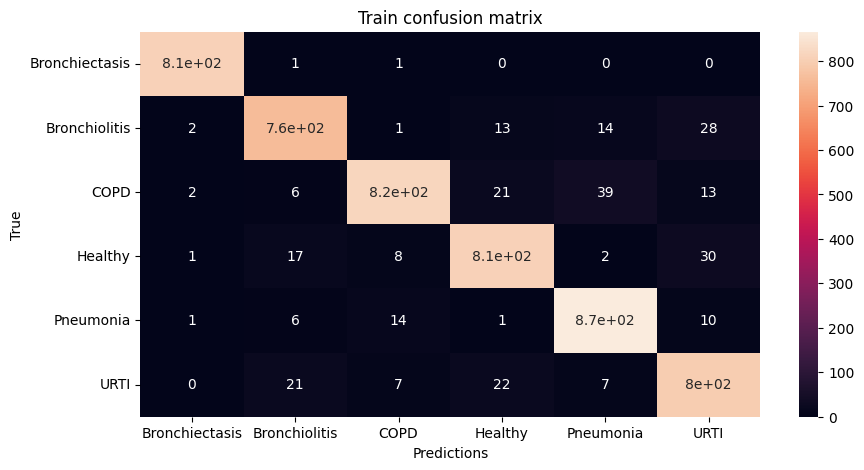

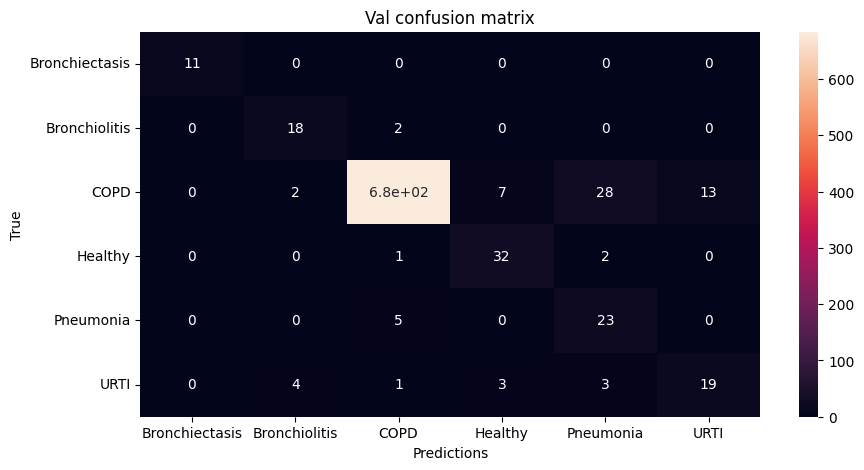


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 56:

Train Accuracy: 0.9169254658385093

Train Loss: 0.25260190637955754

Train F1 Score: 0.9107889407169745

Val Accuracy: 0.9155982905982906
\Val Loss: 0.3391647928359884

Val F1 Score: 0.7280807009449711




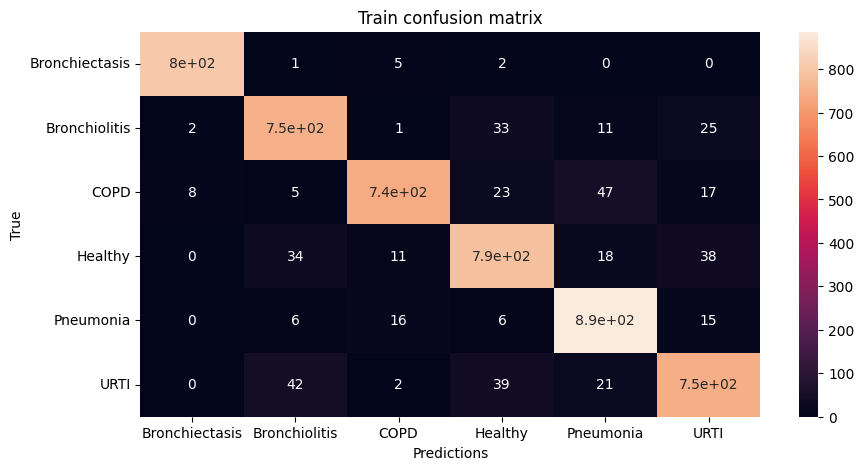

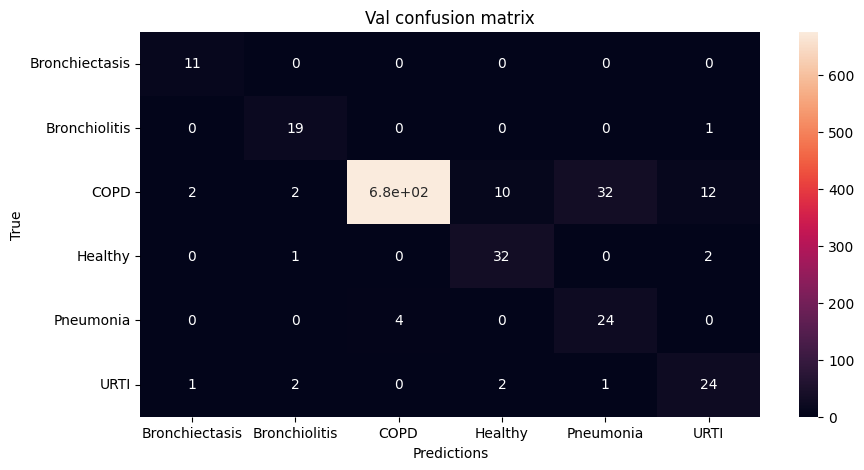


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 57:

Train Accuracy: 0.953416149068323

Train Loss: 0.14408878692836494

Train F1 Score: 0.9459616390074262

Val Accuracy: 0.9149750712250713
\Val Loss: 0.29355715380774605

Val F1 Score: 0.691530281746829




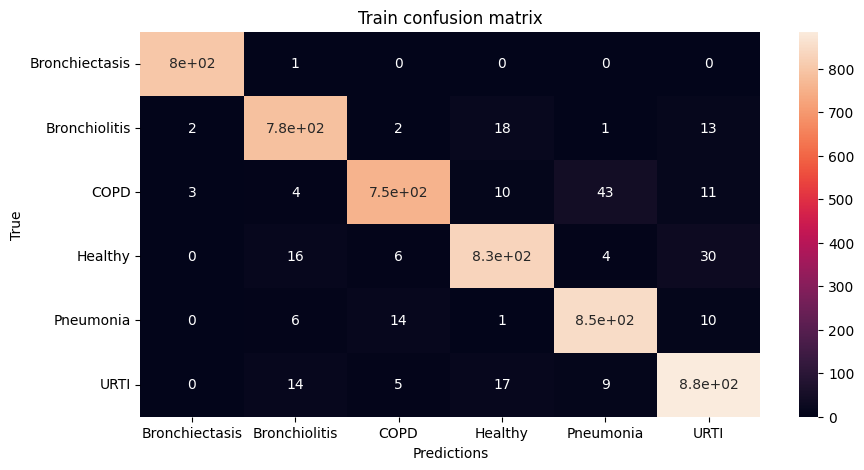

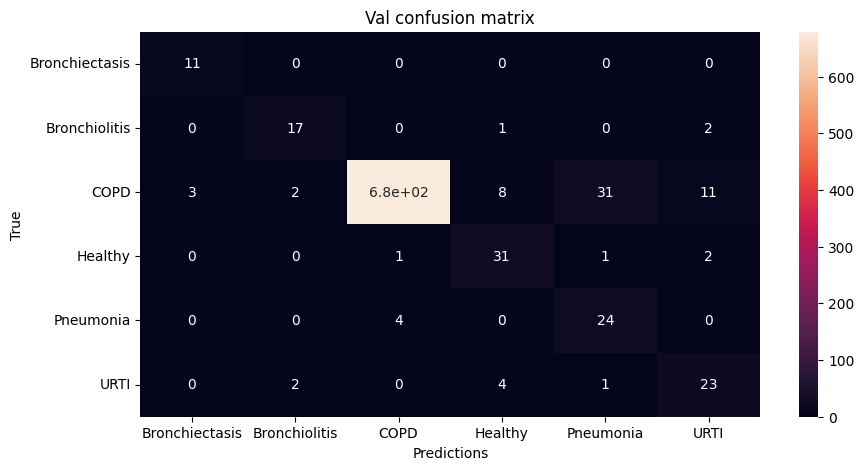


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 58:

Train Accuracy: 0.9450155279503106

Train Loss: 0.16103528221340283

Train F1 Score: 0.9395171833334502

Val Accuracy: 0.8974358974358974
\Val Loss: 0.4349214136643611

Val F1 Score: 0.6632742881774902




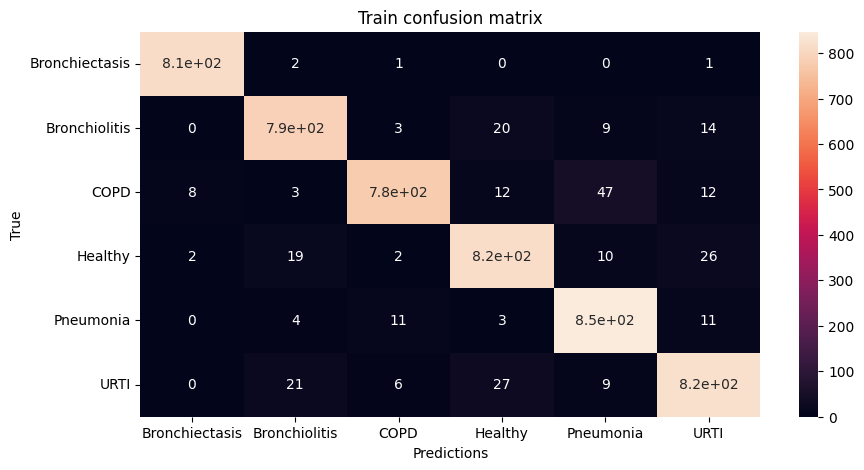

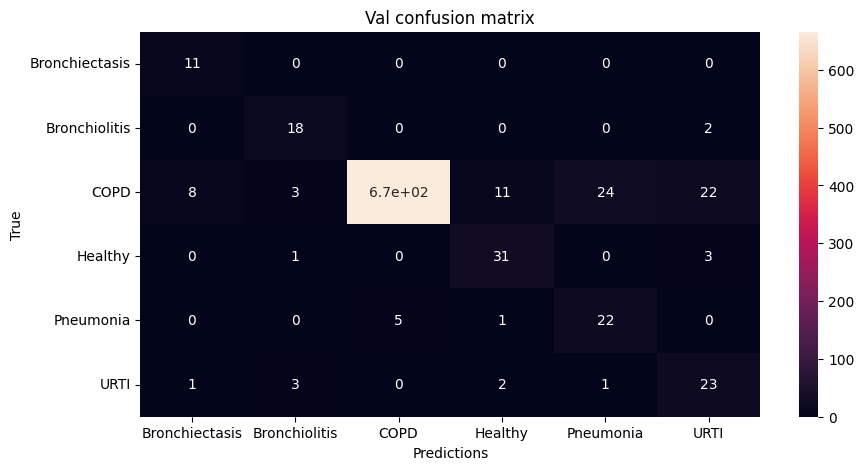


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 59:

Train Accuracy: 0.9446273291925467

Train Loss: 0.17599357207022284

Train F1 Score: 0.9391560210204273

Val Accuracy: 0.9115028490028491
\Val Loss: 0.3338414233315874

Val F1 Score: 0.6871147939452419




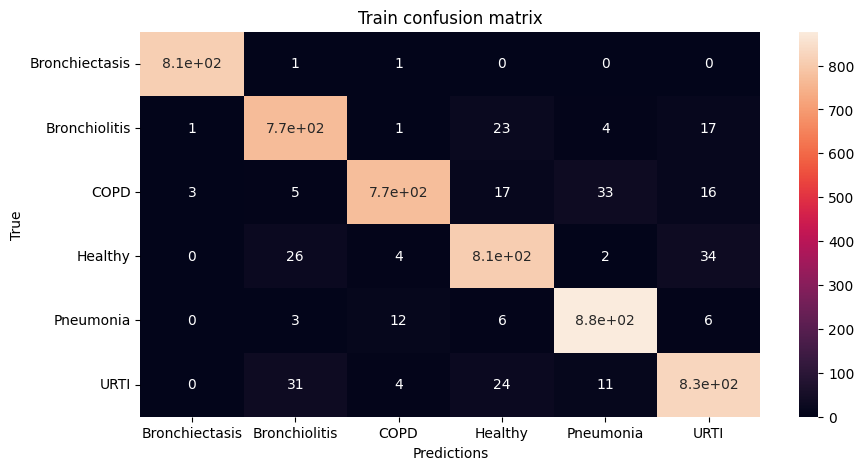

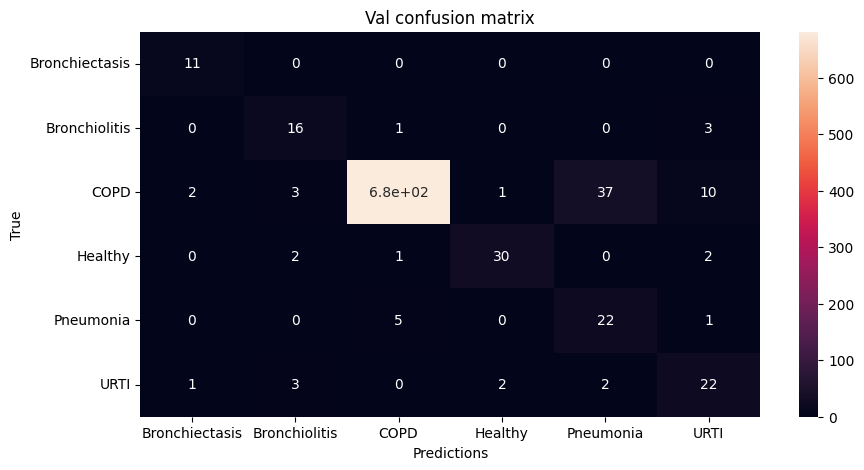


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 60:

Train Accuracy: 0.9418012422360248

Train Loss: 0.17675356703422826

Train F1 Score: 0.9345228790496447

Val Accuracy: 0.8794515669515669
\Val Loss: 0.41311327299034156

Val F1 Score: 0.64270912165995




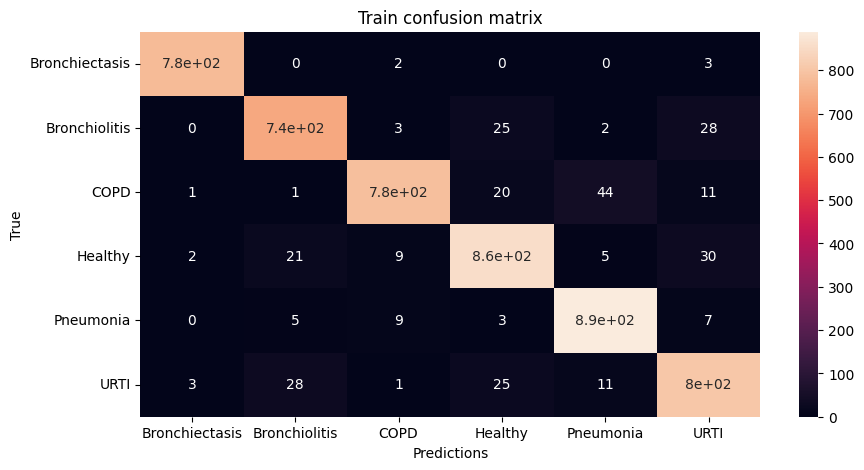

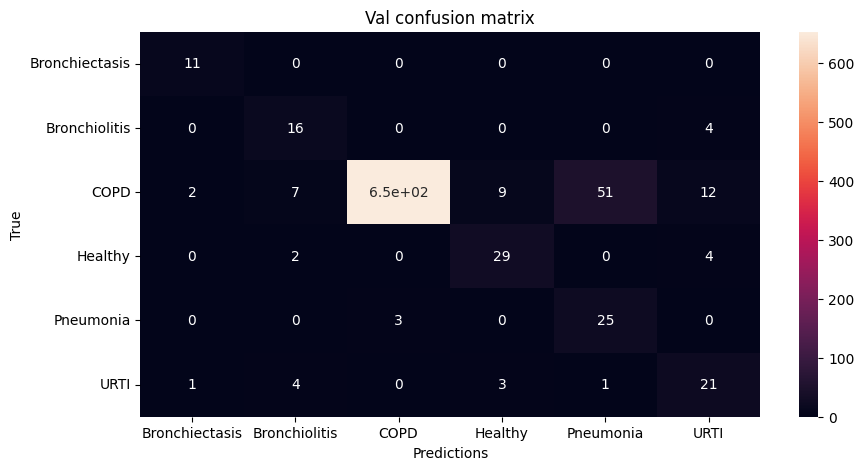


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 61:

Train Accuracy: 0.9549689440993789

Train Loss: 0.1380746302351078

Train F1 Score: 0.9495051780842846

Val Accuracy: 0.9010861823361823
\Val Loss: 0.3222310997683693

Val F1 Score: 0.686111189700939




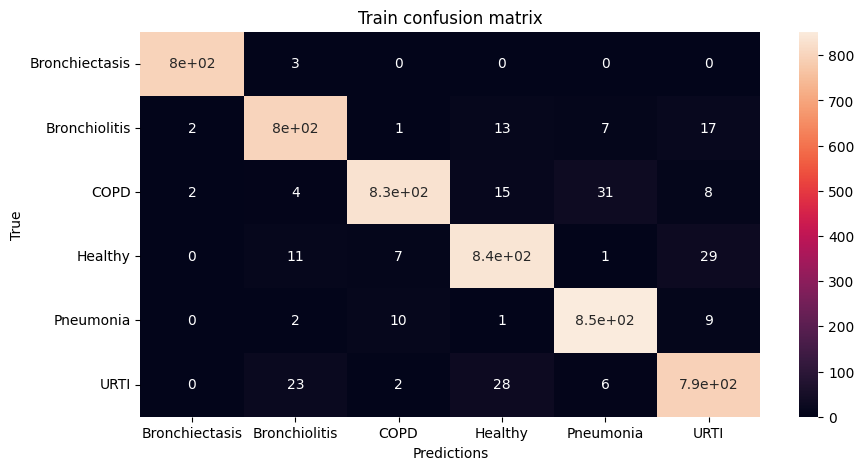

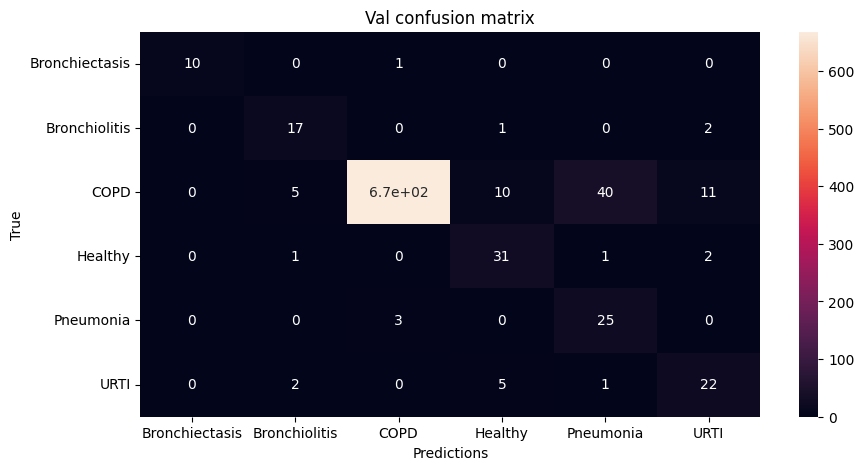


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 62:

Train Accuracy: 0.9597670807453417

Train Loss: 0.12927362281158103

Train F1 Score: 0.9539968952629136

Val Accuracy: 0.9002849002849003
\Val Loss: 0.36137989190993486

Val F1 Score: 0.6628797926284649




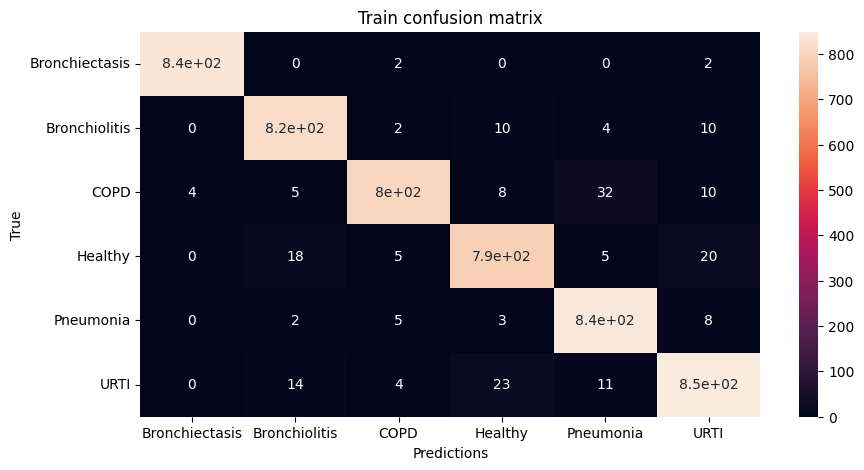

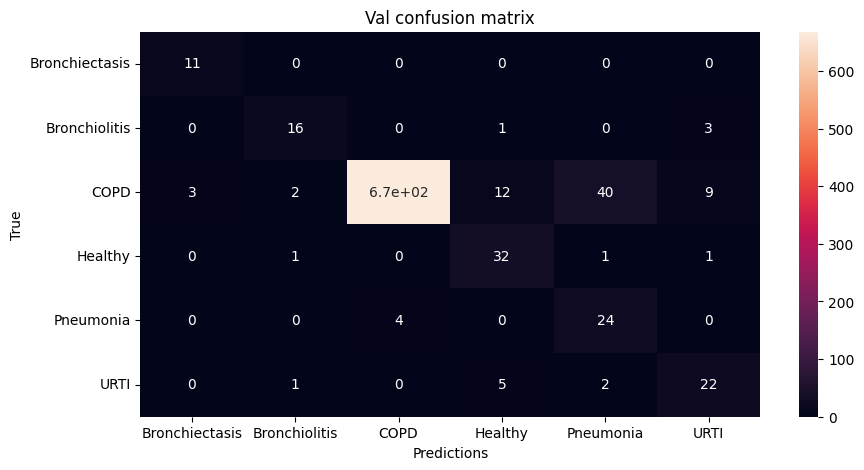


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 63:

Train Accuracy: 0.9393866459627329

Train Loss: 0.19869948054160574

Train F1 Score: 0.9310349740597031

Val Accuracy: 0.9077635327635327
\Val Loss: 0.3218915513544171

Val F1 Score: 0.6910278929604424




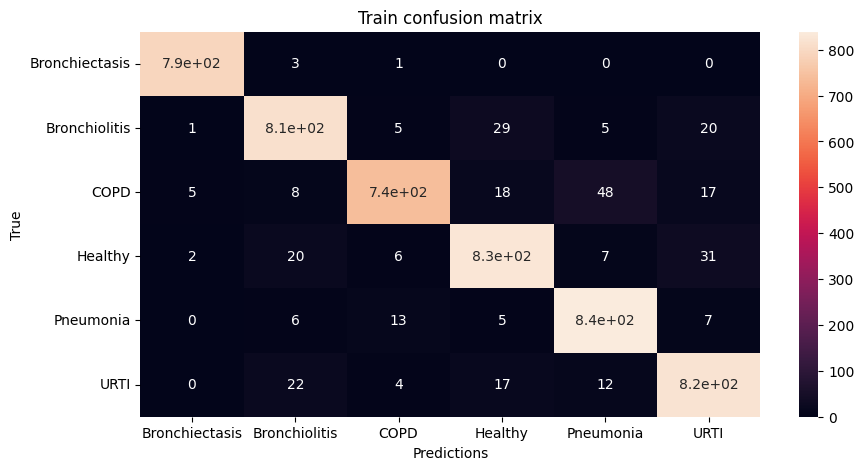

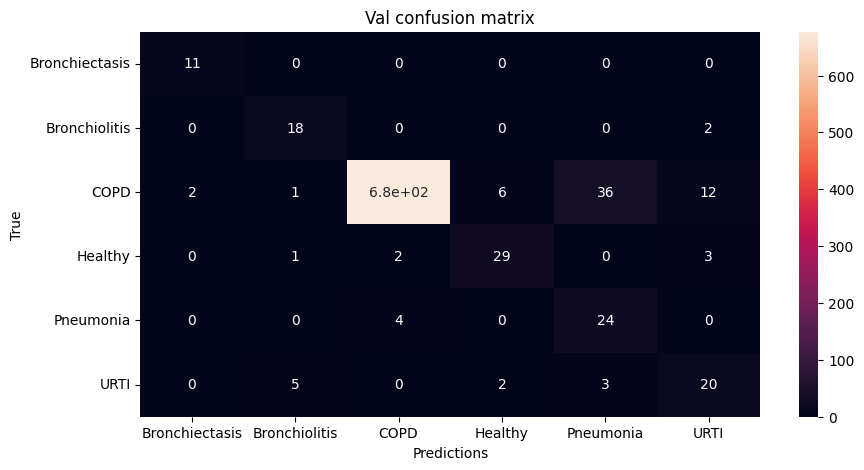


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 64:

Train Accuracy: 0.9631211180124224

Train Loss: 0.12126920652222929

Train F1 Score: 0.9576635690209288

Val Accuracy: 0.9010861823361823
\Val Loss: 0.39104446175473706

Val F1 Score: 0.7155858874320984




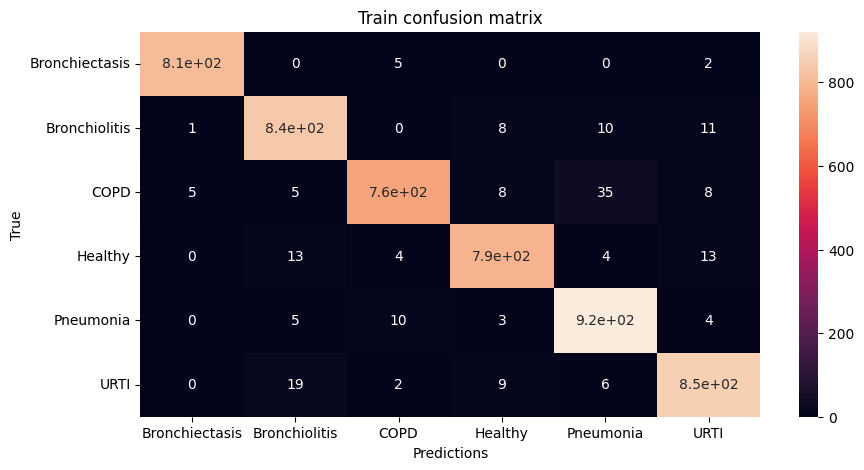

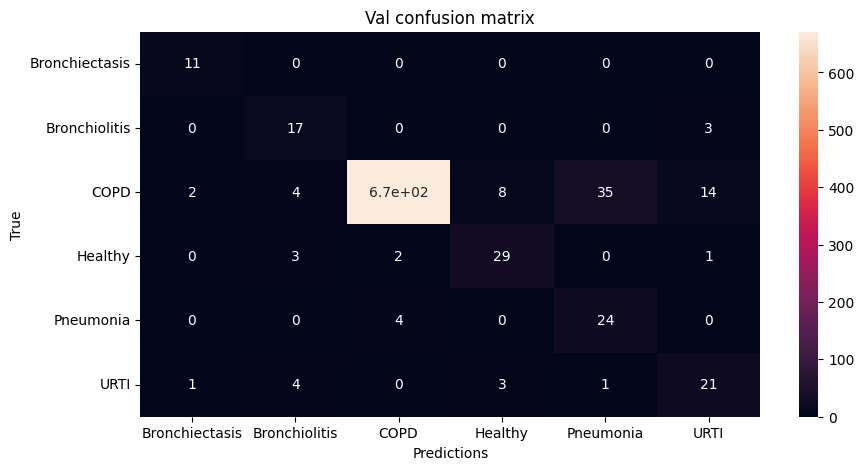


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 65:

Train Accuracy: 0.9530590062111801

Train Loss: 0.14157577528276985

Train F1 Score: 0.9459662452247573

Val Accuracy: 0.9005519943019943
\Val Loss: 0.4216788386305173

Val F1 Score: 0.6650262210104201




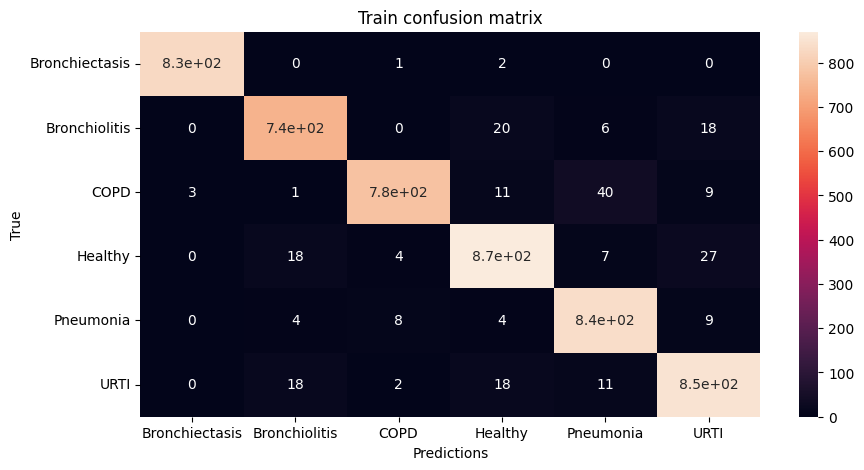

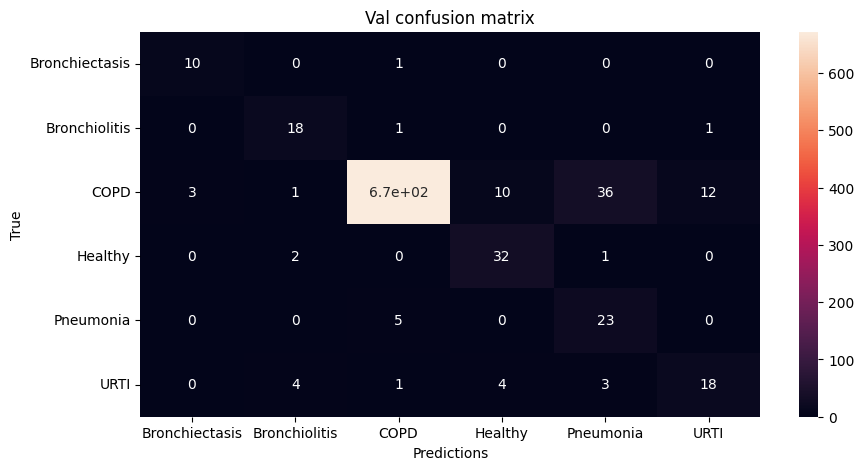


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 66:

Train Accuracy: 0.9348680124223602

Train Loss: 0.20525581409333285

Train F1 Score: 0.9256769007777575

Val Accuracy: 0.9077635327635327
\Val Loss: 0.36085176091917137

Val F1 Score: 0.6779119582087906




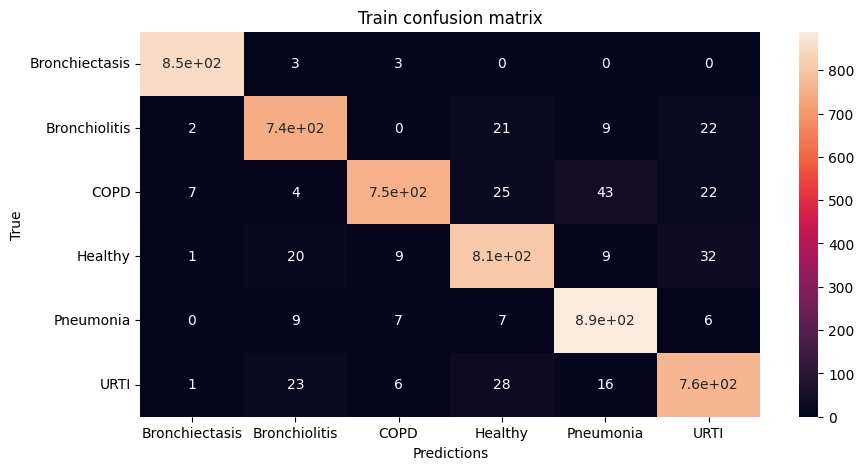

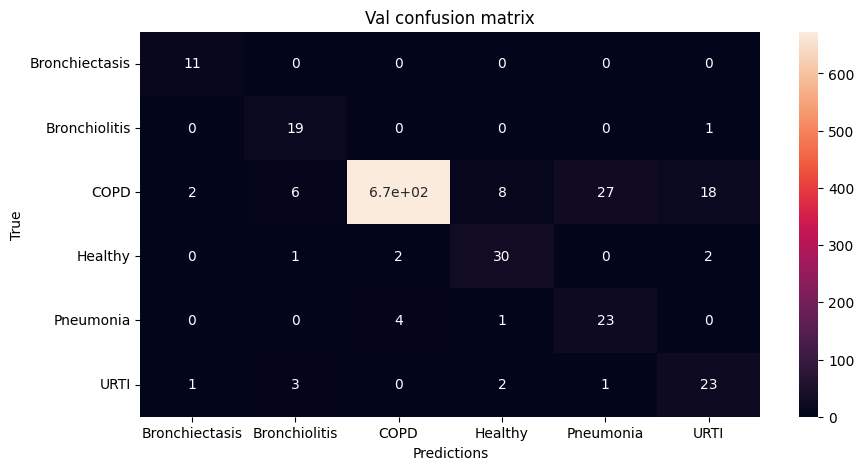


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 67:

Train Accuracy: 0.9571894409937888

Train Loss: 0.14737920798303455

Train F1 Score: 0.9520347788467171

Val Accuracy: 0.899928774928775
\Val Loss: 0.33568625897169113

Val F1 Score: 0.6737733008684935




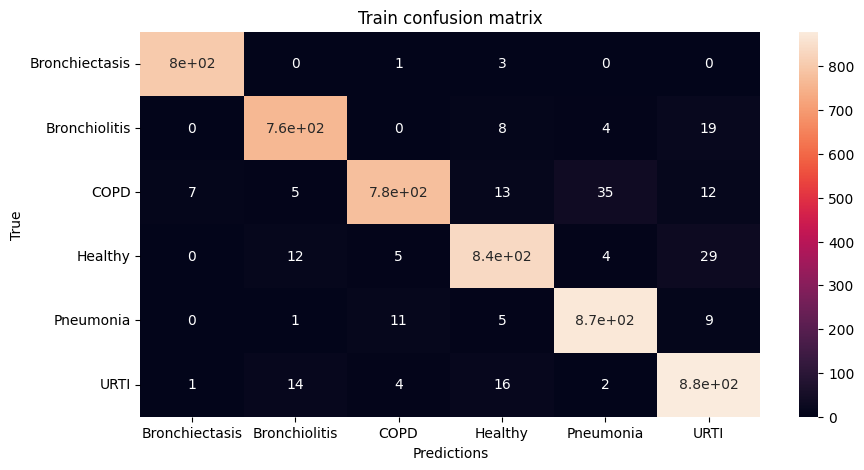

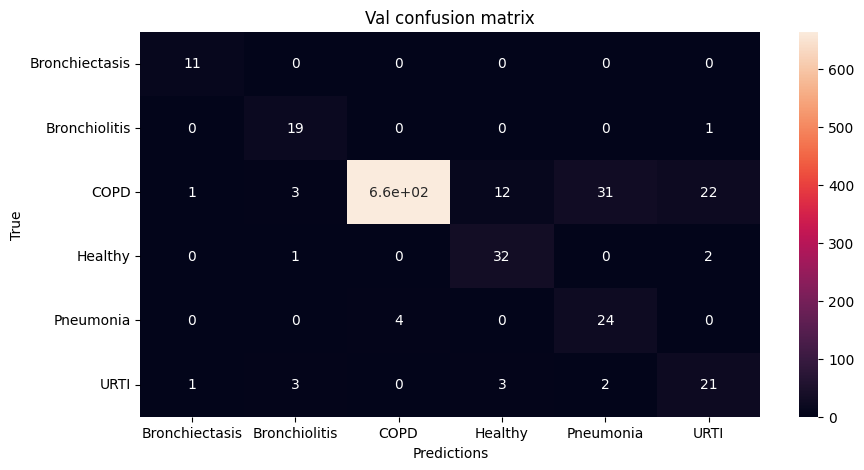


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 68:

Train Accuracy: 0.9485636645962733

Train Loss: 0.1666974412647556

Train F1 Score: 0.9434266375458759

Val Accuracy: 0.9253917378917379
\Val Loss: 0.3288148084172496

Val F1 Score: 0.7129554008996045




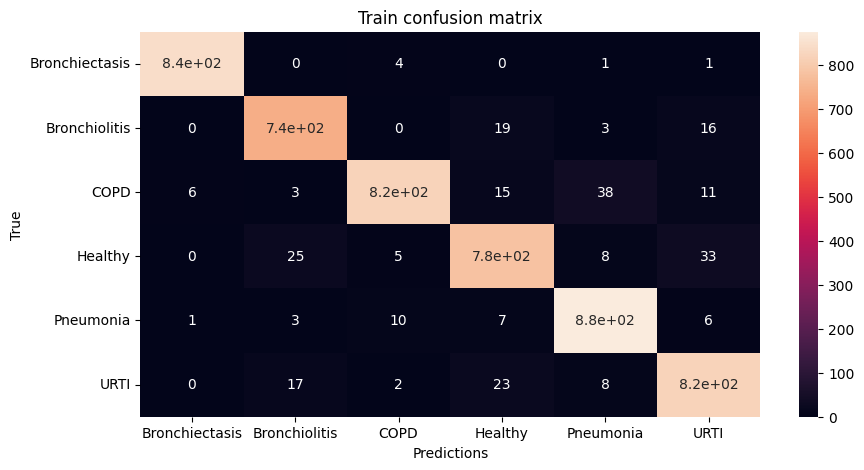

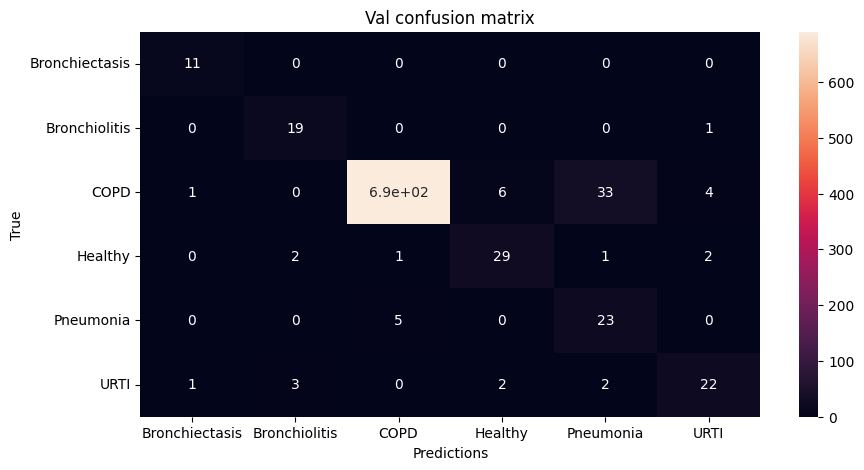


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 69:

Train Accuracy: 0.9502018633540372

Train Loss: 0.1525793666286128

Train F1 Score: 0.9400668651420877

Val Accuracy: 0.8973468660968661
\Val Loss: 0.36486288463627853

Val F1 Score: 0.6359921815218749




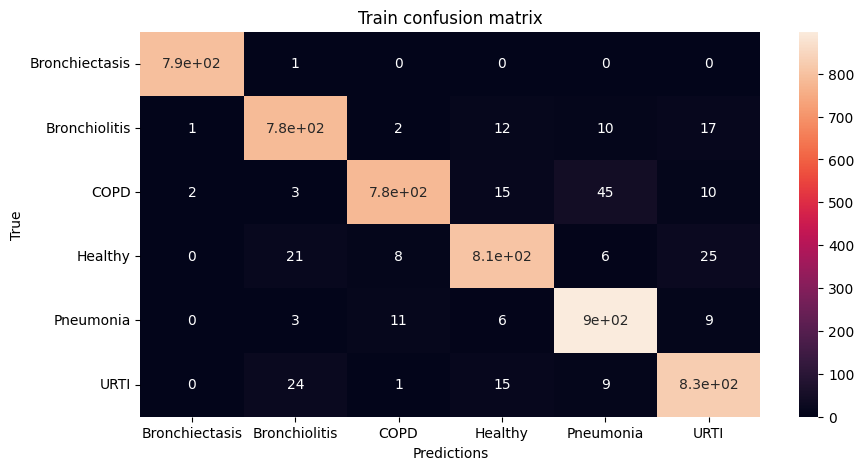

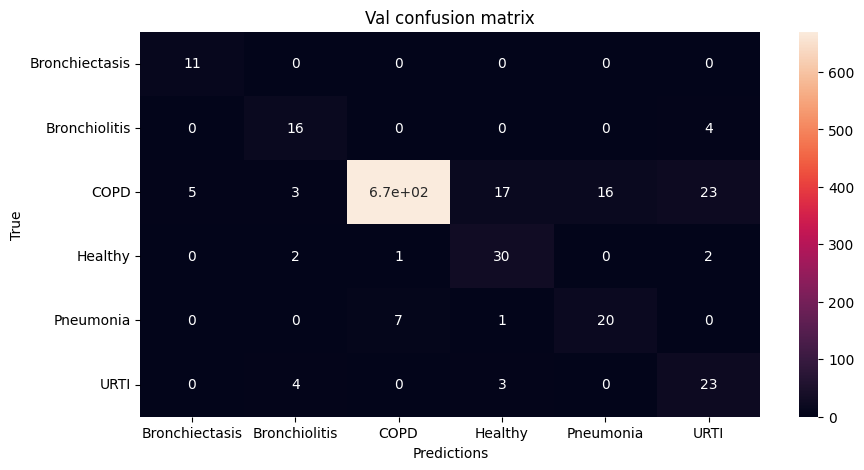


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 70:

Train Accuracy: 0.9633152173913043

Train Loss: 0.11200491971804859

Train F1 Score: 0.9584375264481728

Val Accuracy: 0.9350071225071225
\Val Loss: 0.3103670572206654

Val F1 Score: 0.7474190140212024




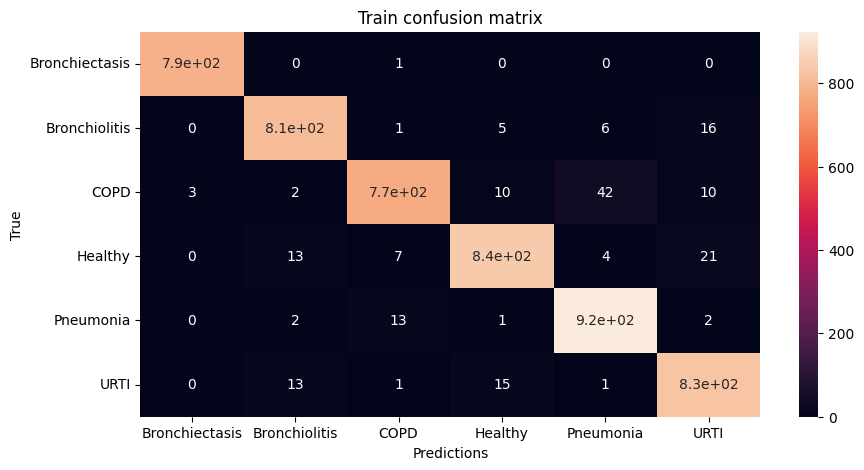

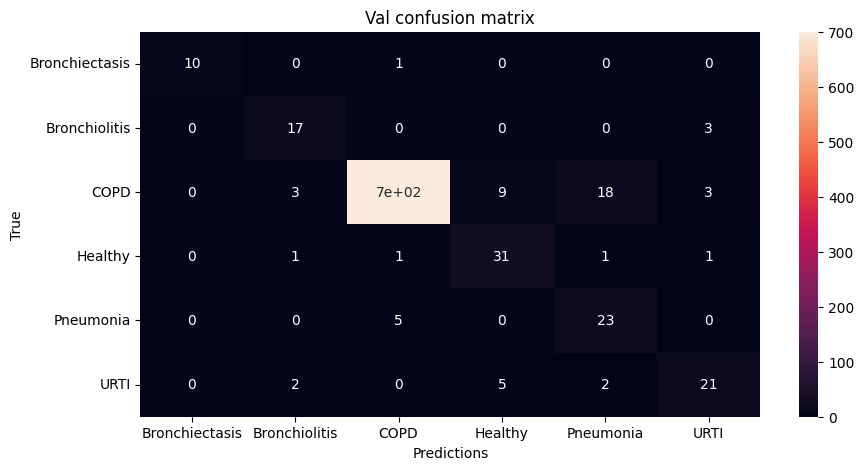


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 71:

Train Accuracy: 0.9419642857142857

Train Loss: 0.17867457009389165

Train F1 Score: 0.9371767388367505

Val Accuracy: 0.9184472934472935
\Val Loss: 0.4147868337178672

Val F1 Score: 0.687502247315866




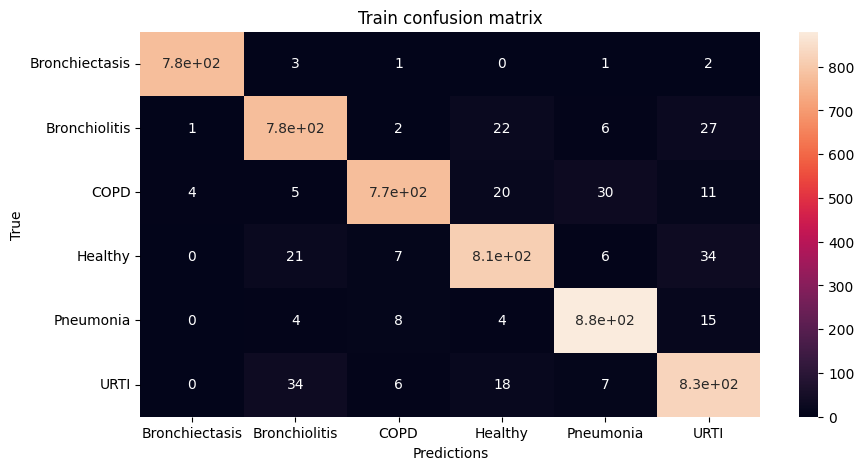

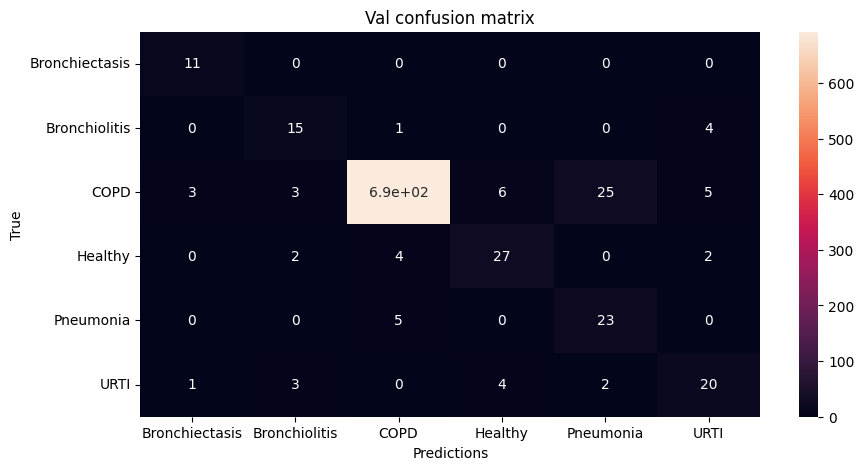


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 72:

Train Accuracy: 0.956638198757764

Train Loss: 0.1387509003119624

Train F1 Score: 0.9522952652125625

Val Accuracy: 0.9135505698005697
\Val Loss: 0.32482581295900875

Val F1 Score: 0.7197012194880733




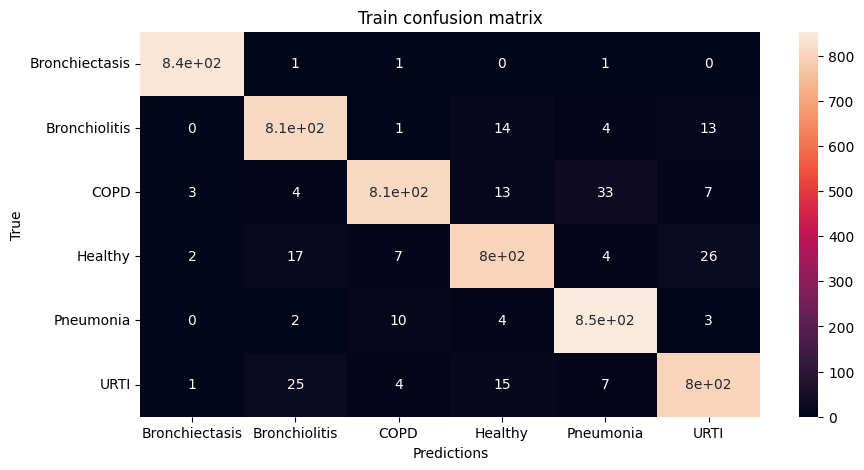

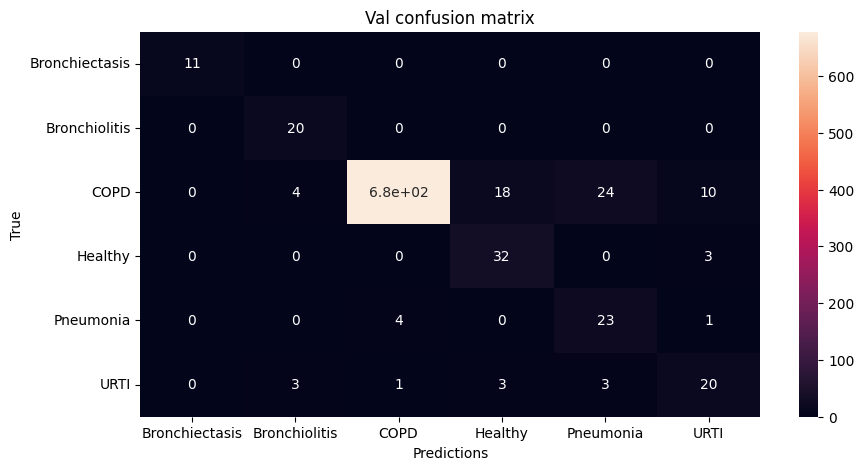


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 73:

Train Accuracy: 0.9544720496894409

Train Loss: 0.1434301927292384

Train F1 Score: 0.9497126692570514

Val Accuracy: 0.8834579772079771
\Val Loss: 0.4538751572922424

Val F1 Score: 0.6979061149888568




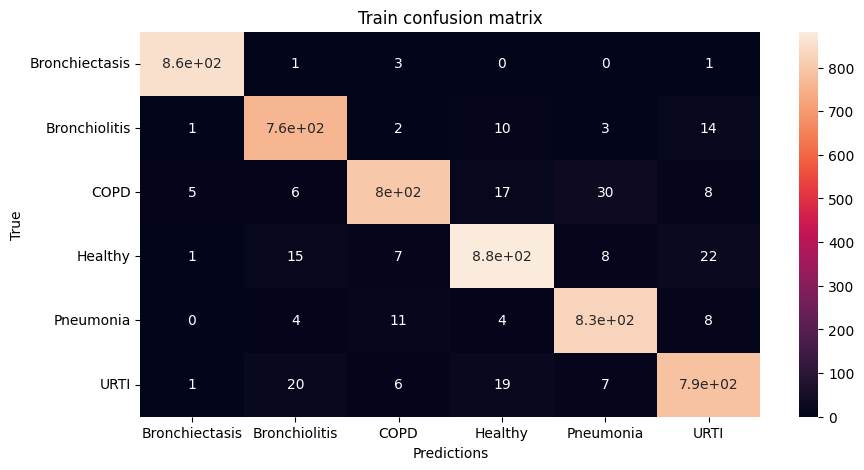

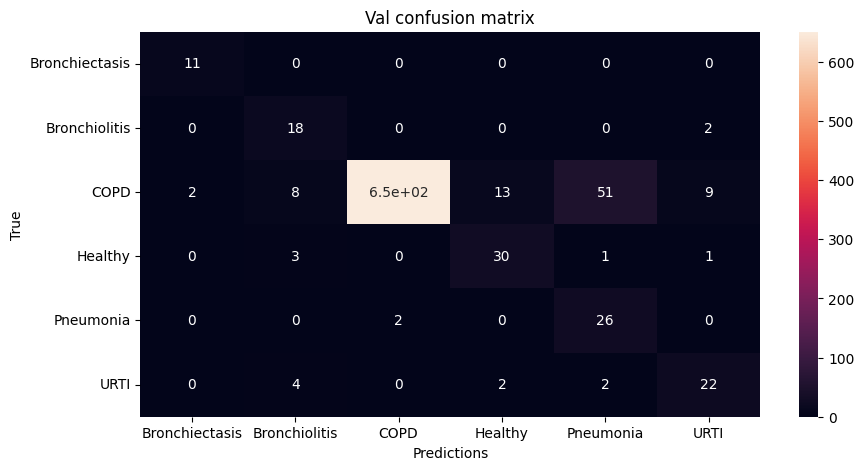


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 74:

Train Accuracy: 0.9584083850931677

Train Loss: 0.13331142929816467

Train F1 Score: 0.9553733779036481

Val Accuracy: 0.9138176638176638
\Val Loss: 0.33106191206240543

Val F1 Score: 0.6998422267260375




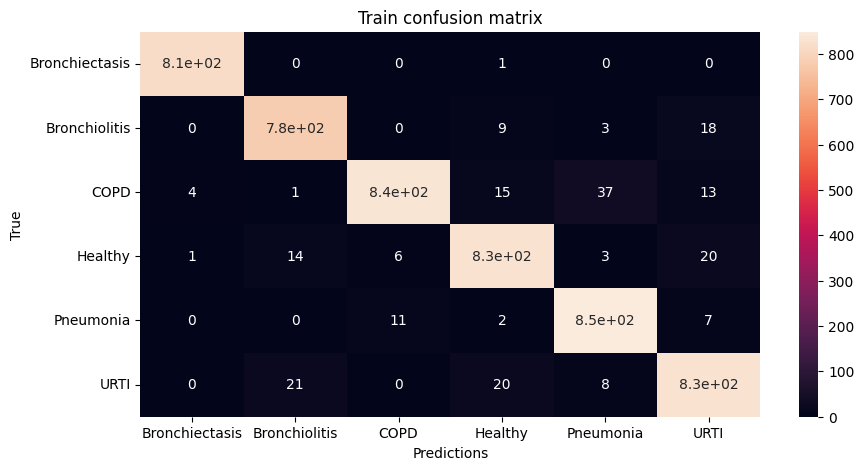

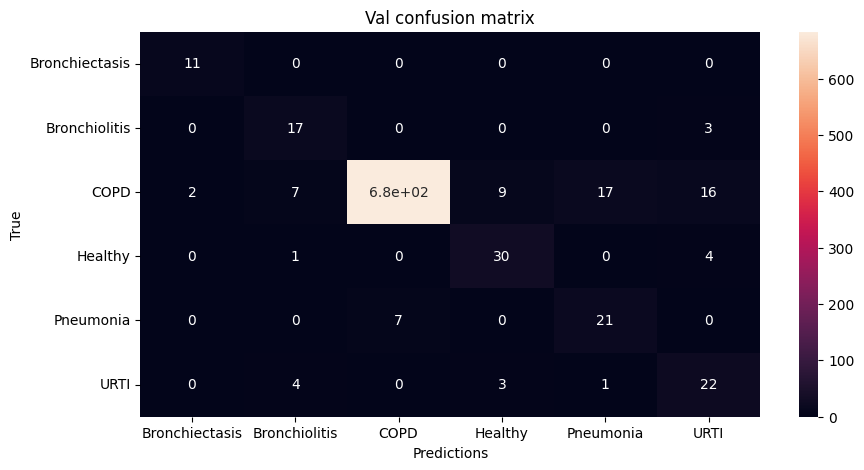


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 75:

Train Accuracy: 0.9580745341614907

Train Loss: 0.13033127149000115

Train F1 Score: 0.9500467392228404

Val Accuracy: 0.8814102564102564
\Val Loss: 0.40050317691984

Val F1 Score: 0.6579820248815749




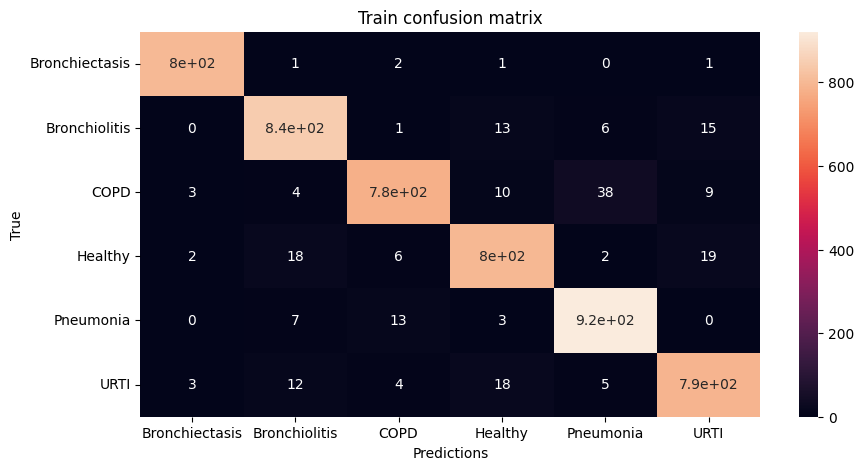

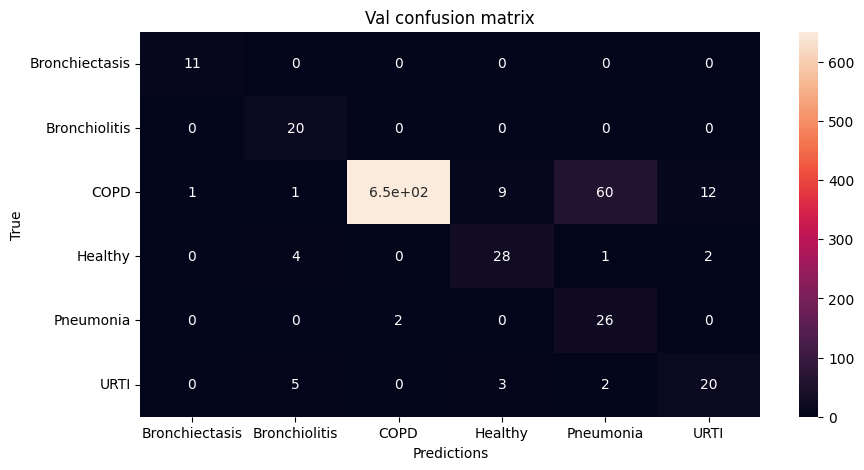


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 76:

Train Accuracy: 0.940163043478261

Train Loss: 0.19297160621246565

Train F1 Score: 0.9348935595950725

Val Accuracy: 0.9346509971509972
\Val Loss: 0.29284002631040357

Val F1 Score: 0.7424937906088652




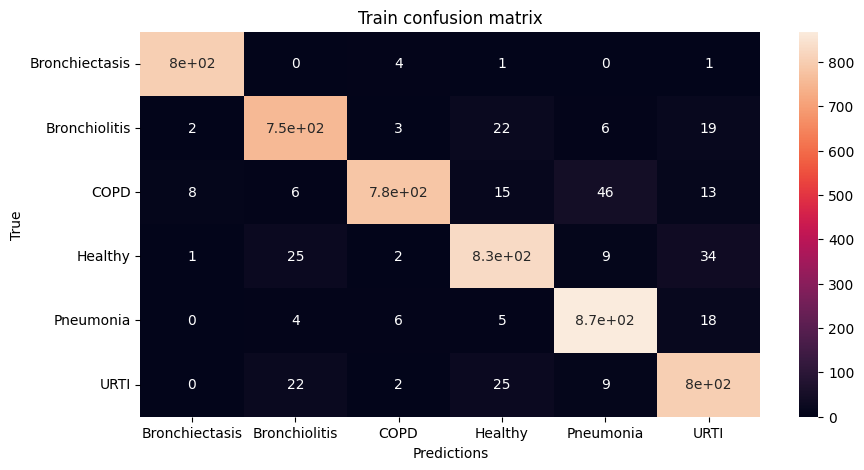

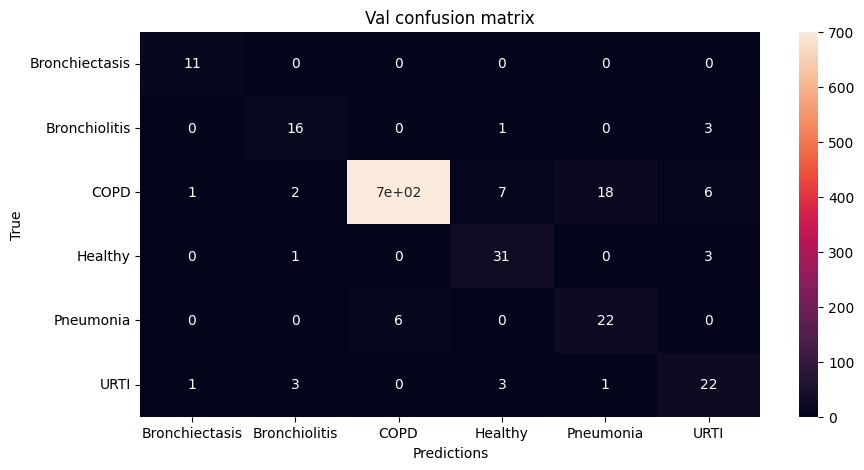


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 77:

Train Accuracy: 0.9598214285714286

Train Loss: 0.12944130212508187

Train F1 Score: 0.9527442936571489

Val Accuracy: 0.9340277777777778
\Val Loss: 0.31106698099109864

Val F1 Score: 0.7116096510931298




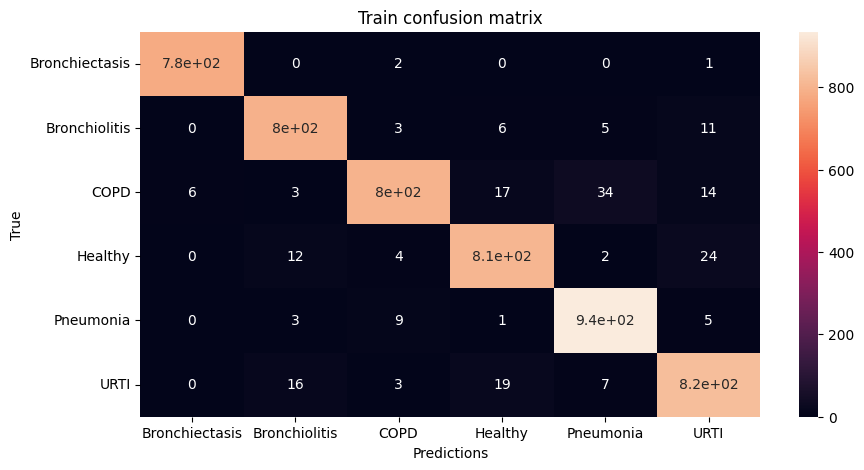

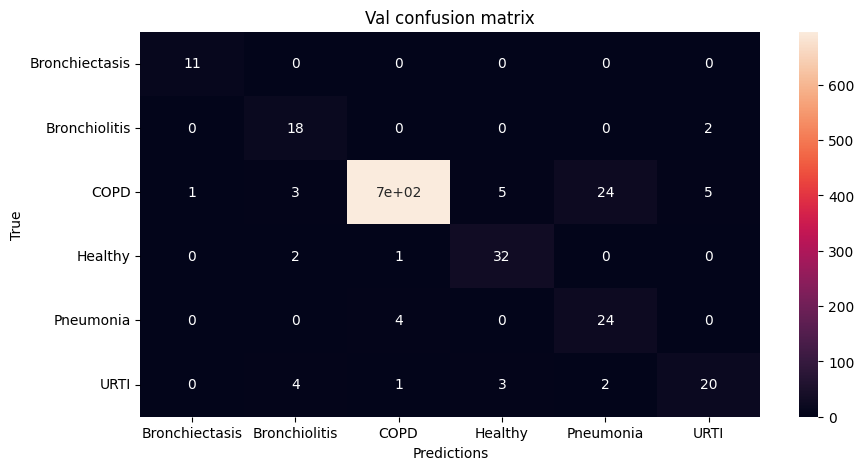


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 78:

Train Accuracy: 0.9643711180124223

Train Loss: 0.11140663183427282

Train F1 Score: 0.9584291677297272

Val Accuracy: 0.8929843304843305
\Val Loss: 0.366365626592327

Val F1 Score: 0.6638304447686231




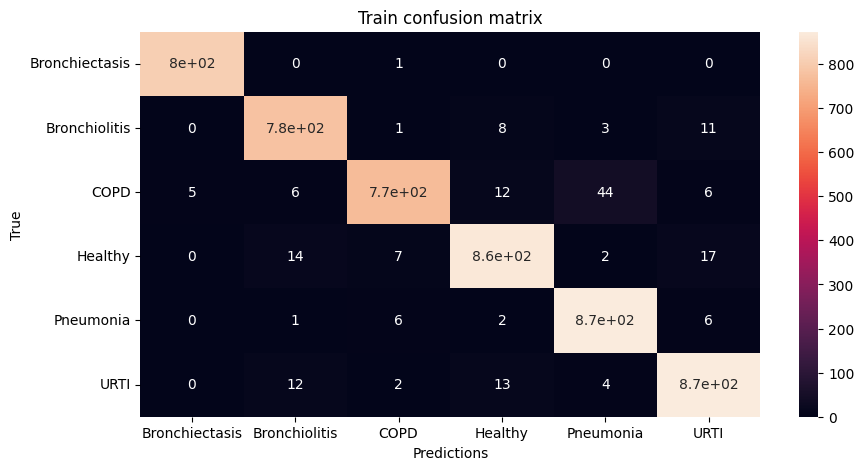

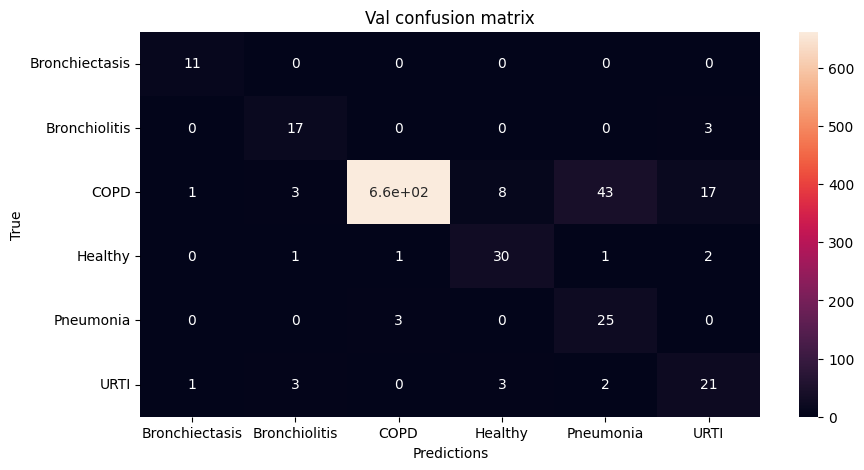


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 79:

Train Accuracy: 0.9622903726708075

Train Loss: 0.11646398213570533

Train F1 Score: 0.9596604682643961

Val Accuracy: 0.9042913105413105
\Val Loss: 0.33468937984219305

Val F1 Score: 0.7024538781907823




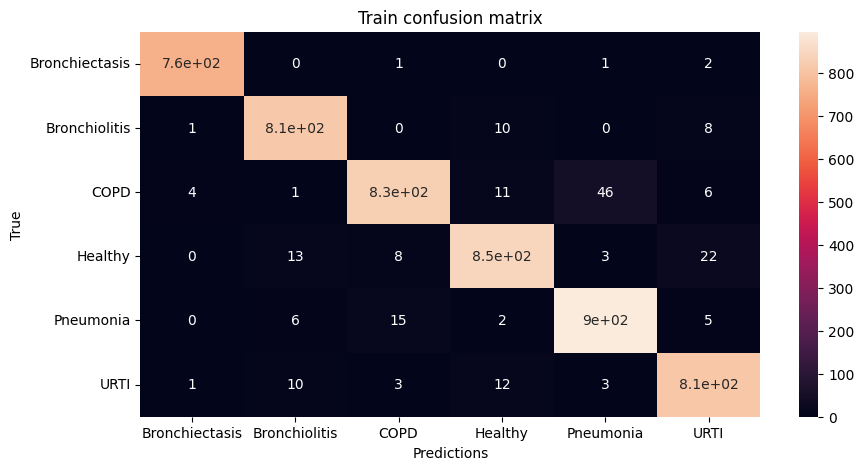

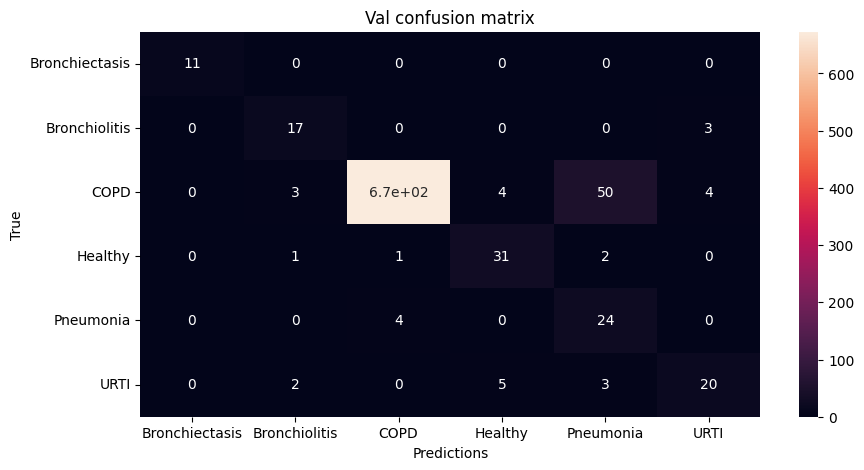


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 80:

Train Accuracy: 0.9670885093167702

Train Loss: 0.10694148272611433

Train F1 Score: 0.9632064818595507

Val Accuracy: 0.899928774928775
\Val Loss: 0.4086522277858522

Val F1 Score: 0.6580536365509033




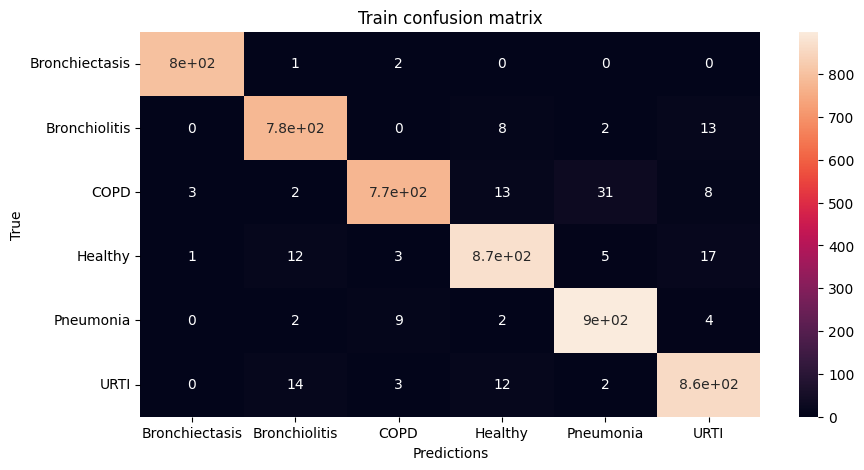

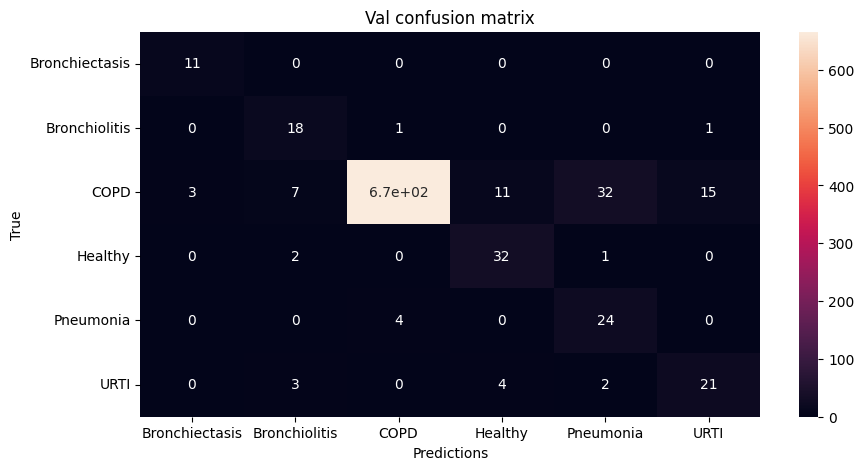


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 81:

Train Accuracy: 0.9401086956521738

Train Loss: 0.20478356735468467

Train F1 Score: 0.9340150071227032

Val Accuracy: 0.9161324786324786
\Val Loss: 0.3835022756484924

Val F1 Score: 0.7229329369686268




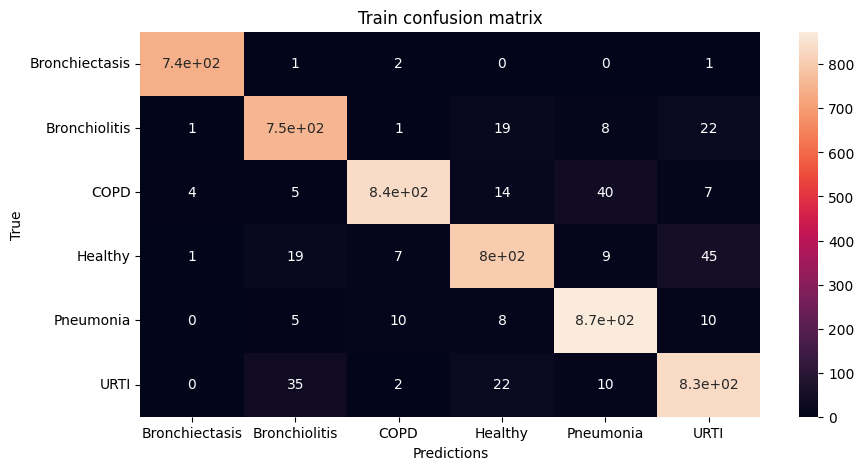

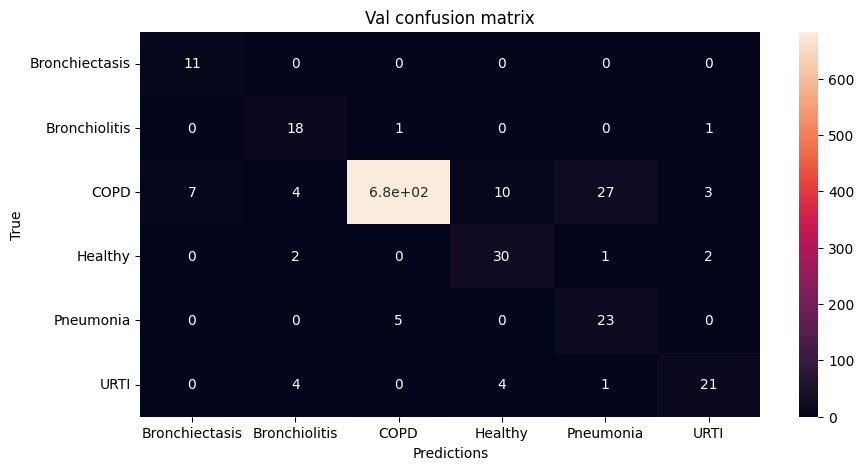


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 82:

Train Accuracy: 0.9612655279503105

Train Loss: 0.14107037144163564

Train F1 Score: 0.9578654632805297

Val Accuracy: 0.9123931623931624
\Val Loss: 0.32456745931671727

Val F1 Score: 0.6952009322466673




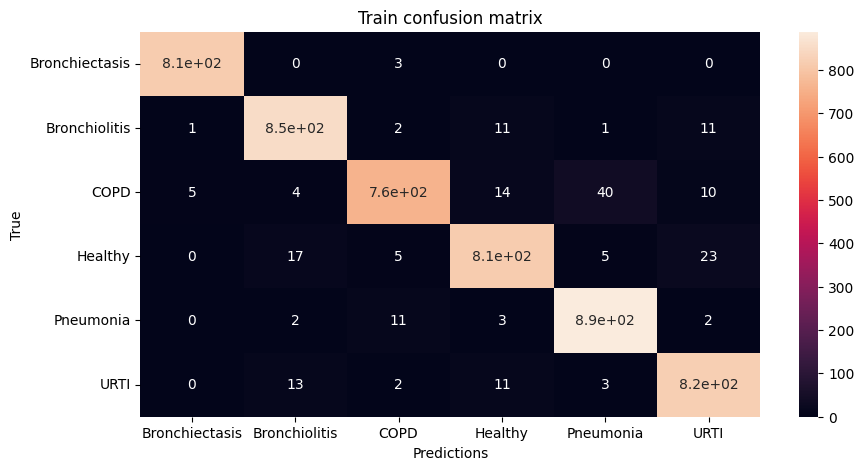

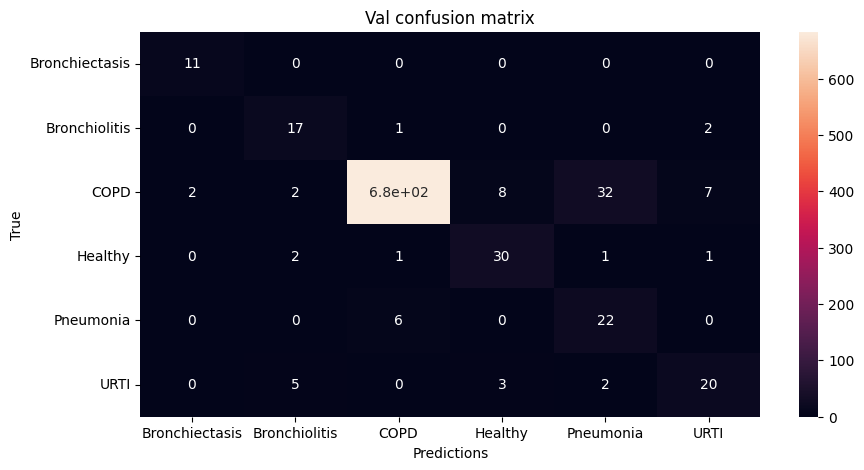


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 83:

Train Accuracy: 0.9576863354037267

Train Loss: 0.13936650771532

Train F1 Score: 0.9503333146527687

Val Accuracy: 0.9300213675213675
\Val Loss: 0.29388602366843436

Val F1 Score: 0.7638973262574937




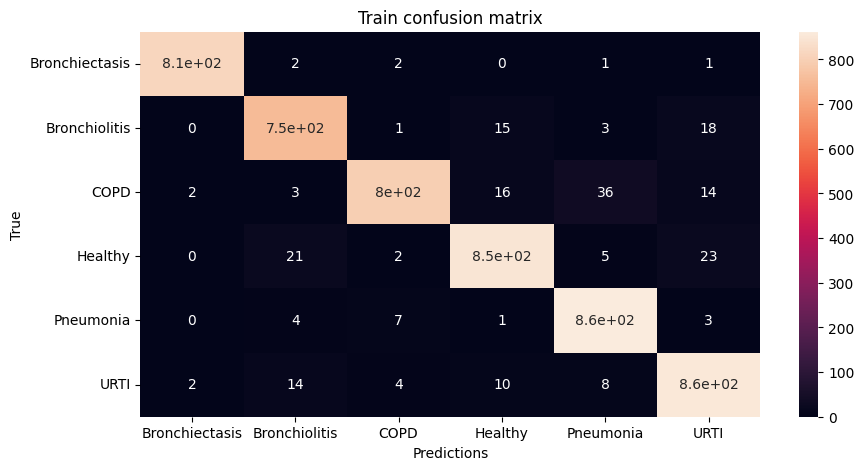

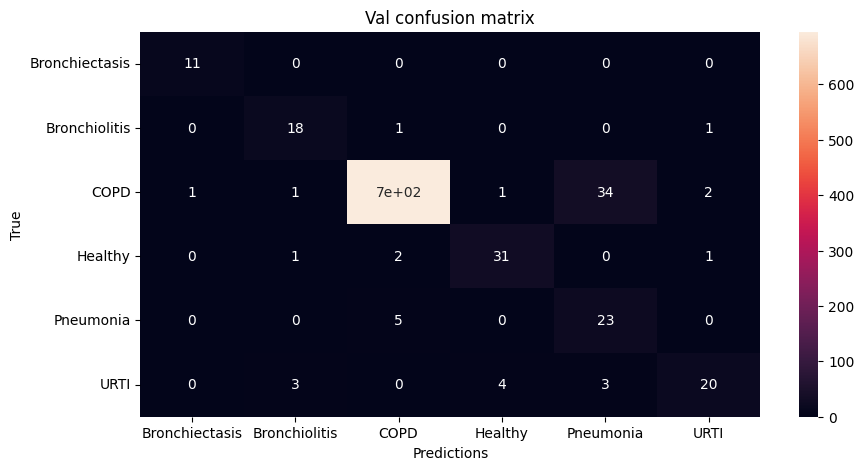


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 84:

Train Accuracy: 0.9615993788819875

Train Loss: 0.12414695888393275

Train F1 Score: 0.9569060236030484

Val Accuracy: 0.9234330484330484
\Val Loss: 0.358580409652657

Val F1 Score: 0.6885016593668196




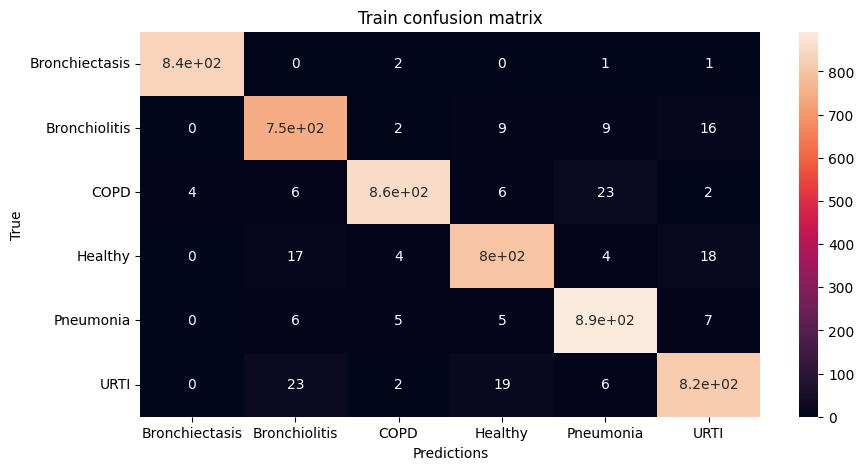

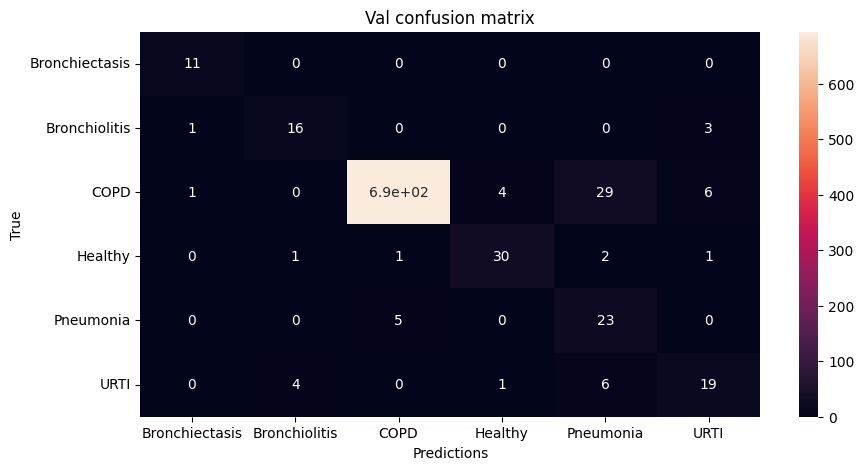


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 85:

Train Accuracy: 0.9645652173913043

Train Loss: 0.1198082521170239

Train F1 Score: 0.9611618244870109

Val Accuracy: 0.9360754985754985
\Val Loss: 0.30563971241591154

Val F1 Score: 0.7191539362624839




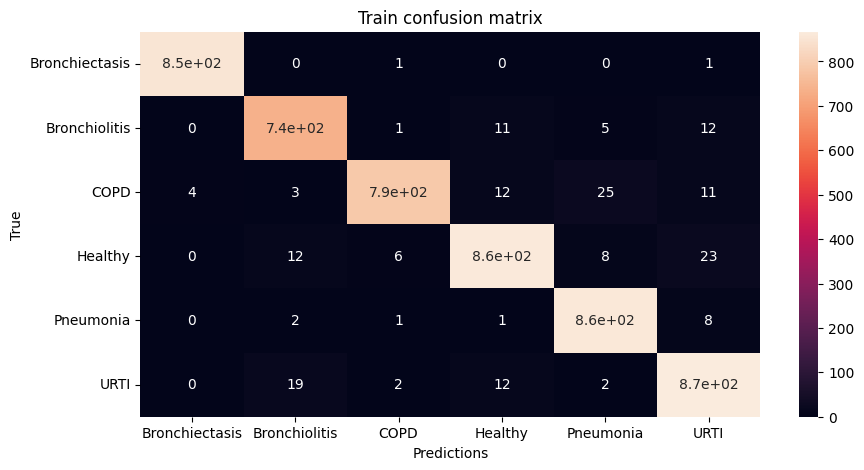

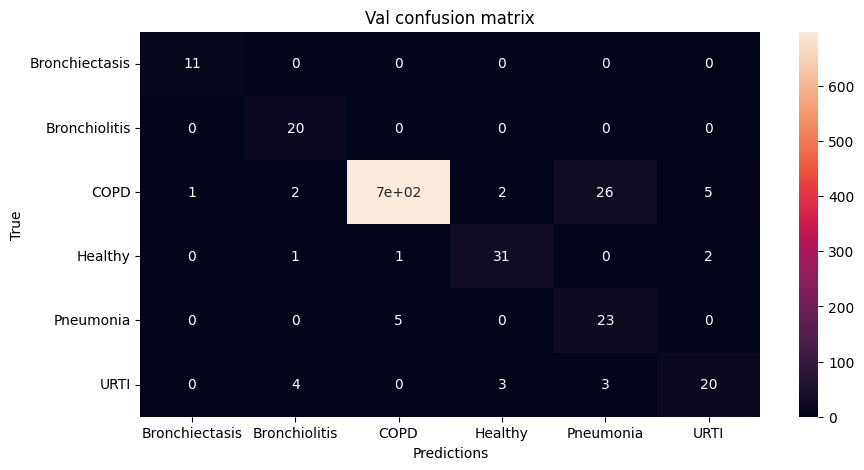


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 86:

Train Accuracy: 0.970442546583851

Train Loss: 0.08593298056342216

Train F1 Score: 0.9674753976164397

Val Accuracy: 0.9239672364672364
\Val Loss: 0.33151833715210494

Val F1 Score: 0.7102578591417383




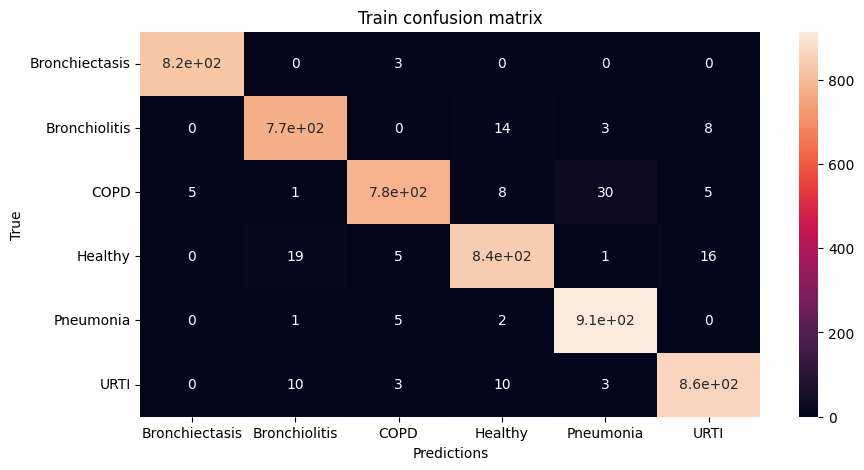

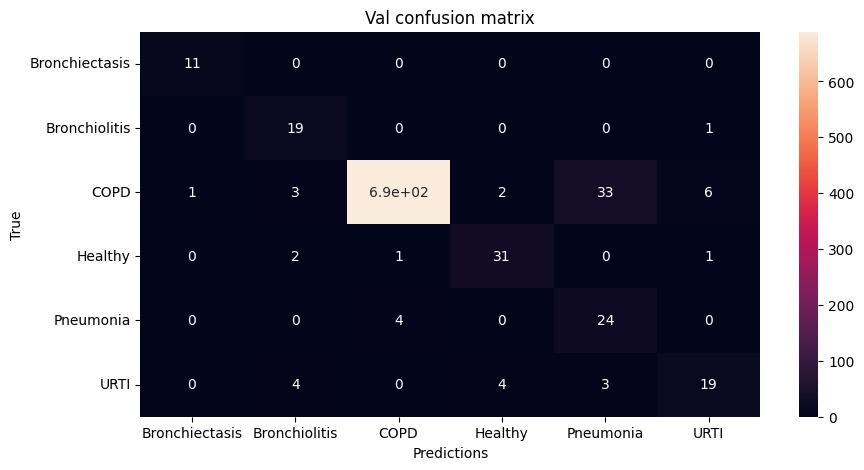


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 87:

Train Accuracy: 0.9634549689440994

Train Loss: 0.1139016799839873

Train F1 Score: 0.9591082101282866

Val Accuracy: 0.9221866096866096
\Val Loss: 0.34019403697715866

Val F1 Score: 0.702123024949321




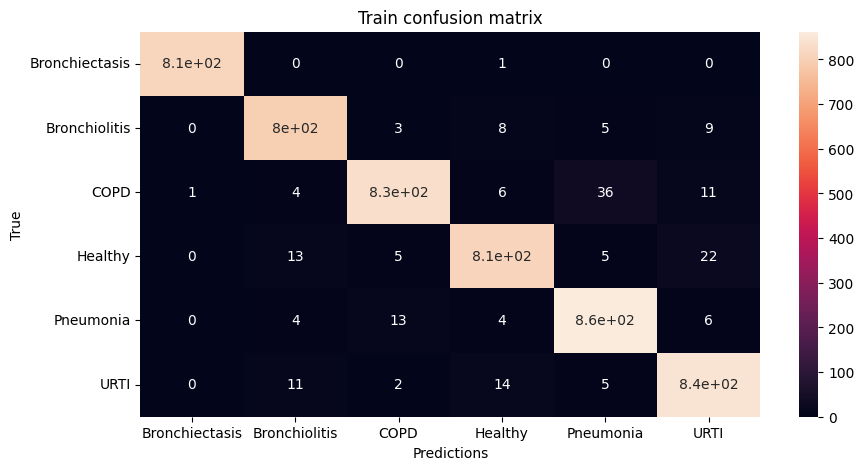

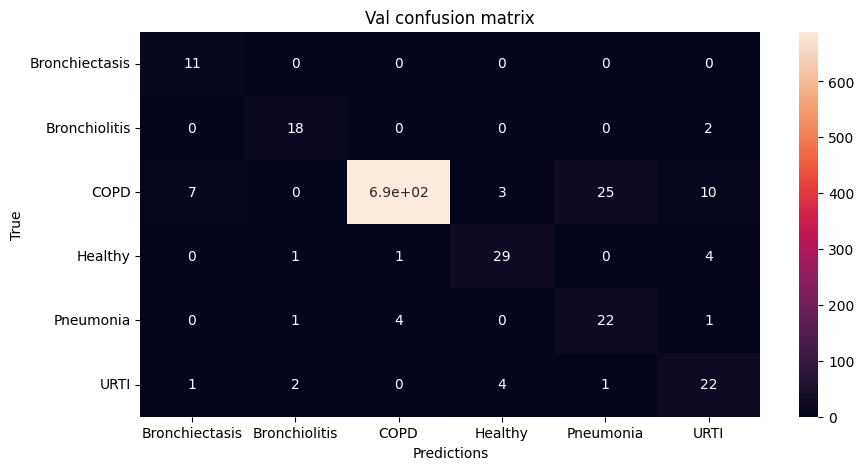


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 88:

Train Accuracy: 0.9587965838509317

Train Loss: 0.14223627785440557

Train F1 Score: 0.952931955734395

Val Accuracy: 0.9427528490028491
\Val Loss: 0.29198930896732406

Val F1 Score: 0.7442448139190674




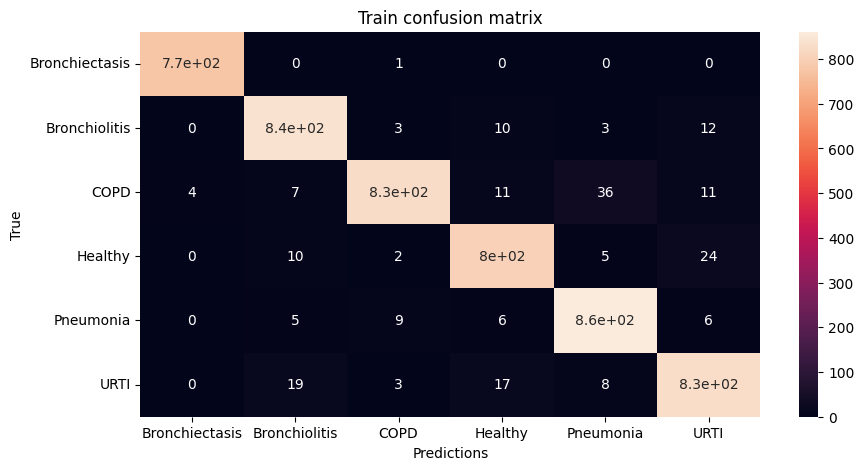

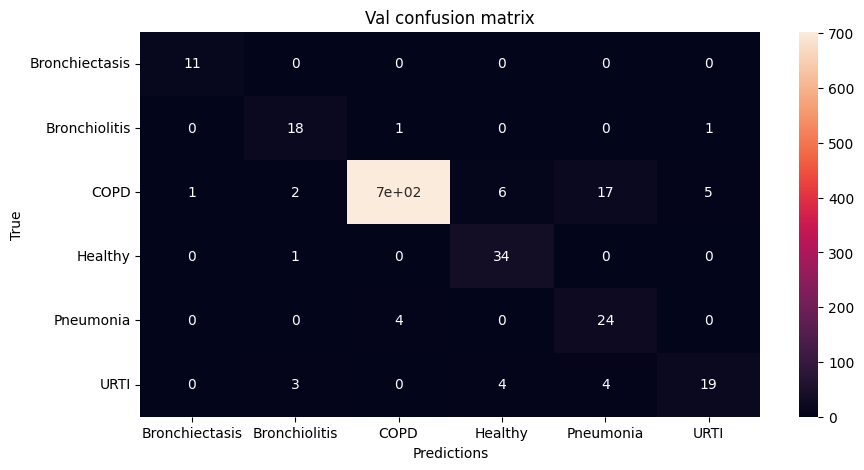


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 89:

Train Accuracy: 0.9518090062111801

Train Loss: 0.14969924387308012

Train F1 Score: 0.9432543316242857

Val Accuracy: 0.9188034188034188
\Val Loss: 0.31604279505295885

Val F1 Score: 0.713132361570994




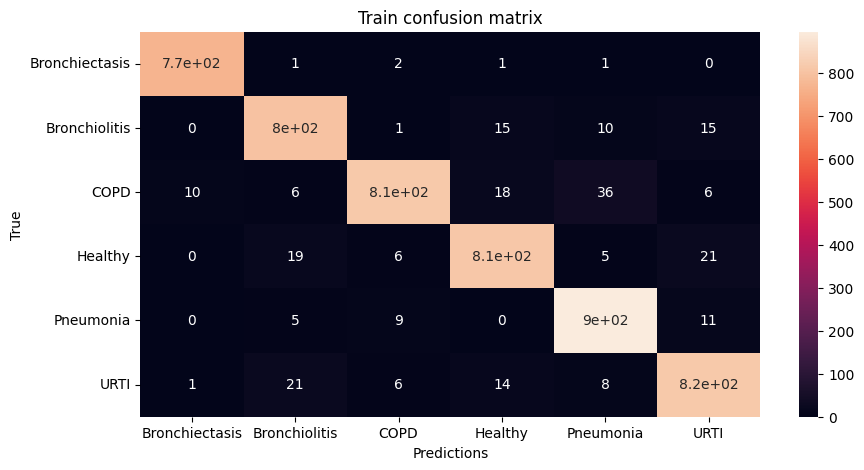

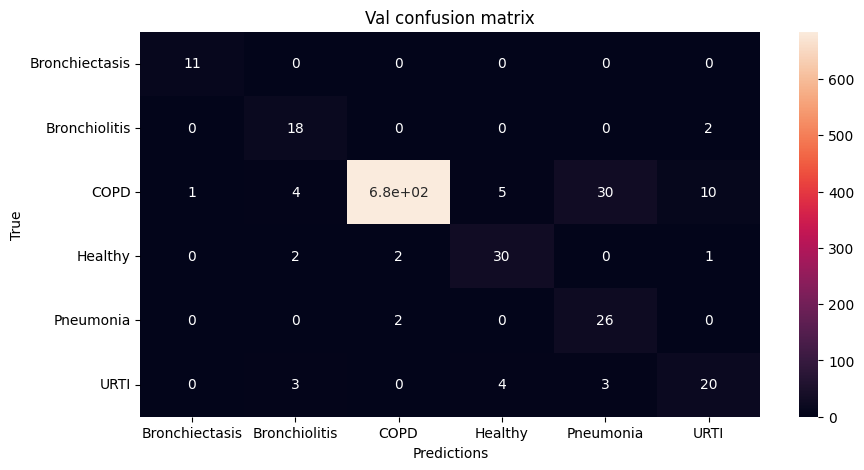


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 90:

Train Accuracy: 0.9597127329192546

Train Loss: 0.1314490524869736

Train F1 Score: 0.9563850405053322

Val Accuracy: 0.917289886039886
\Val Loss: 0.3610582546917377

Val F1 Score: 0.7190778001591012




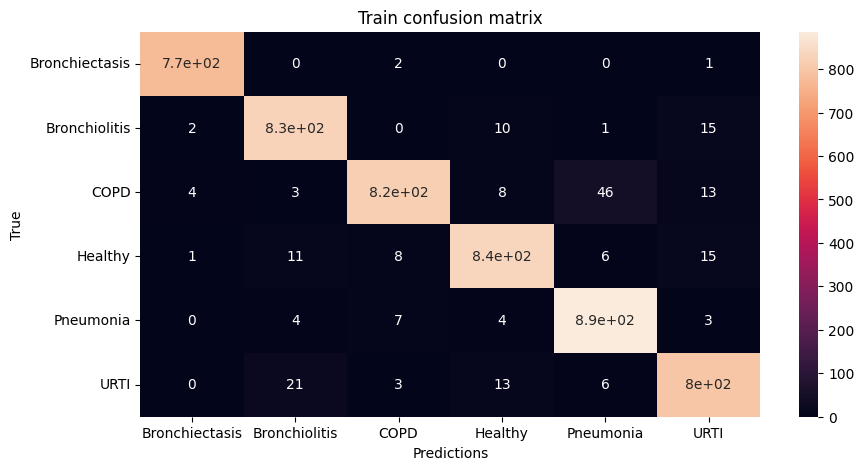

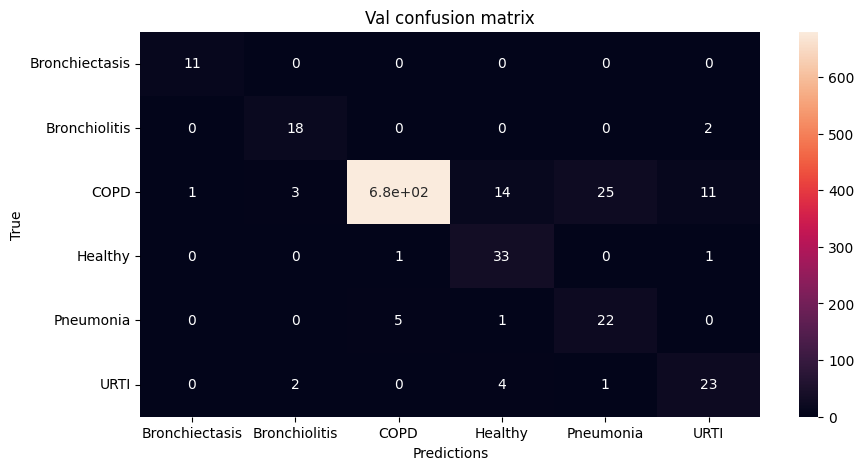


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 91:

Train Accuracy: 0.9602950310559005

Train Loss: 0.14127054549059512

Train F1 Score: 0.9561038028379405

Val Accuracy: 0.8996616809116809
\Val Loss: 0.325285312305722

Val F1 Score: 0.6713998328756403




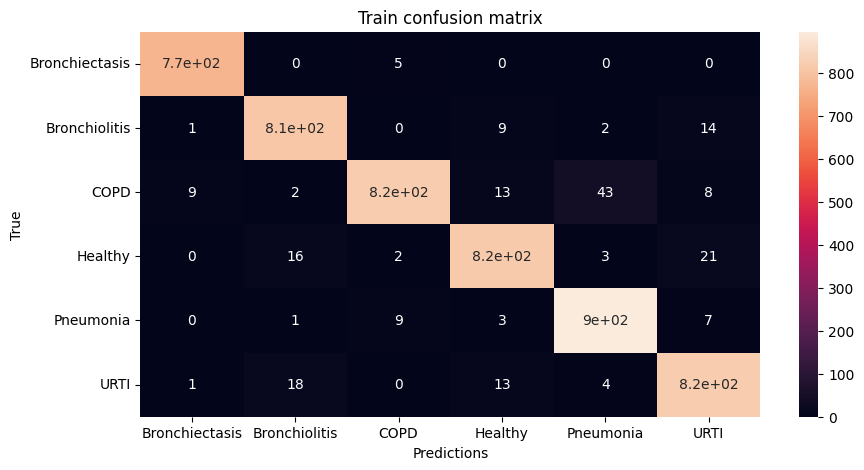

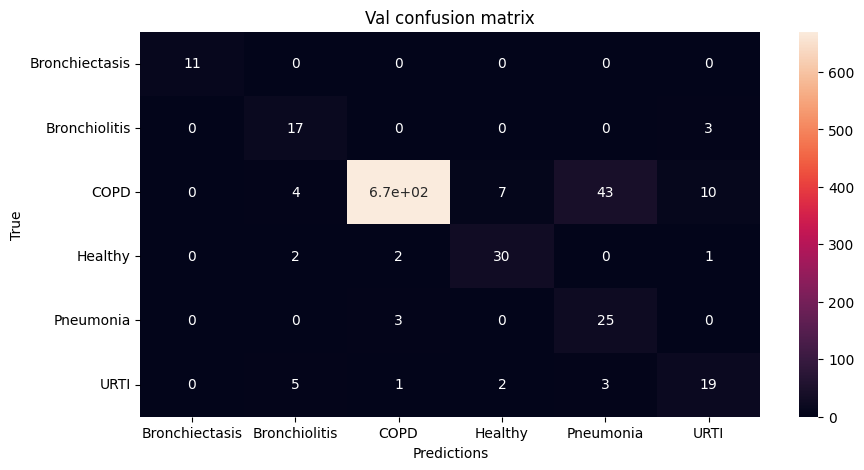


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 92:

Train Accuracy: 0.9656444099378882

Train Loss: 0.10647354149172858

Train F1 Score: 0.9599589412997228

Val Accuracy: 0.905715811965812
\Val Loss: 0.49321421409991606

Val F1 Score: 0.7016927025936268




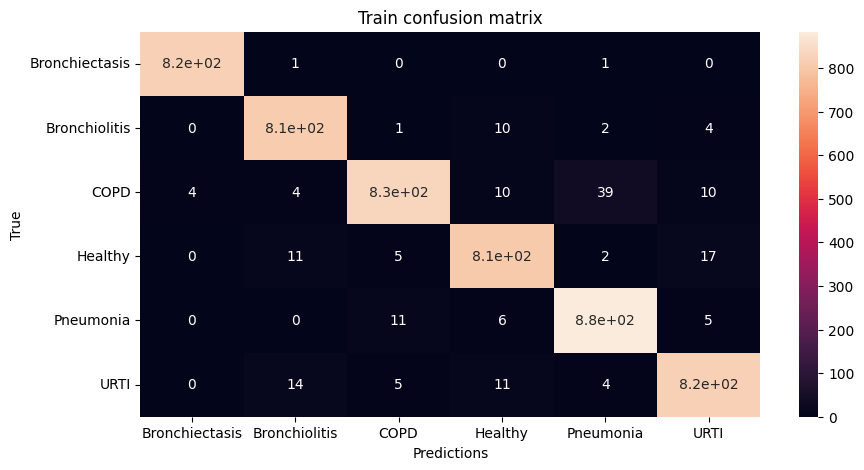

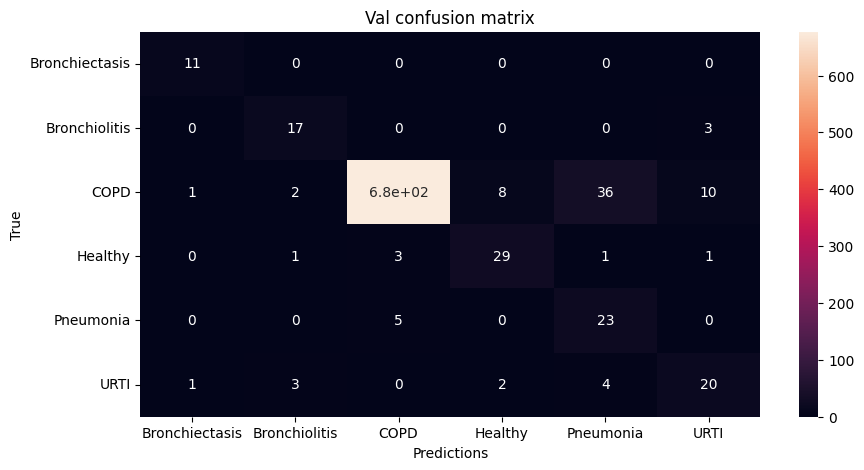


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 93:

Train Accuracy: 0.9726319875776398

Train Loss: 0.0965500486065975

Train F1 Score: 0.9698607362575412

Val Accuracy: 0.9131944444444444
\Val Loss: 0.3833670860967012

Val F1 Score: 0.7085902779190628




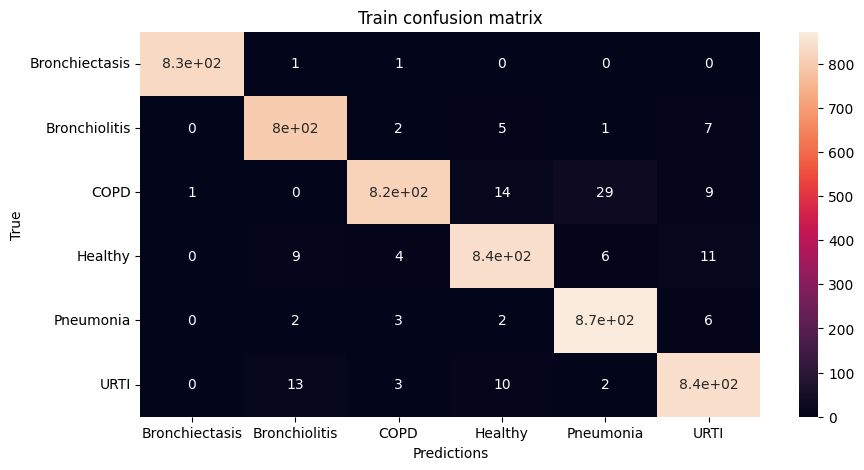

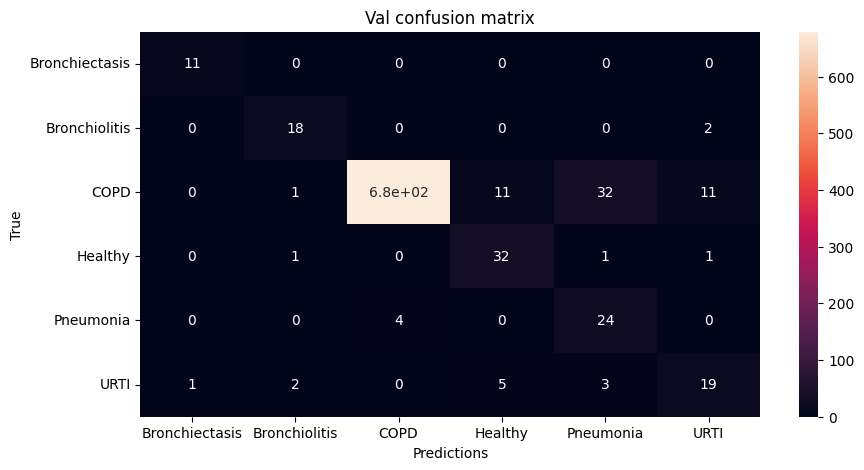


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 94:

Train Accuracy: 0.9763198757763976

Train Loss: 0.0814356485104061

Train F1 Score: 0.9745334301676069

Val Accuracy: 0.9260149572649573
\Val Loss: 0.3576935039902175

Val F1 Score: 0.7385538970982587




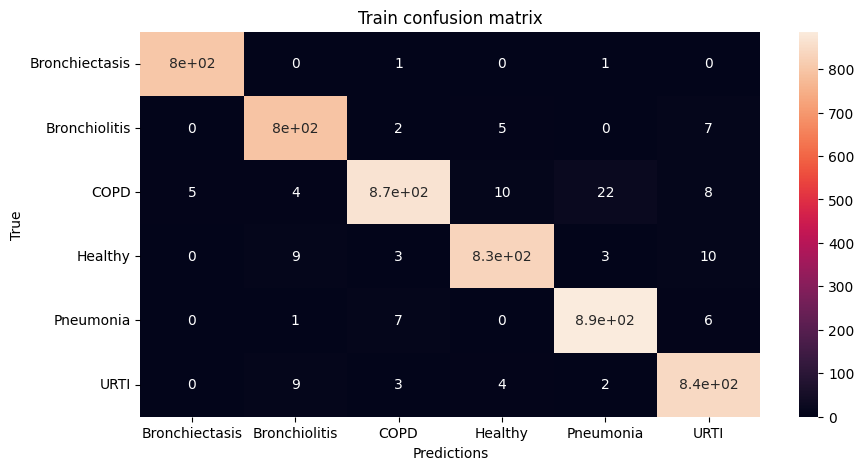

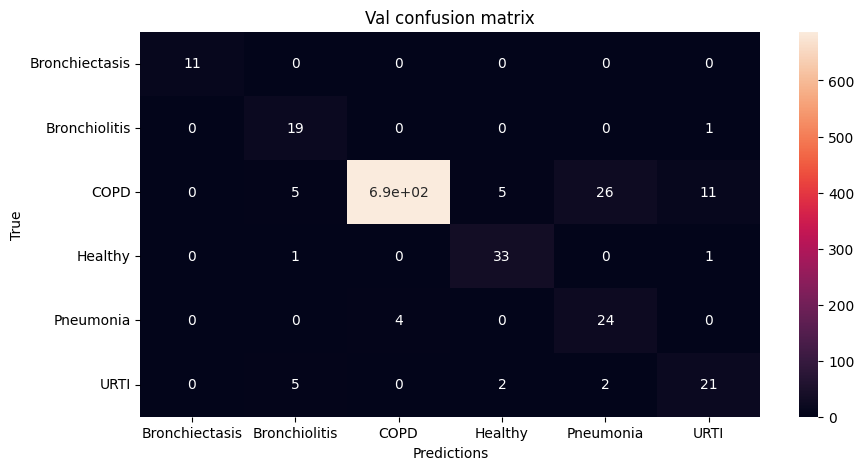


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 95:

Train Accuracy: 0.9561645962732919

Train Loss: 0.14258810005480457

Train F1 Score: 0.9506079269492108

Val Accuracy: 0.9149750712250713
\Val Loss: 0.3829305788019189

Val F1 Score: 0.7136560126587197




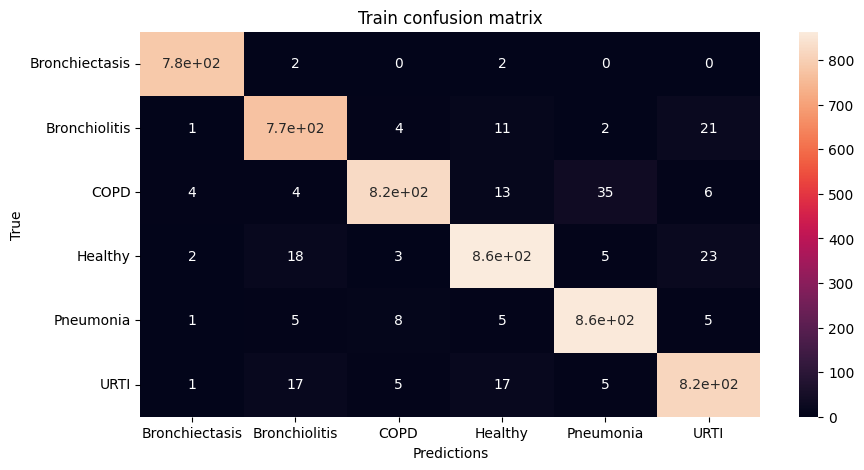

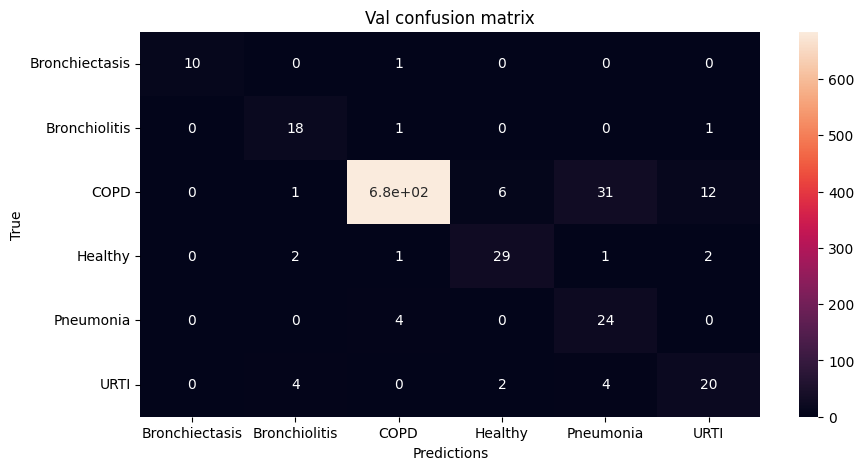


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 96:

Train Accuracy: 0.9703027950310559

Train Loss: 0.0992105016224549

Train F1 Score: 0.9667489373165629

Val Accuracy: 0.9212962962962963
\Val Loss: 0.35556939653017455

Val F1 Score: 0.7019660174846649




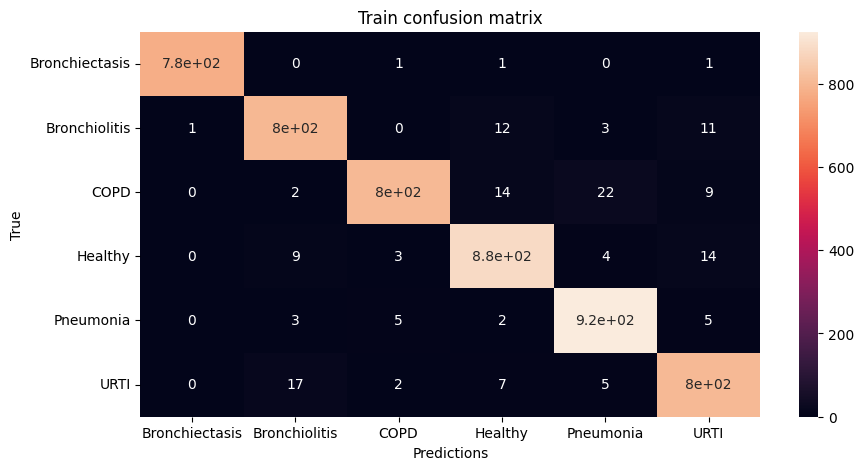

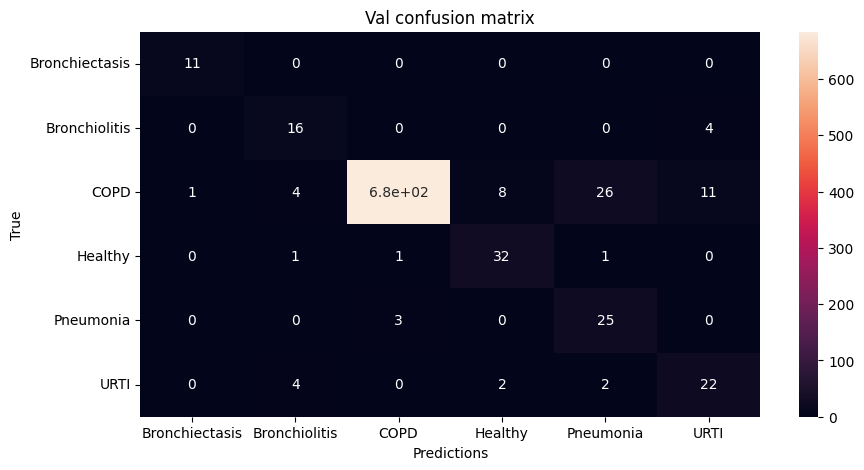


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 97:

Train Accuracy: 0.9681133540372672

Train Loss: 0.10461500849826436

Train F1 Score: 0.9642275882803876

Val Accuracy: 0.9017094017094017
\Val Loss: 0.3825474556673456

Val F1 Score: 0.6475813973833013




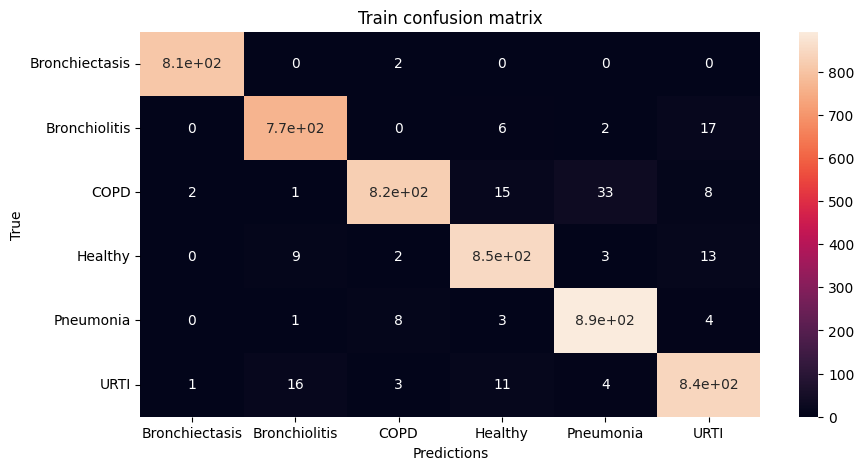

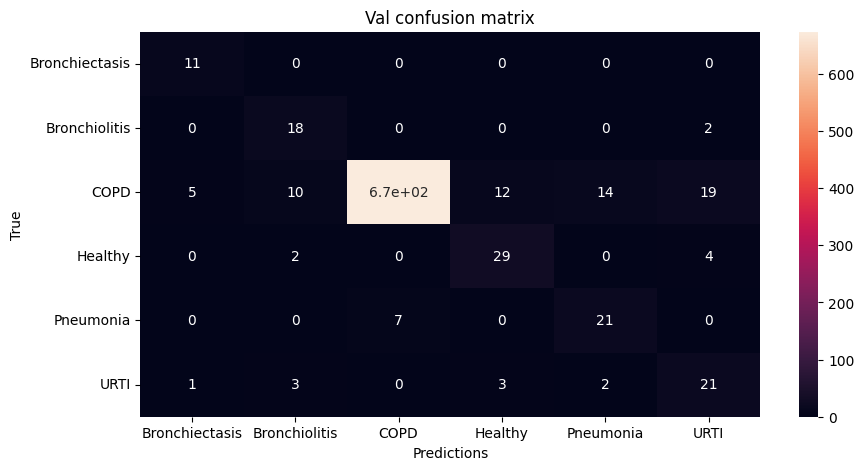


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 98:

Train Accuracy: 0.968361801242236

Train Loss: 0.10078081311310948

Train F1 Score: 0.965515721288527

Val Accuracy: 0.9261039886039887
\Val Loss: 0.3309797171365332

Val F1 Score: 0.7358691173571127




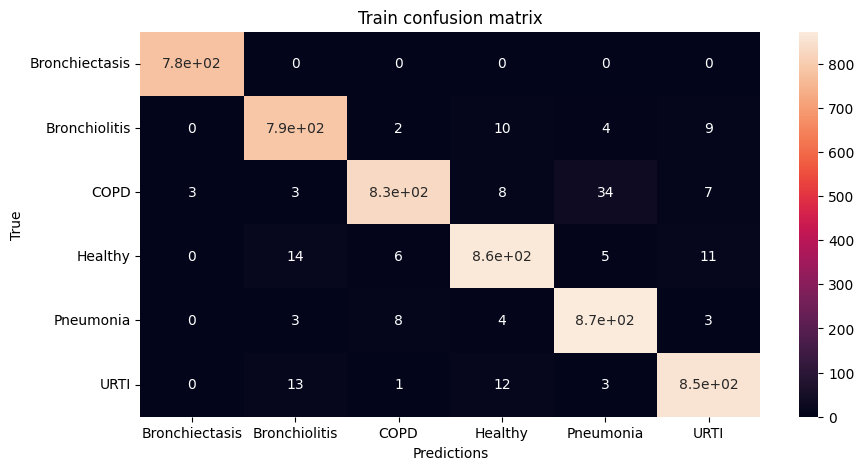

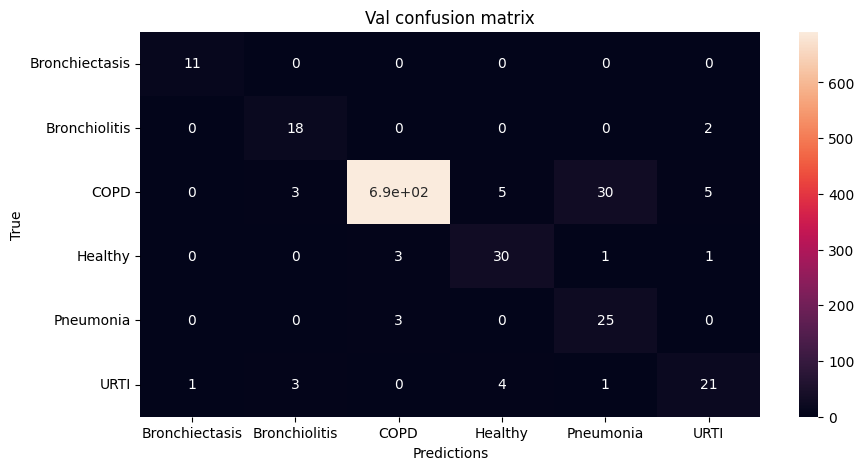


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 99:

Train Accuracy: 0.9526708074534161

Train Loss: 0.15361011853753964

Train F1 Score: 0.9475499769175275

Val Accuracy: 0.9022435897435898
\Val Loss: 0.33574277466094055

Val F1 Score: 0.6575394184501083




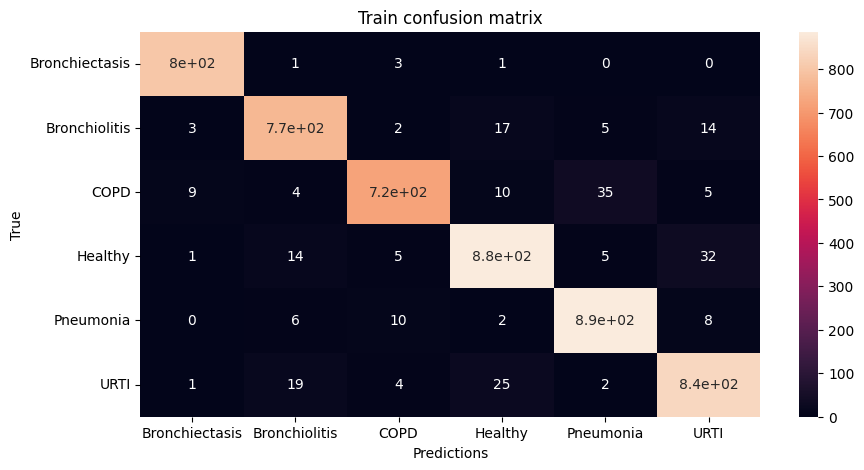

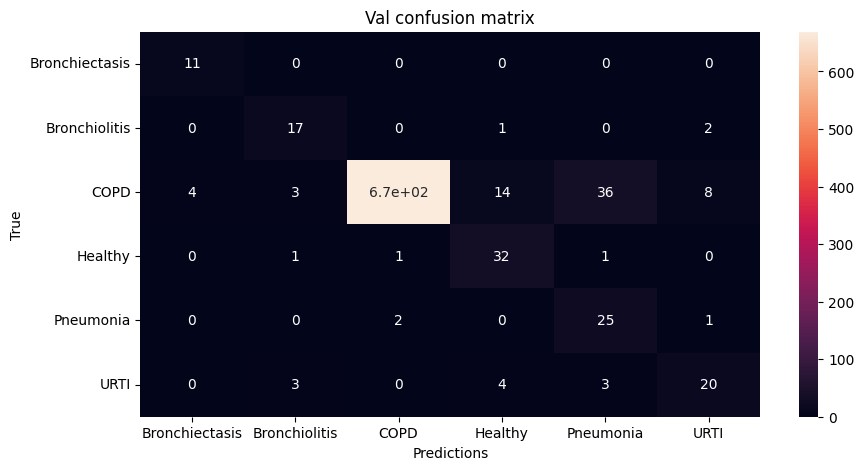


Training:


  0%|          | 0/161 [00:00<?, ?it/s]

Testing:


  0%|          | 0/27 [00:00<?, ?it/s]


Epoch 100:

Train Accuracy: 0.95472049689441

Train Loss: 0.14433742443573958

Train F1 Score: 0.9484752316652618

Val Accuracy: 0.9378561253561253
\Val Loss: 0.32955875896193365

Val F1 Score: 0.7384414297563059




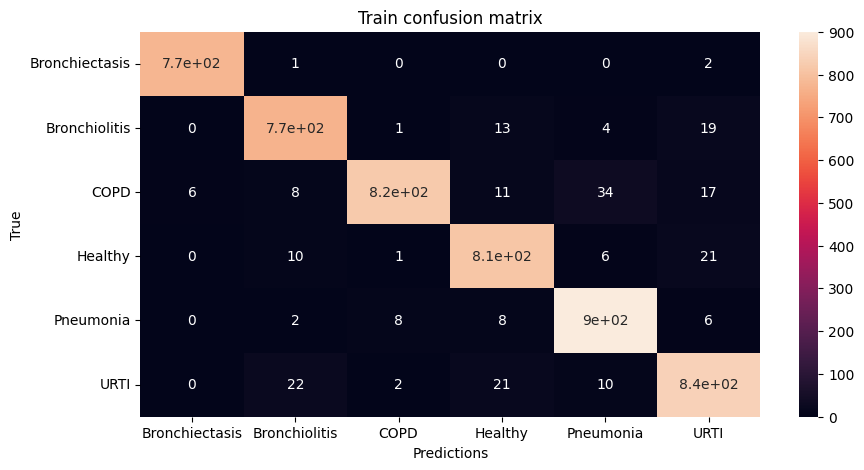

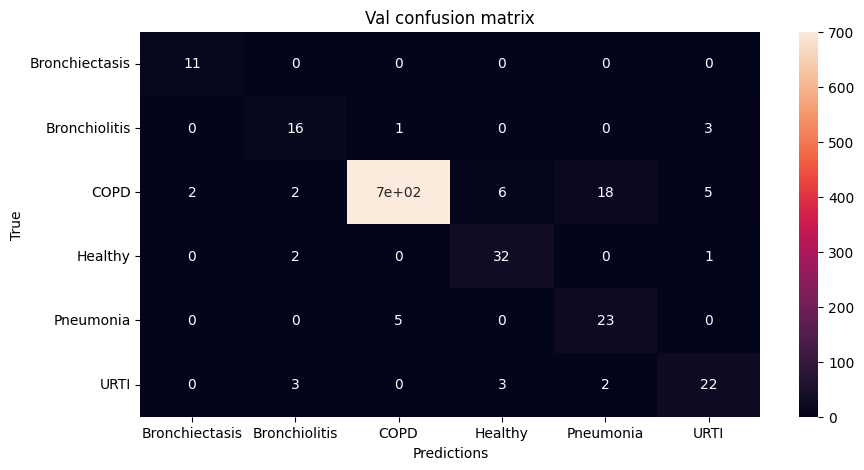

In [21]:
epochs=100
train_model(model1,epochs)

In [24]:
def test_model(model):
    loss_fn=nn.CrossEntropyLoss()

    train_preds=torch.tensor([])
    test_preds=torch.tensor([])
    train_actual=torch.tensor([])
    test_actual=torch.tensor([])
    
    print("\nTraining:")
    model.train()
    
    #Defining accuracy and loss for train and test ds
    temp_test_accuracy=[]
    temp_test_loss=[]
    temp_test_f1=[]

    net_test_accuracy=0
    net_test_loss=0
    net_test_f1=0

    with tqdm_notebook(total=len(test_loader)) as pbar2:
        for x,y in test_loader:
            x=x.to(device)
            y=y.to(device)
            
            #Setting inference mode
            with torch.inference_mode():
                logits=model(x)
                loss=loss_fn(logits.squeeze().type(torch.float32),y)
    
                #Track of metrics
                preds=torch.argmax(torch.softmax(logits,dim=1),dim=1).squeeze()
                test_preds=torch.hstack((test_preds,preds.to("cpu")))
                test_actual=torch.hstack((test_actual,y.to("cpu")))
                accuracy_test=accuracy_fn(logits,y)
                f1_test=f1_fn(preds,y)
                temp_test_accuracy.append(accuracy_test)
                temp_test_loss.append(loss.item())
                temp_test_f1.append(f1_test.item())
    
                #Progress Bar Update
                pbar2.update(1)
        pbar2.close()

    net_test_accuracy=sum(temp_test_accuracy)/len(temp_test_accuracy)
    net_test_loss=sum(temp_test_loss)/len(temp_test_loss)
    net_test_f1=sum(temp_test_f1)/len(temp_test_f1)

    print(f"\nTest Accuracy: {net_test_accuracy}\n\nTest Loss: {net_test_loss}\n\nTest F1 Score: {net_test_f1}")

    print("\n")
    plt.figure(figsize=(10,5))
    sb.heatmap(cf_matrix(test_preds,test_actual),annot=True,xticklabels=train_ds.classes,yticklabels=train_ds.classes)
    plt.title("Testing confusion matrix")
    plt.xlabel("Predictions")
    plt.ylabel("True")
    plt.show()


Training:


  0%|          | 0/27 [00:00<?, ?it/s]


Test Accuracy: 0.9267592592592593

Test Loss: 0.31708464945700987

Test F1 Score: 0.7700087361865573




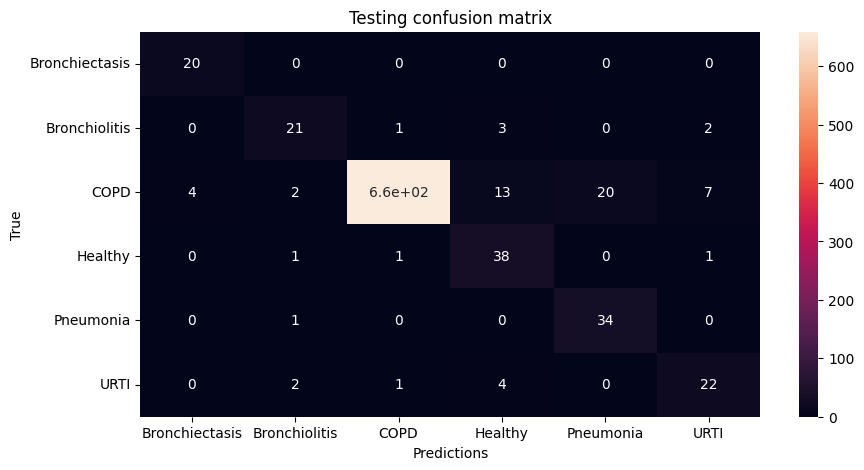

In [25]:
test_model(model1)

In [27]:
torch.save(model1.state_dict(),"../models/model_conv1d_77f1.pt")